# SAE on Normal NN MNIST w/Probe

Testing our linear probe to validate what our SAE learned.

In [1]:
import time

EXPERIMENT_TYPE = "SAE"
RUN_ID = time.time()

## SAE Params

In [2]:
HIDDEN_SIZE = 256
L1_PENALTY = 0.01

## Imports

In [3]:
import random
import copy

import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader

from tqdm import tqdm

In [4]:
from graph_helpers import (plot_weights,
                    plot_activations,
                    plot_losses,
                    plot_saliency_map,
                    plot_sparse_vecs_by_image,
                    plot_top_act_images_by_feature
                )

In [5]:
import sys, os
from pathlib import Path

# assume cwd is project_root/data_loader
project_root = Path(os.getcwd()).parent  # go up one level to project_root
sys.path.insert(0, str(project_root))

from helpers import load_images, load_labels, visualize_image, get_edges, generate_intermediate_edge_labels

## Set Device to GPU

In [6]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"We will be using device: {device}")

We will be using device: cuda


## Load Data

In [7]:
# train data
train_images = load_images("../data/train-images-idx3-ubyte/train-images-idx3-ubyte")
train_labels = load_labels("../data/train-labels-idx1-ubyte/train-labels-idx1-ubyte")

train_images, val_images, train_labels, val_labels = train_test_split(
    train_images, train_labels,
    test_size=1/6,  # 10k validation
    stratify=train_labels,
    random_state=42  # for reproducibility
)

# test data
test_images = load_images("../data/t10k-images-idx3-ubyte/t10k-images-idx3-ubyte")
test_labels = load_labels("../data/t10k-labels-idx1-ubyte/t10k-labels-idx1-ubyte")

In [8]:
print("Train images shape:", train_images.shape)
print("Val images shape:", val_images.shape)
print("Test images shape:", test_images.shape)

Train images shape: (50000, 28, 28)
Val images shape: (10000, 28, 28)
Test images shape: (10000, 28, 28)


## Visualize an image

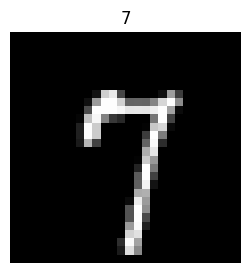

In [9]:
sample_image = train_images[0]
sample_label = train_labels[0]
visualize_image(sample_image, sample_label)

## Architecture

### NN

Once again, two hidden layers. 16 nodes each. Same as 3blue1brown.

In [10]:
class NeuralNetwork(nn.Module):
    def __init__(self):
        super().__init__()
        layer_size_by_pixels = 28*28
        
        self.flatten = nn.Flatten()
        
        # define layers separately to have access to each
        self.hidden_one = nn.Linear(layer_size_by_pixels, 16)
        self.hidden_two = nn.Linear(16, 16)
        self.classification_layer = nn.Linear(16, 10)
        
        self.activation_function = nn.ReLU()

    def forward(self, x):
        x = self.flatten(x)

        # first hidden layer
        hidden_one_out = self.hidden_one(x)
        hidden_one_act = self.activation_function(hidden_one_out)

        # second hidden layer
        hidden_two_out = self.hidden_two(hidden_one_act)
        hidden_two_act = self.activation_function(hidden_two_out)

        # classification layer
        classification_out = self.classification_layer(hidden_two_act)
        
        return classification_out, hidden_one_act, hidden_two_act

In [11]:
# for reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

In [12]:
model = NeuralNetwork().to(device)

# loss functions
classification_loss_fn = nn.CrossEntropyLoss()

# optimizers
optimizer = torch.optim.Adam(model.parameters())

In [13]:
print(f"Model weights (to compare below): {model.hidden_one.weight[0][:5].detach().cpu().numpy()}")

Model weights (to compare below): [ 0.02730495  0.02964314 -0.00836687  0.03280755 -0.00782513]


### SAE

In [14]:
class SparseAutoencoder(nn.Module):
    def __init__(self, input_size=16, hidden_size=128):
        super().__init__()
        self.encoder = nn.Linear(input_size, hidden_size)
        self.decoder = nn.Linear(hidden_size, input_size)
        self.activation = nn.ReLU()
    
    def forward(self, x):
        encoded = self.activation(self.encoder(x))
        reconstructed = self.decoder(encoded)
        return reconstructed, encoded
    
    def loss(self, x, reconstructed, encoded, l1_lambda=0.001):
        mse_loss = nn.MSELoss()(reconstructed, x)
        l1_loss = l1_lambda * torch.mean(torch.abs(encoded))
        return mse_loss + l1_loss

In [15]:
# for reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    
sae_hidden_two = SparseAutoencoder(input_size=16, hidden_size=HIDDEN_SIZE).to(device)
optimizer_sae_hidden_two = torch.optim.Adam(sae_hidden_two.parameters())

In [16]:
# expectation: SAE weights: [ 0.19113463  0.20750198 -0.05856812  0.22965282 -0.05477589]
print(f"SAE weights: {sae_hidden_two.encoder.weight[0][:5].detach().cpu().numpy()}")

SAE weights: [ 0.19113463  0.20750198 -0.05856812  0.22965282 -0.05477589]


In [17]:
# for reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    
sae_hidden_one = SparseAutoencoder(input_size=16, hidden_size=HIDDEN_SIZE).to(device)
optimizer_sae_hidden_one = torch.optim.Adam(sae_hidden_one.parameters())

In [18]:
# expectation: SAE weights: [ 0.19113463  0.20750198 -0.05856812  0.22965282 -0.05477589]
print(f"SAE weights: {sae_hidden_one.encoder.weight[0][:5].detach().cpu().numpy()}")

SAE weights: [ 0.19113463  0.20750198 -0.05856812  0.22965282 -0.05477589]


### Verify Reproducibility

In [19]:
# reset the seed
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)
    
model_compare_one = NeuralNetwork().to(device)
first_set_of_weights = model_compare_one.hidden_one.weight[0][:5].detach().cpu().numpy()
print("First set of weights:", first_set_of_weights)

# reset the seed
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

model_compare_two = NeuralNetwork().to(device)
second_set_of_weights = model_compare_two.hidden_one.weight[0][:5].detach().cpu().numpy()
print("Second set of weights:", second_set_of_weights)

print(f"Are the two sets equal: {first_set_of_weights == second_set_of_weights}")

First set of weights: [ 0.02730495  0.02964314 -0.00836687  0.03280755 -0.00782513]
Second set of weights: [ 0.02730495  0.02964314 -0.00836687  0.03280755 -0.00782513]
Are the two sets equal: [ True  True  True  True  True]


## Dataloader

In [20]:
class EdgeDataset(Dataset):
    def __init__(self, images, labels):
        self.images = images
        self.labels = labels

    def __len__(self):
        assert len(self.images) == len(self.labels)
        return len(self.images)

    def __getitem__(self, idx):
        return (
            torch.from_numpy(self.images[idx].copy()).float(),
            torch.tensor(self.labels[idx].copy(), dtype=torch.long),
        )

In [21]:
# for reproducibility on training
def seed_worker(worker_id):
    worker_seed = torch.initial_seed() % 2**32
    np.random.seed(worker_seed)
    random.seed(worker_seed)

generator = torch.Generator().manual_seed(seed)

In [22]:
NUM_WORKERS = 4
if device.type.lower() == "cpu":
    NUM_WORKERS = 0

# training data
train_dataset = EdgeDataset(train_images, train_labels)
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=NUM_WORKERS, worker_init_fn=seed_worker, generator=generator)

# validation data
val_dataset = EdgeDataset(val_images, val_labels)
val_loader = DataLoader(val_dataset, batch_size=128, shuffle=False, num_workers=NUM_WORKERS)  # larger batch size for faster validation

# test data
test_dataset = EdgeDataset(test_images, test_labels)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False, num_workers=NUM_WORKERS)

## Training Loop

Epoch 1/20
  Train Loss: 1.0223
  SAE Train Loss (hidden one): 8.8025
  SAE Train Loss (hidden two): 1.1771
  Val Loss: 0.5656 | Val Acc: 83.62%
  Saved model with Val Acc: 83.62%


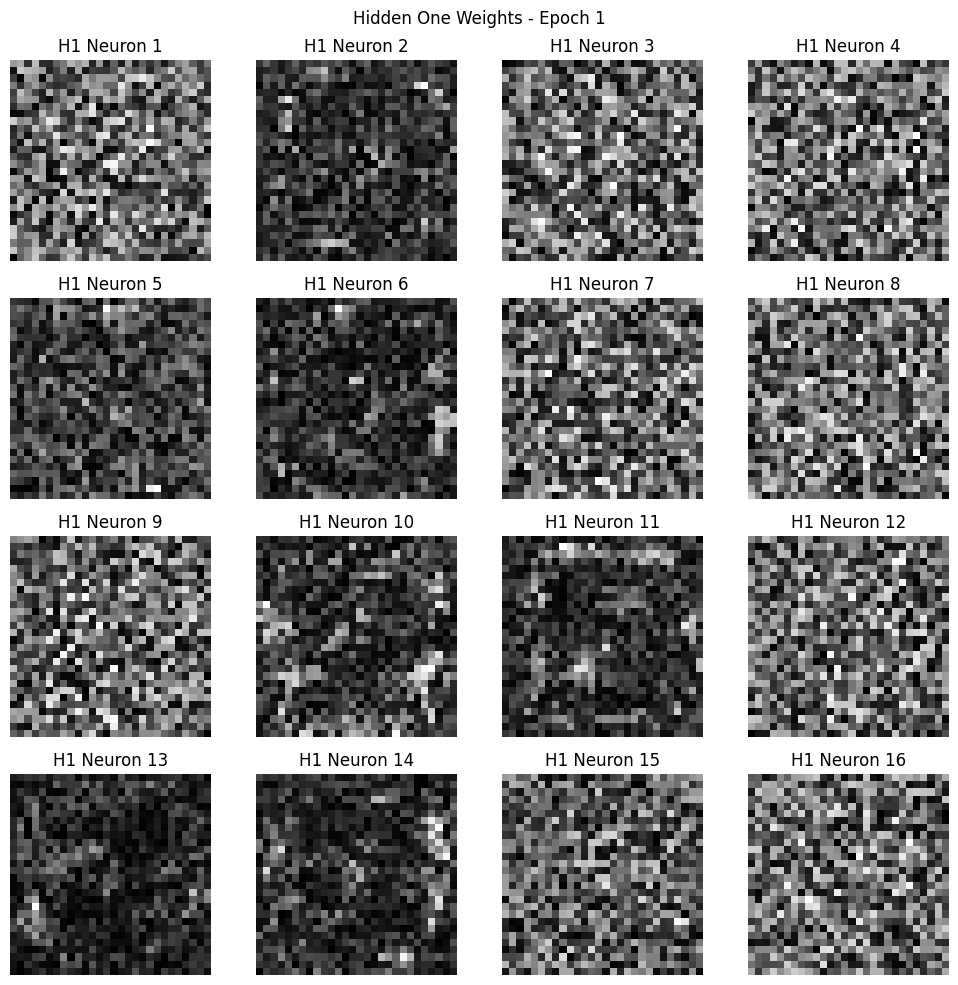

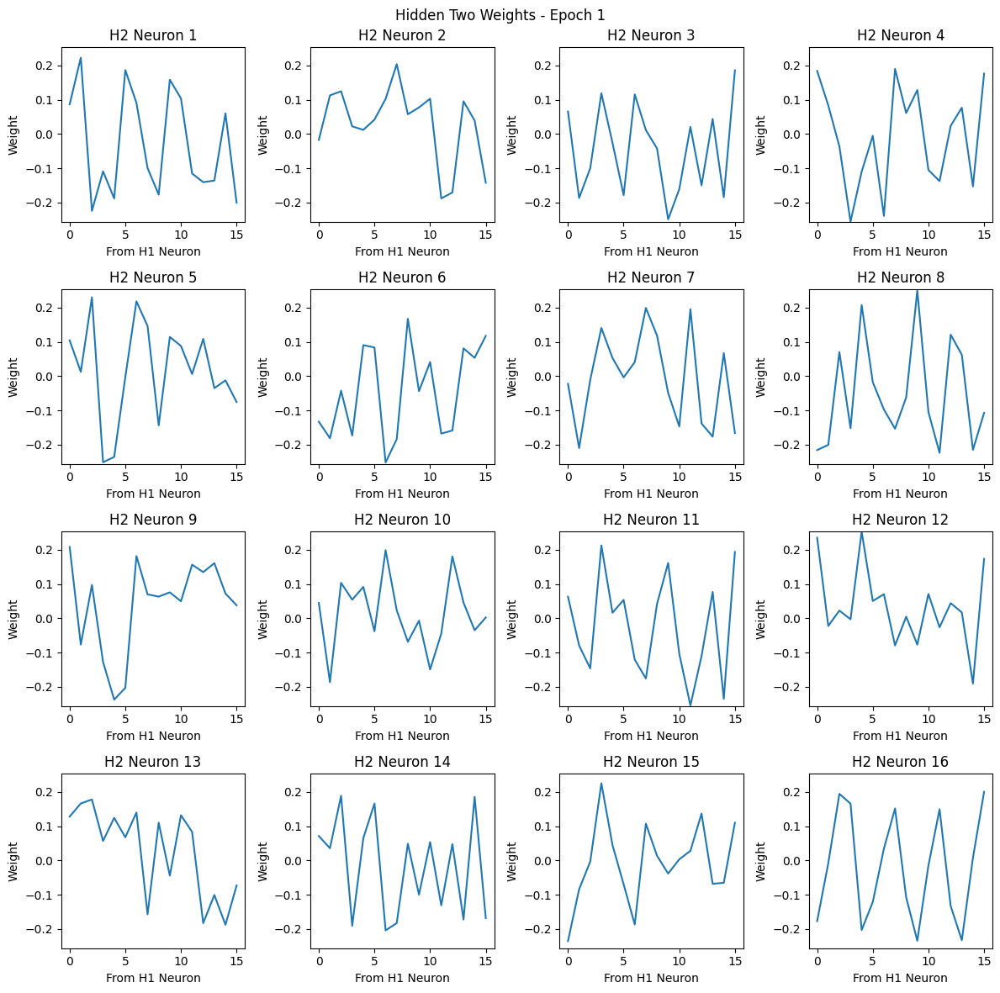

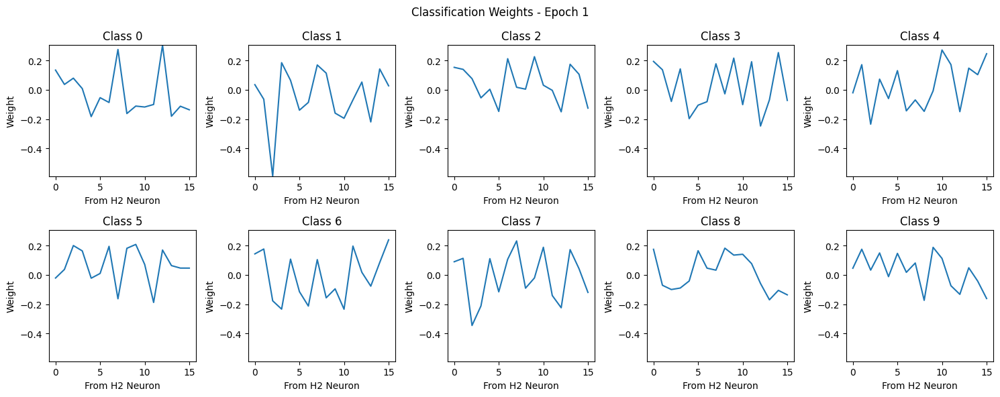

Epoch 2/20
  Train Loss: 0.4646
  SAE Train Loss (hidden one): 0.5374
  SAE Train Loss (hidden two): 0.1031
  Val Loss: 0.4460 | Val Acc: 86.46%
  Saved model with Val Acc: 86.46%


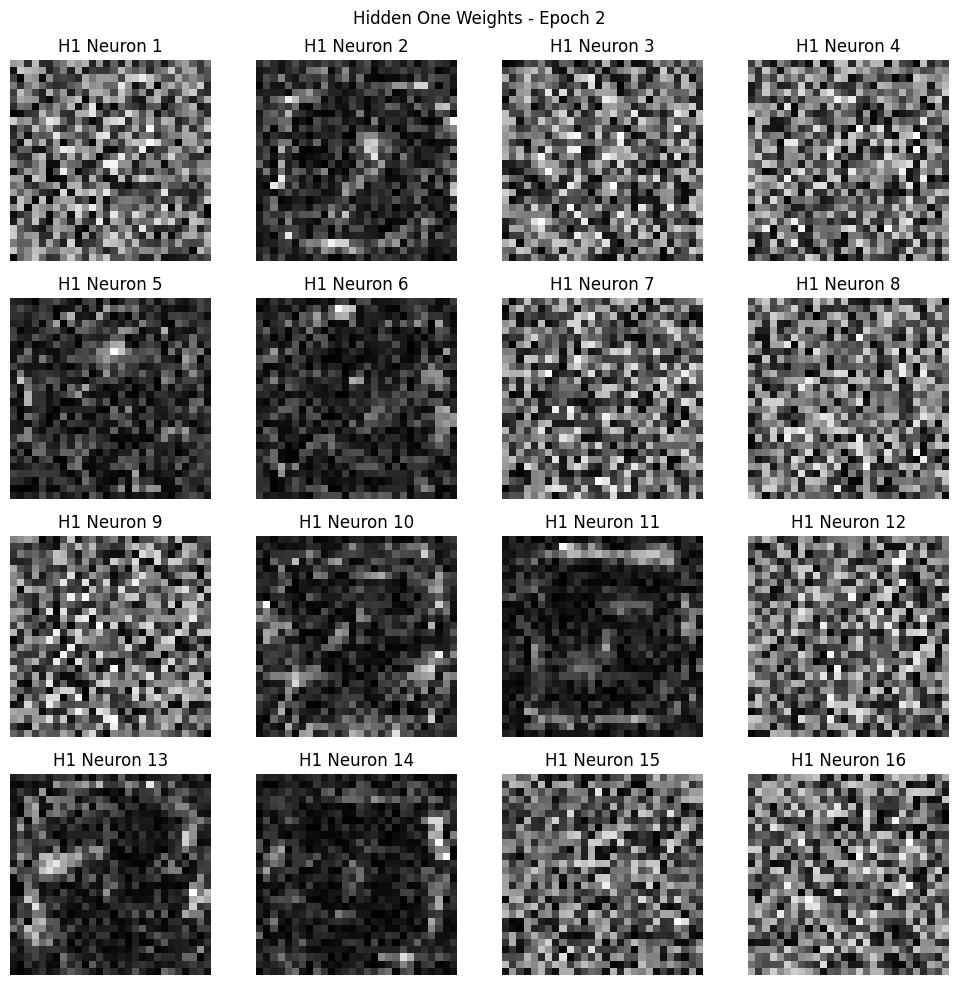

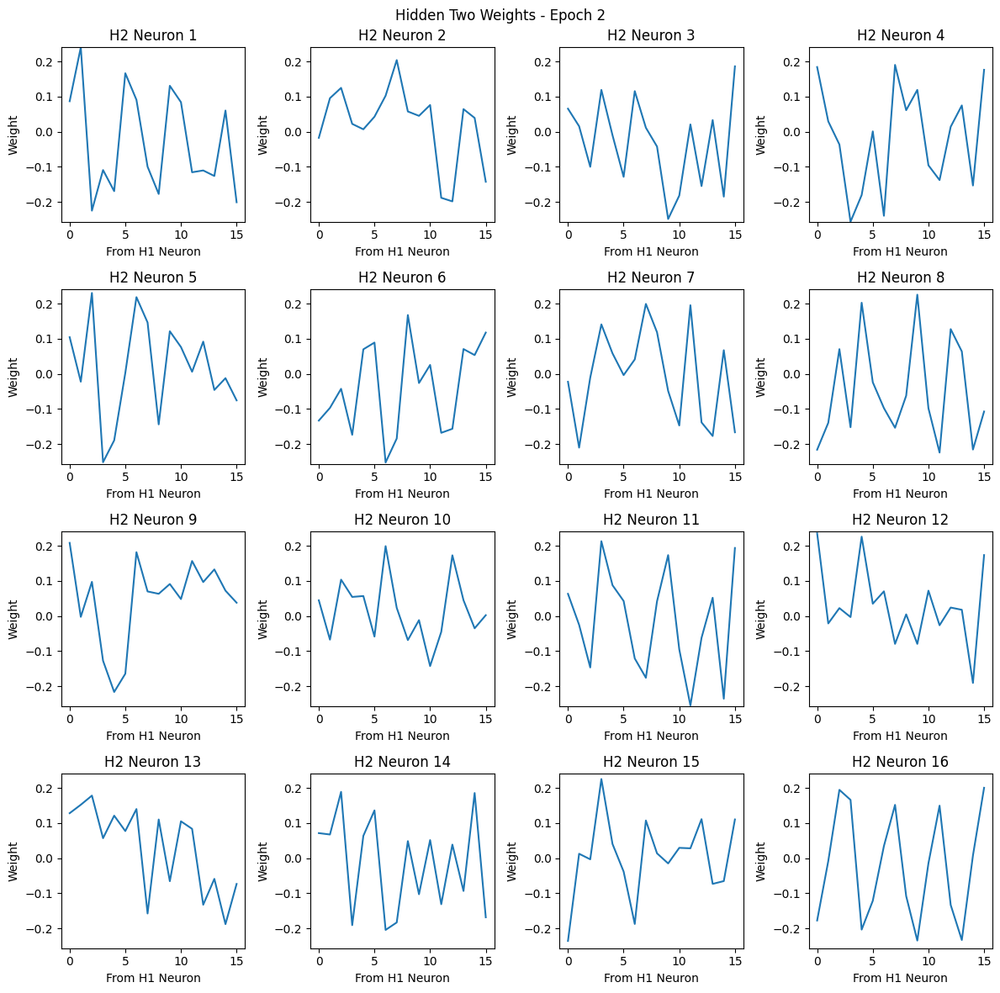

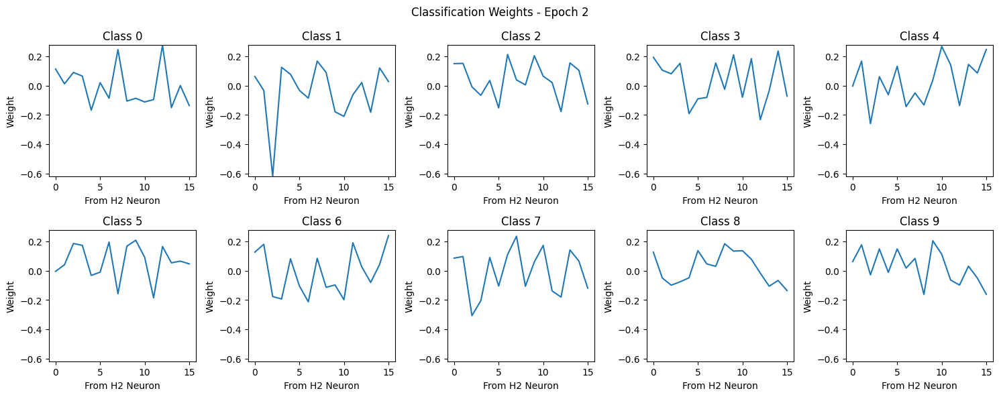

Epoch 3/20
  Train Loss: 0.3924
  SAE Train Loss (hidden one): 0.5168
  SAE Train Loss (hidden two): 0.0914
  Val Loss: 0.3987 | Val Acc: 88.16%
  Saved model with Val Acc: 88.16%


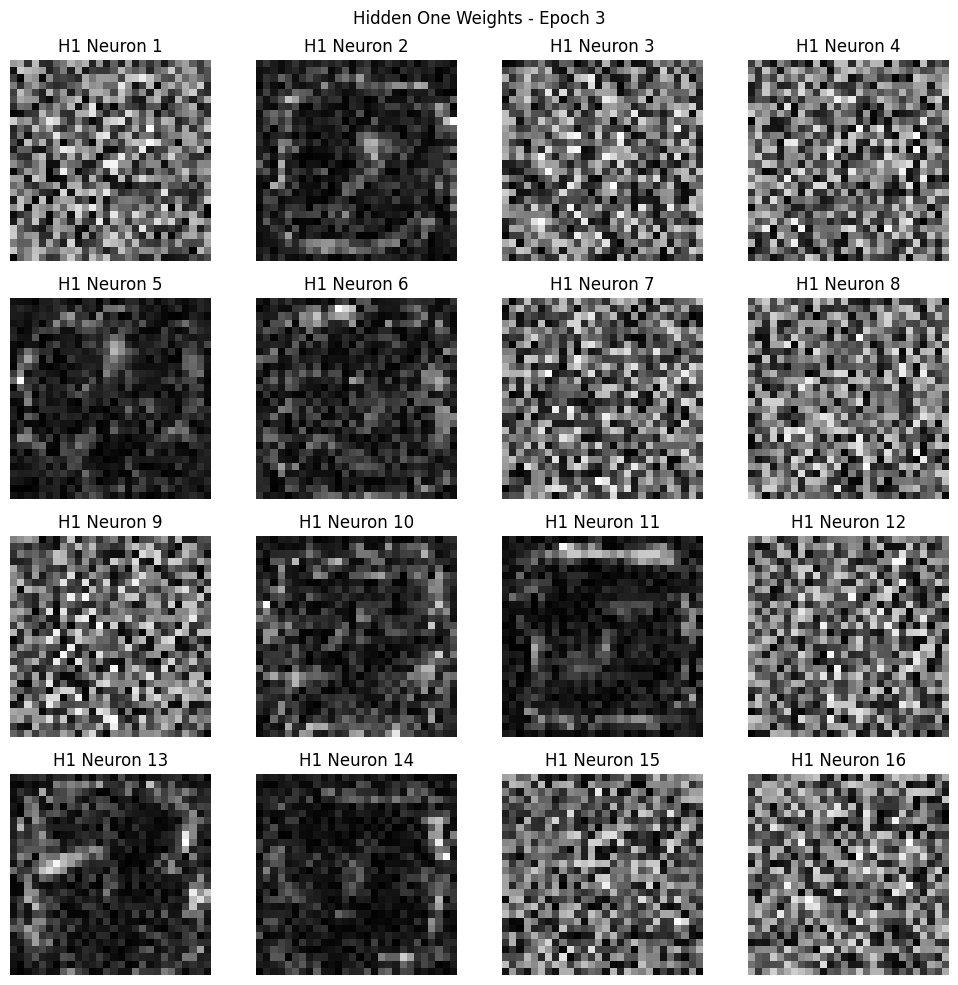

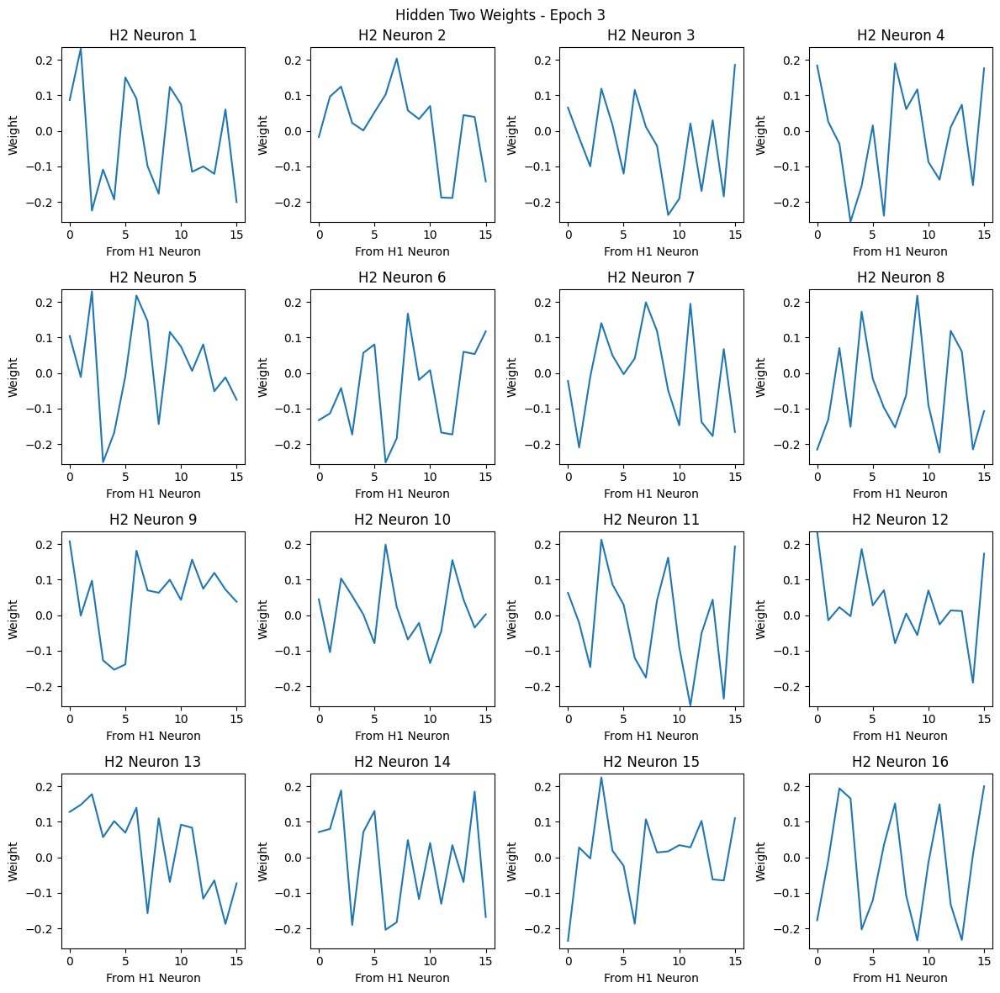

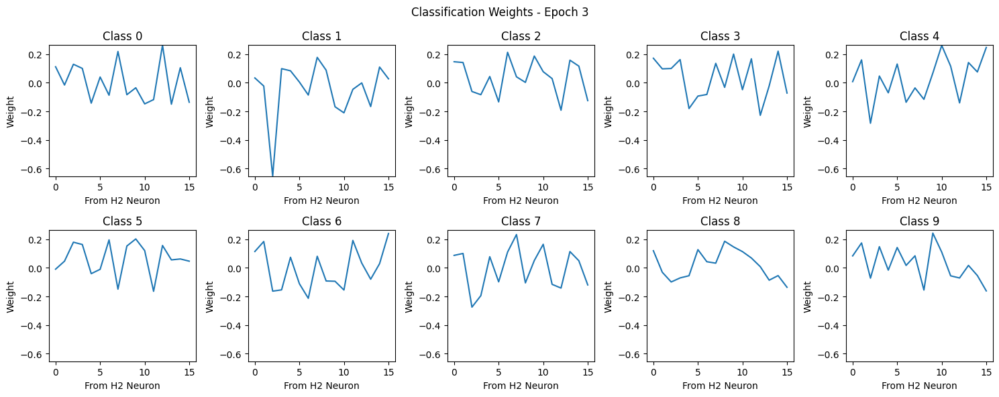

Epoch 4/20
  Train Loss: 0.3673
  SAE Train Loss (hidden one): 0.5392
  SAE Train Loss (hidden two): 0.0826
  Val Loss: 0.3996 | Val Acc: 88.18%
  Saved model with Val Acc: 88.18%


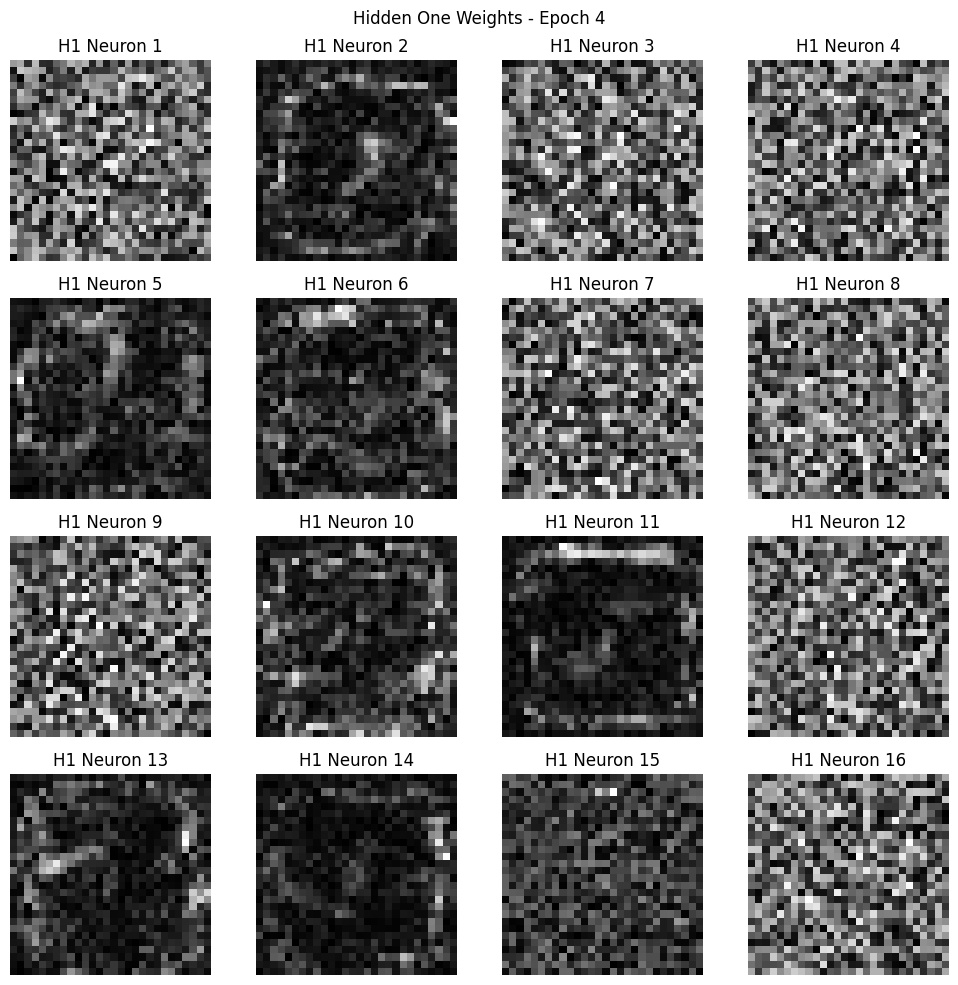

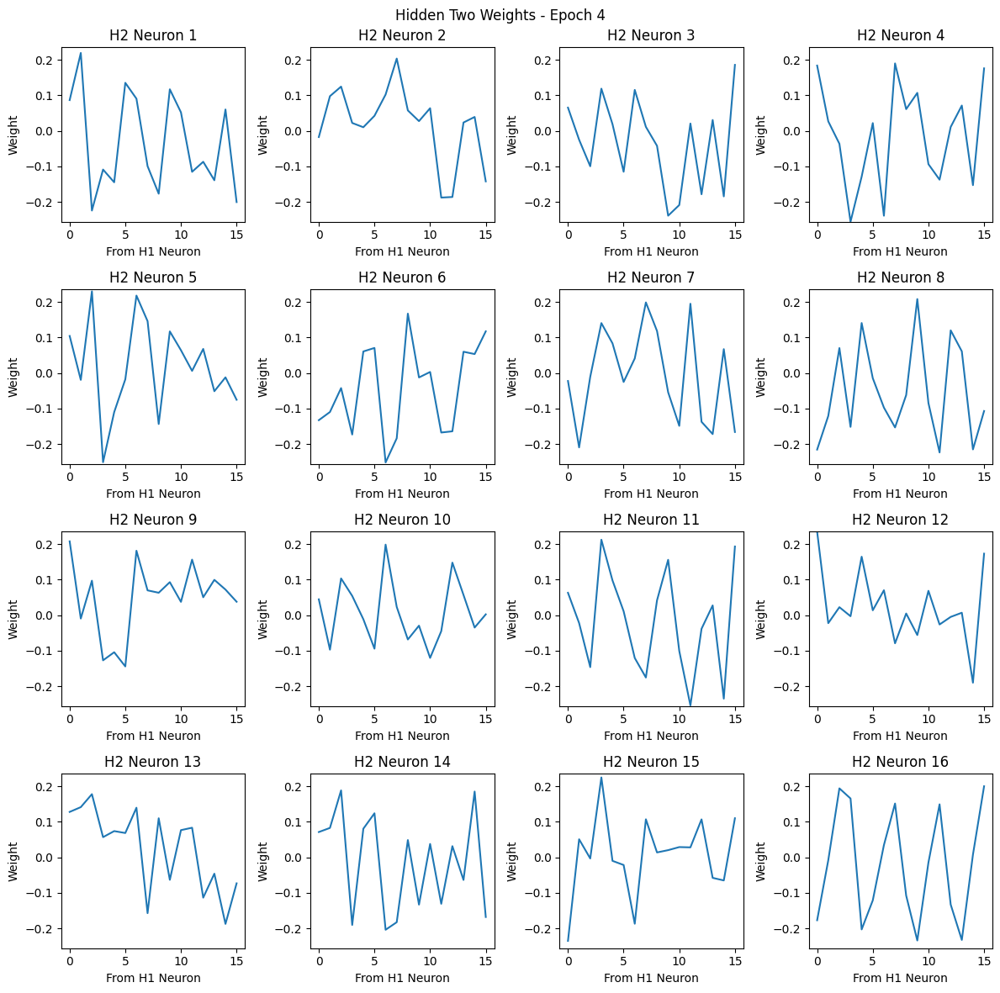

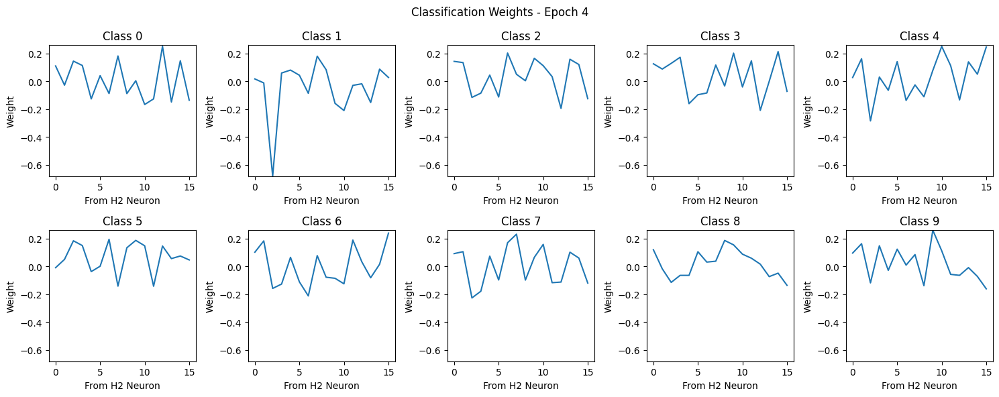

Epoch 5/20
  Train Loss: 0.3517
  SAE Train Loss (hidden one): 0.5301
  SAE Train Loss (hidden two): 0.0762
  Val Loss: 0.3552 | Val Acc: 89.42%
  Saved model with Val Acc: 89.42%


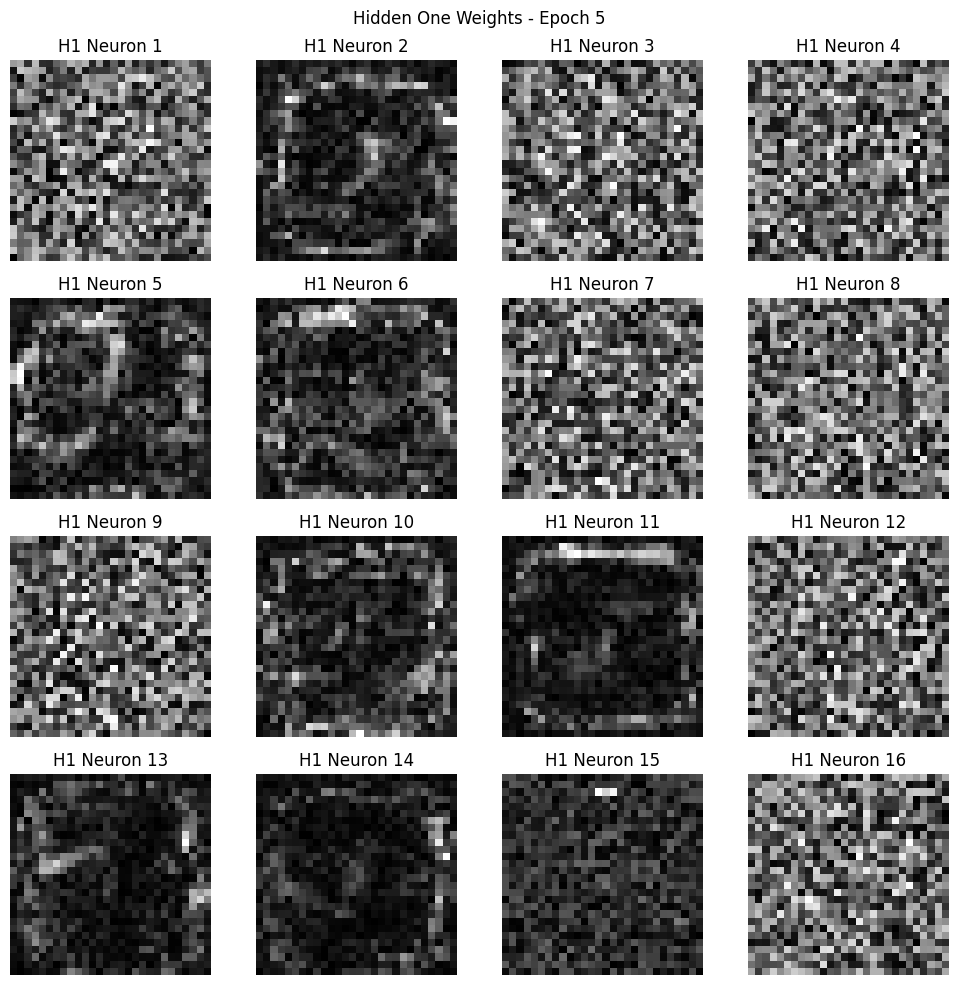

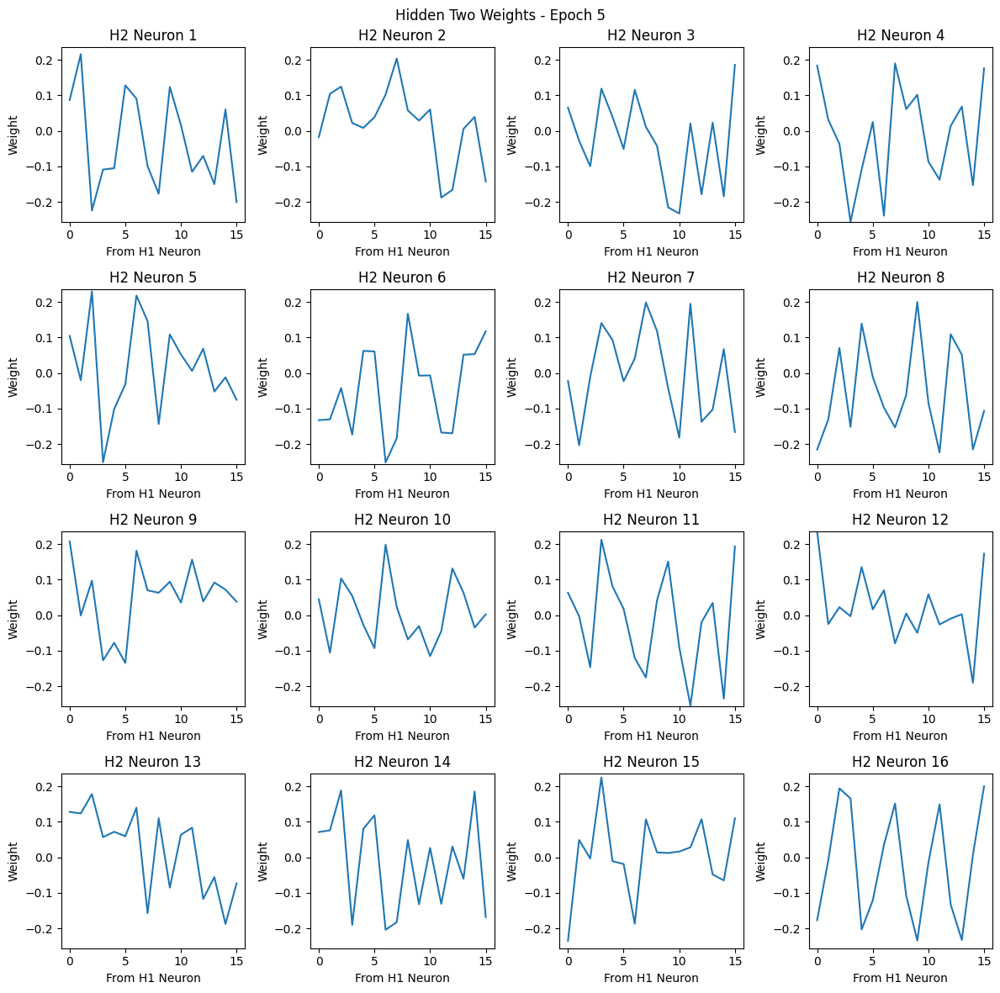

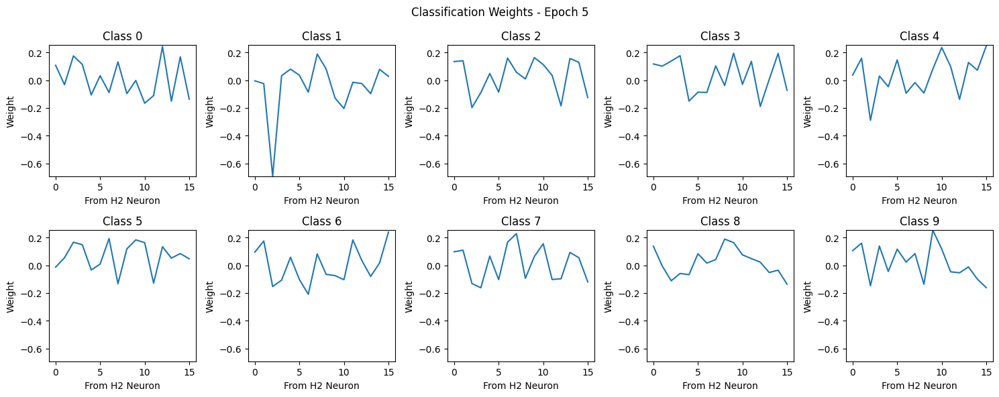

Epoch 6/20
  Train Loss: 0.3349
  SAE Train Loss (hidden one): 0.5936
  SAE Train Loss (hidden two): 0.0750
  Val Loss: 0.3484 | Val Acc: 89.91%
  Saved model with Val Acc: 89.91%


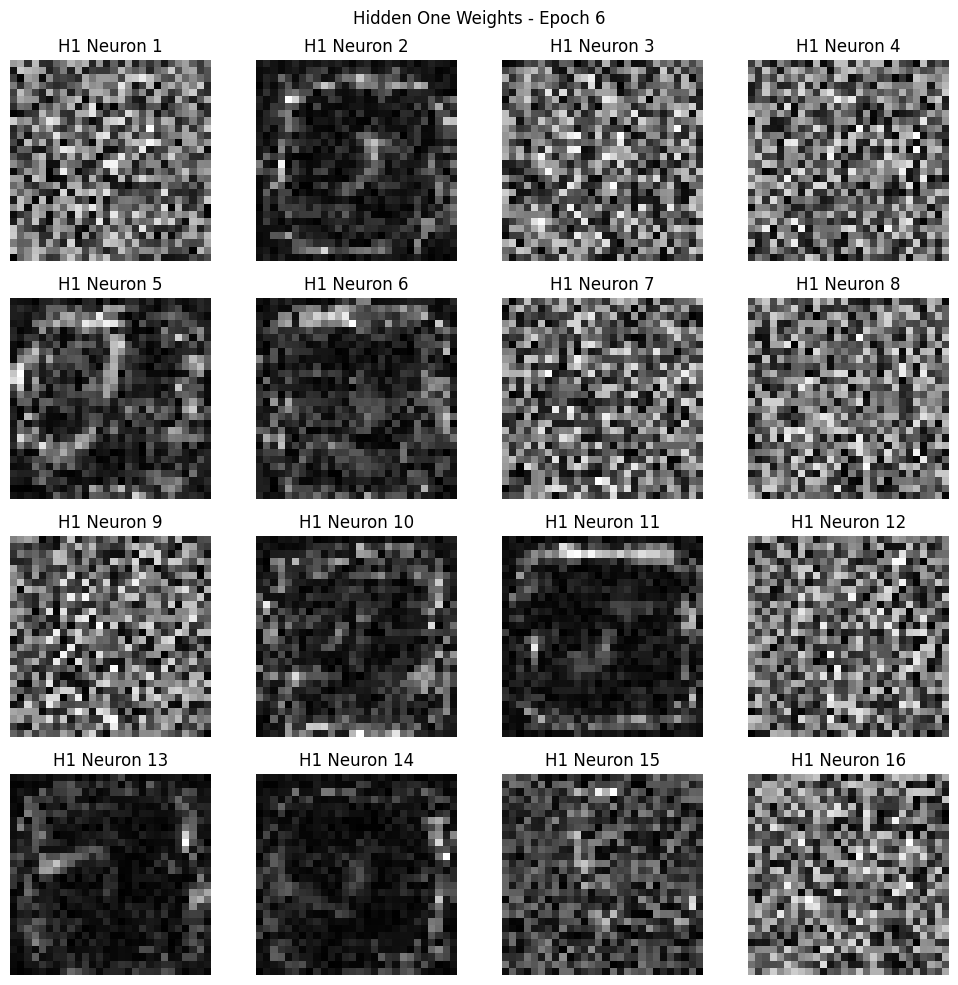

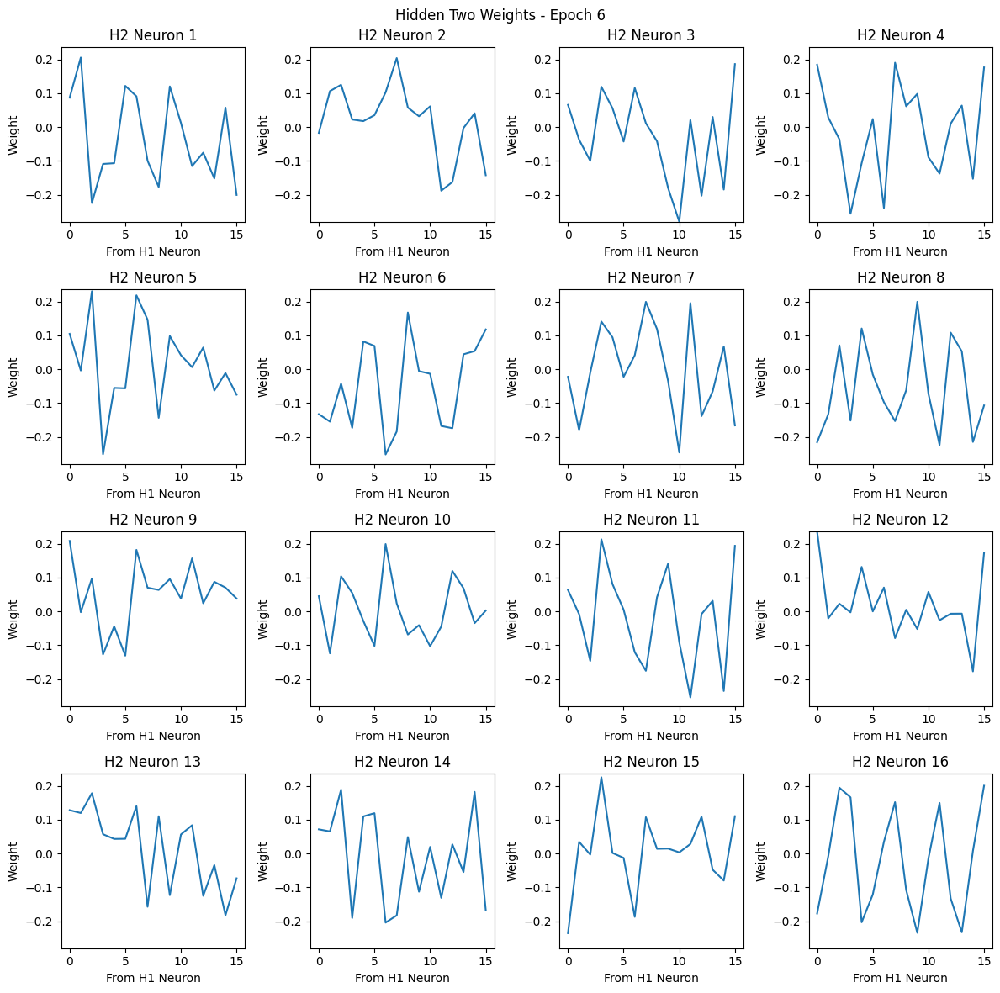

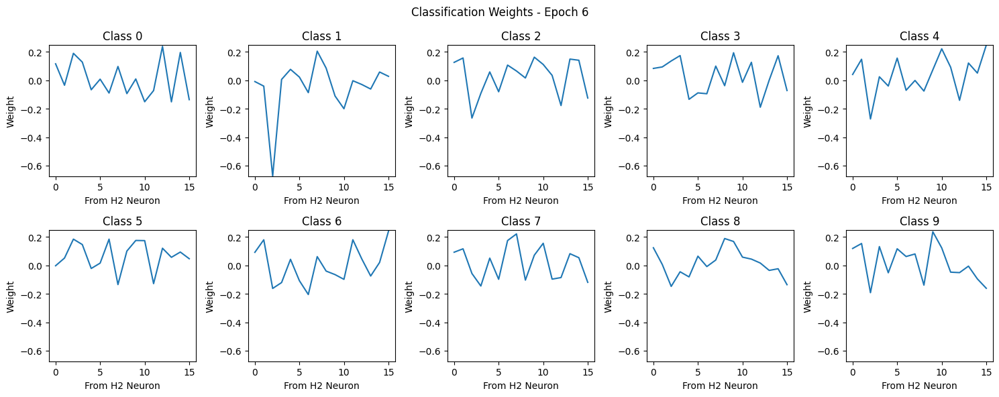

Epoch 7/20
  Train Loss: 0.3278
  SAE Train Loss (hidden one): 0.6069
  SAE Train Loss (hidden two): 0.0731
  Val Loss: 0.3521 | Val Acc: 89.77%


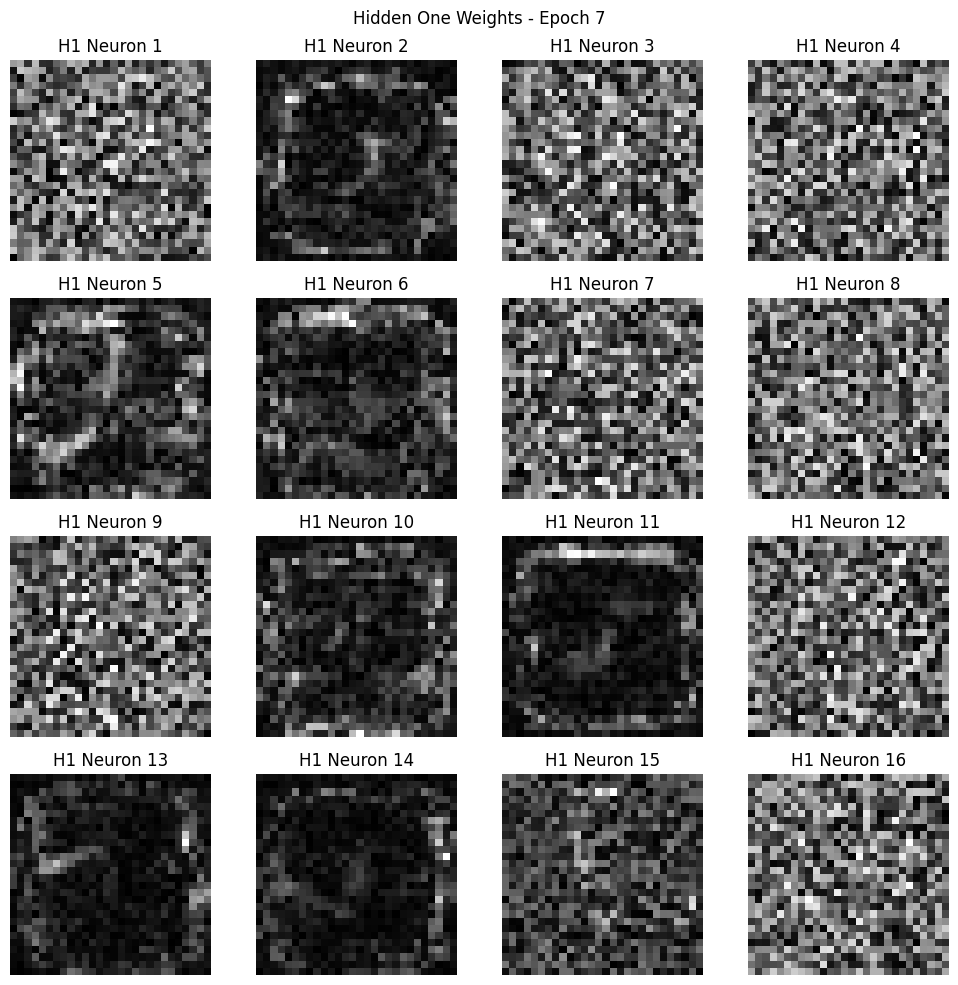

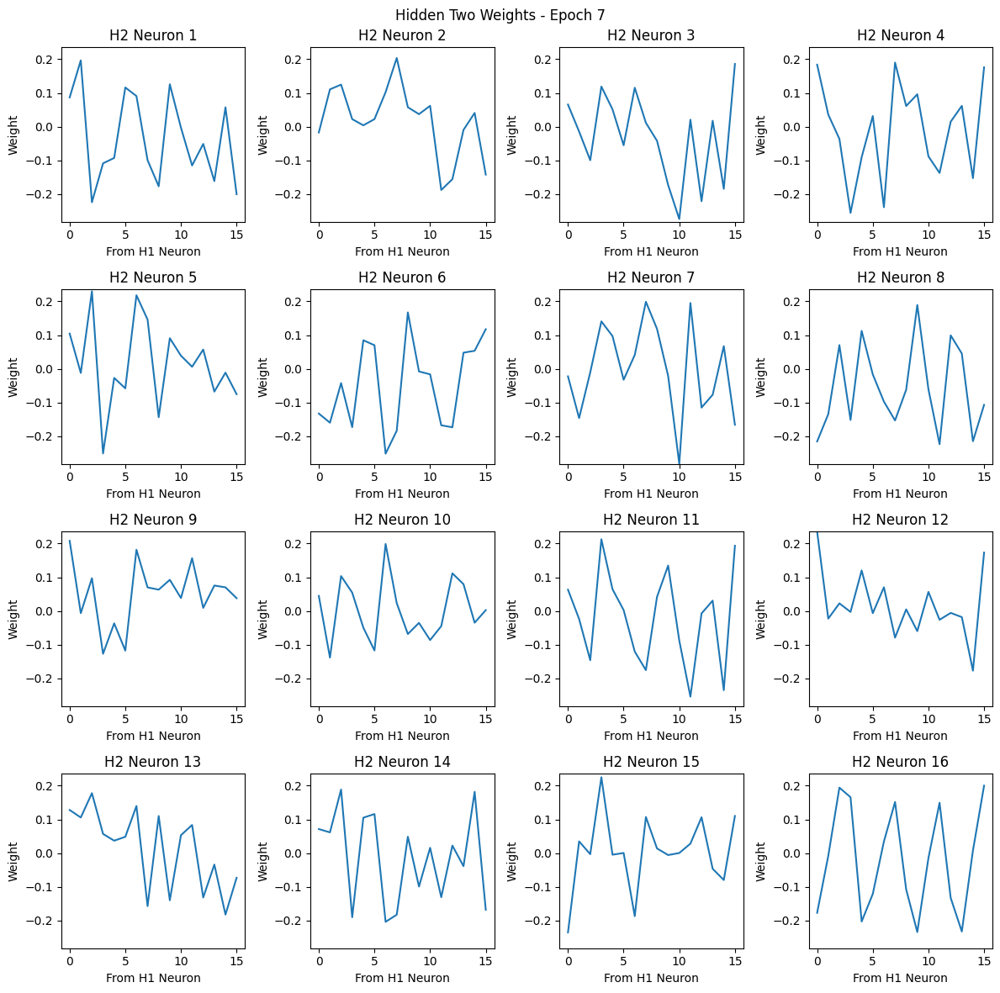

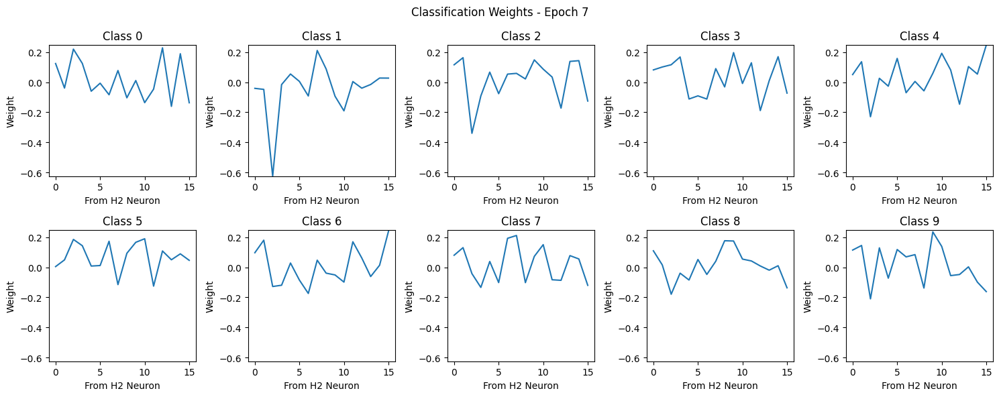

Epoch 8/20
  Train Loss: 0.3185
  SAE Train Loss (hidden one): 0.6247
  SAE Train Loss (hidden two): 0.0704
  Val Loss: 0.3430 | Val Acc: 89.99%
  Saved model with Val Acc: 89.99%


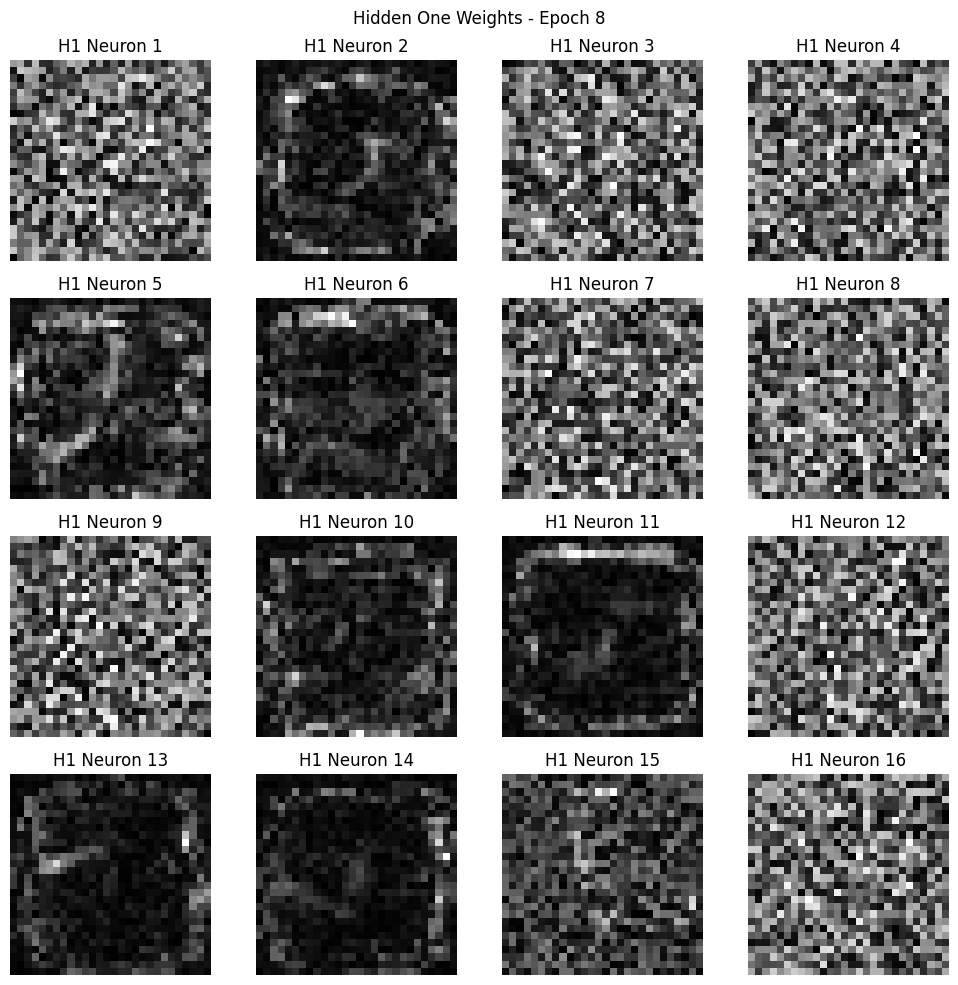

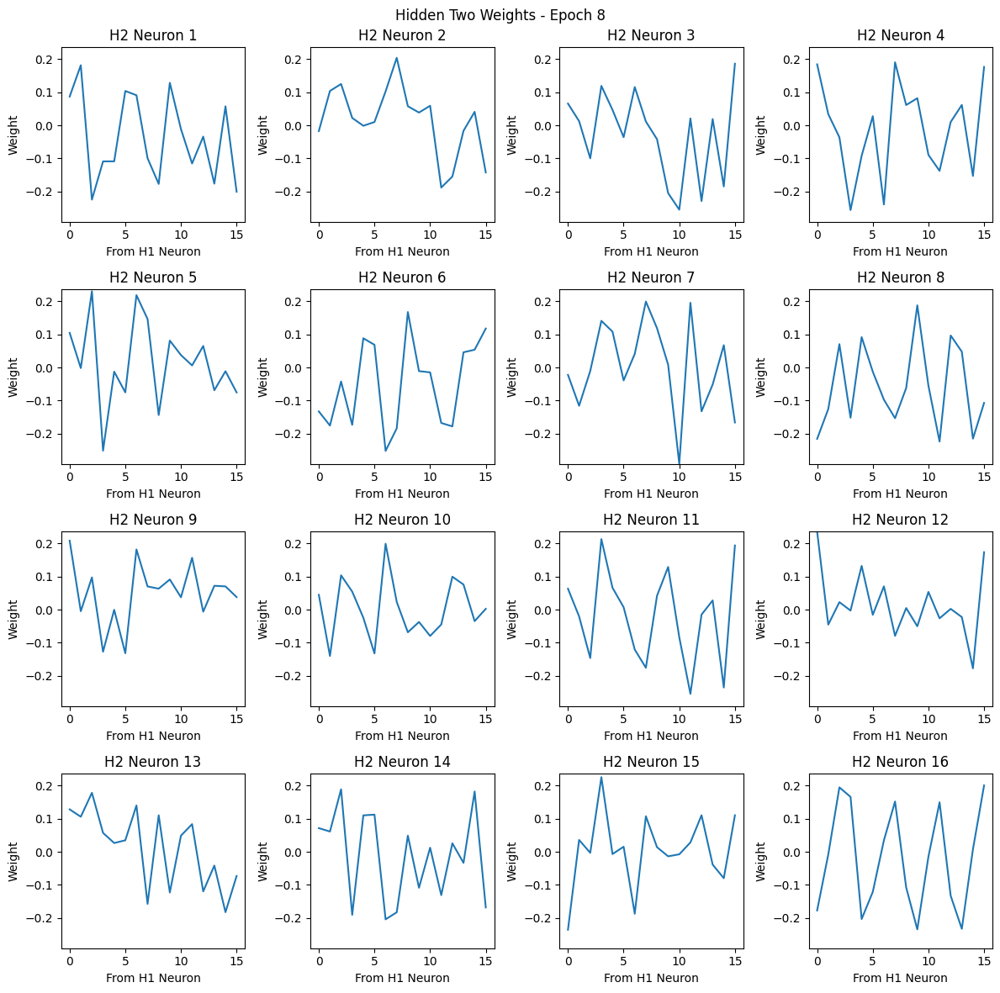

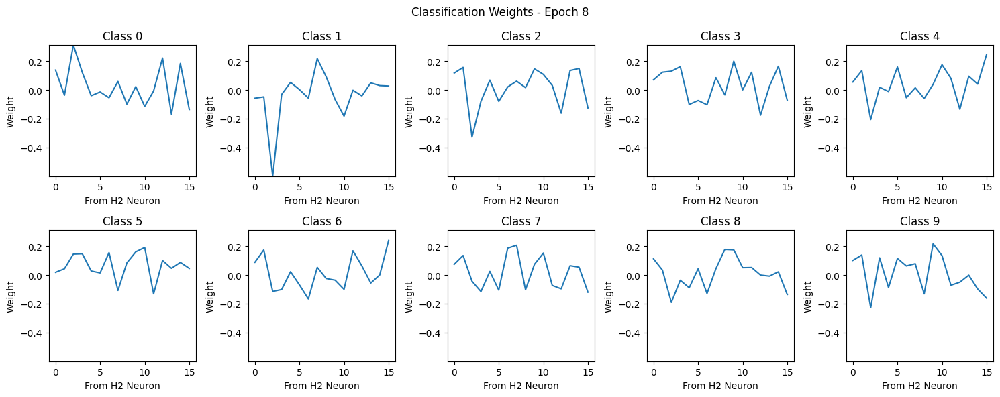

Epoch 9/20
  Train Loss: 0.3092
  SAE Train Loss (hidden one): 0.6384
  SAE Train Loss (hidden two): 0.0679
  Val Loss: 0.3521 | Val Acc: 89.41%


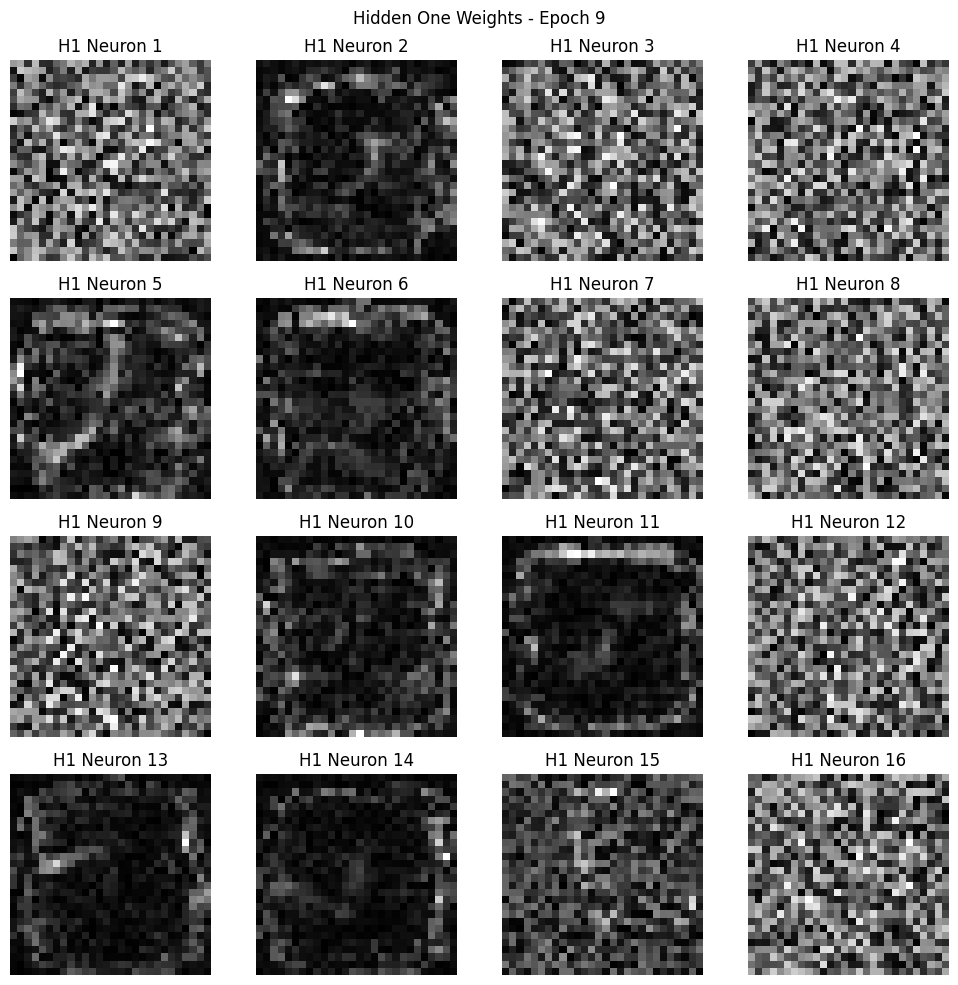

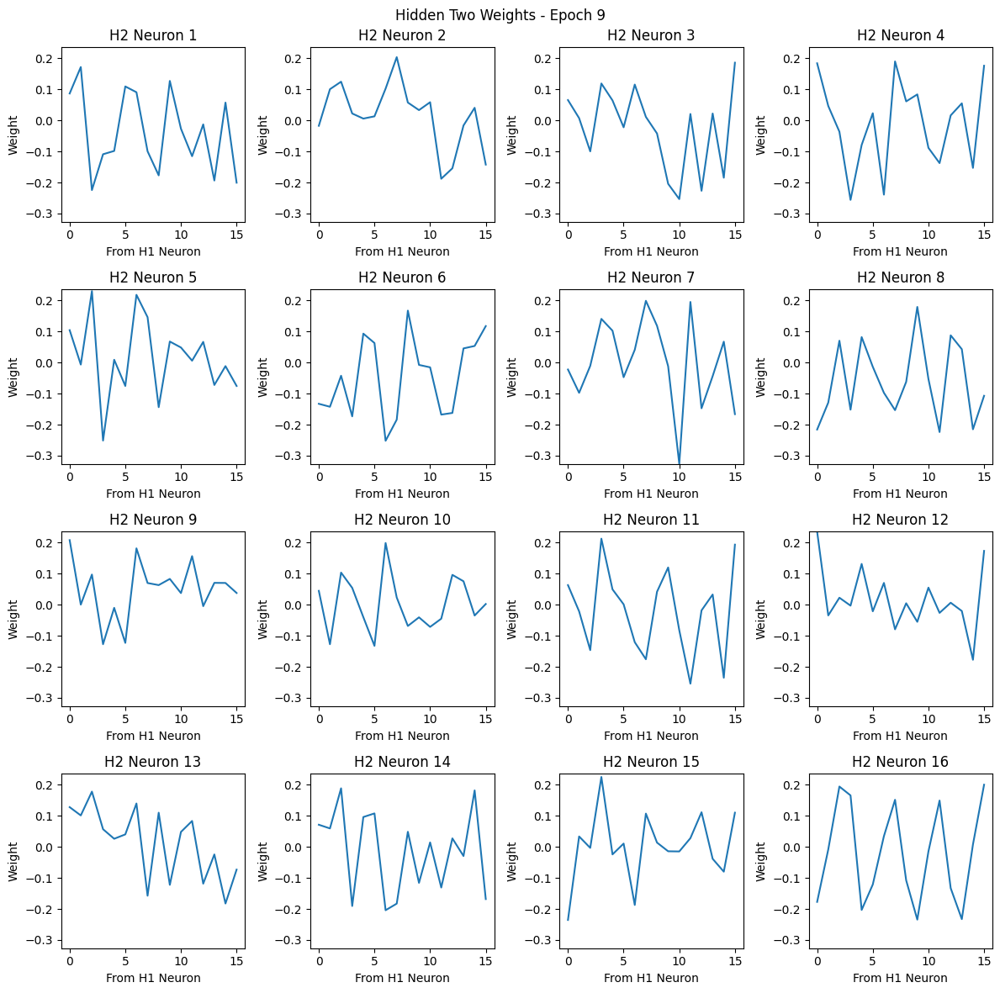

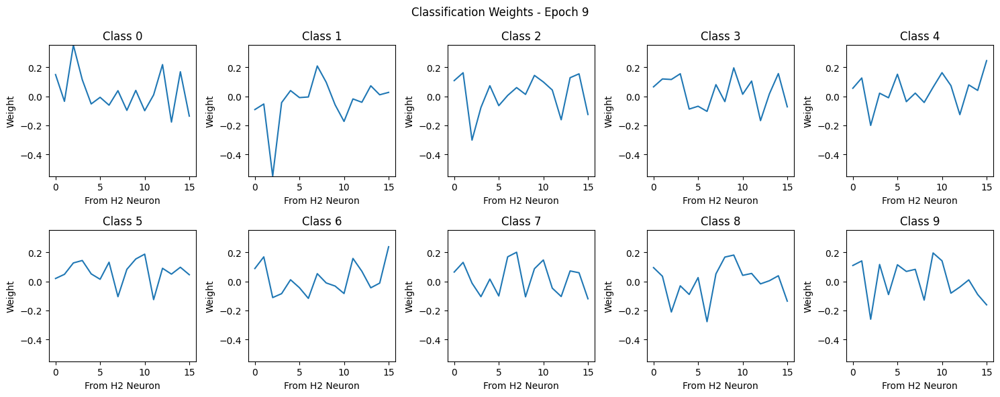

Epoch 10/20
  Train Loss: 0.3059
  SAE Train Loss (hidden one): 0.6079
  SAE Train Loss (hidden two): 0.0648
  Val Loss: 0.3405 | Val Acc: 90.10%
  Saved model with Val Acc: 90.10%


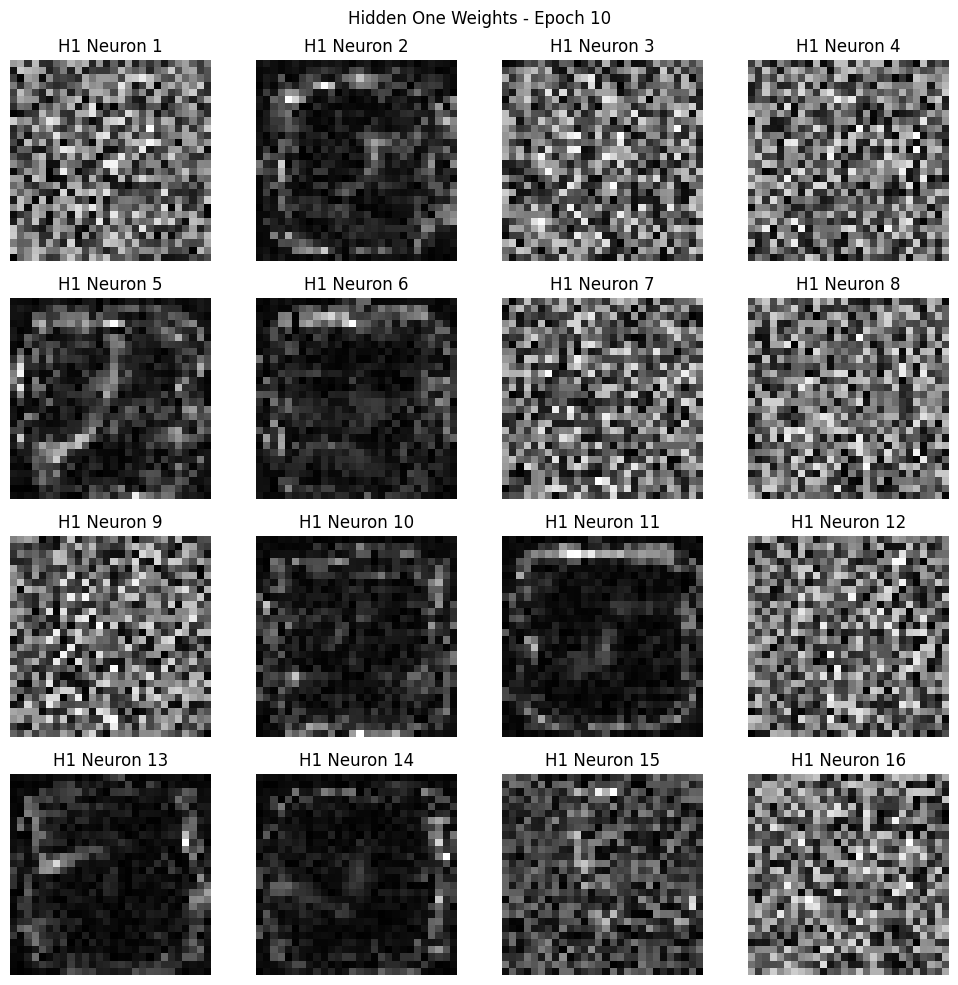

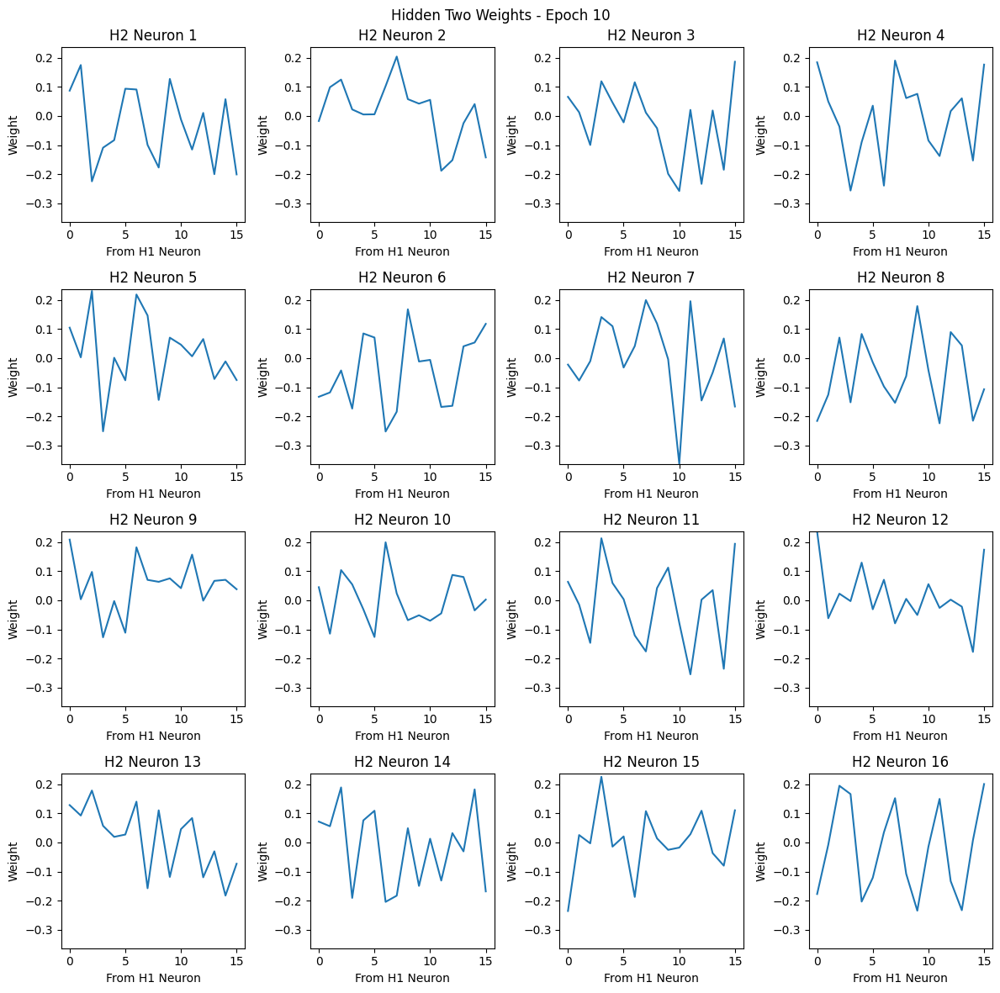

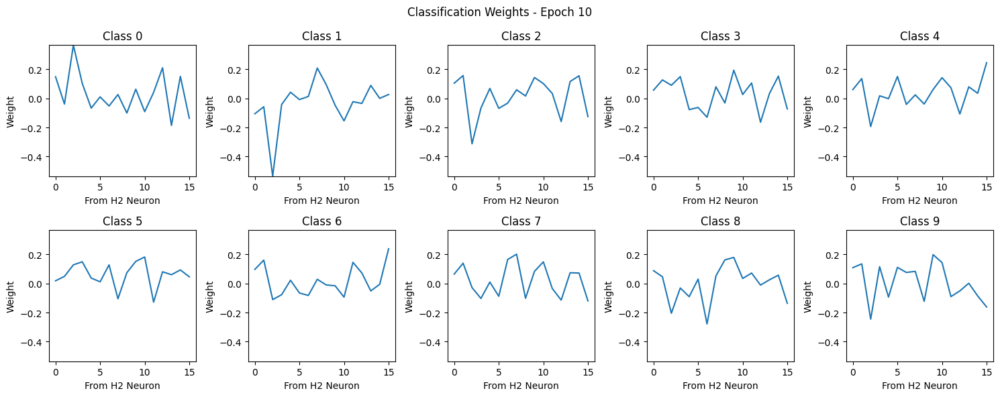

Epoch 11/20
  Train Loss: 0.2975
  SAE Train Loss (hidden one): 0.5902
  SAE Train Loss (hidden two): 0.0635
  Val Loss: 0.3421 | Val Acc: 90.39%
  Saved model with Val Acc: 90.39%


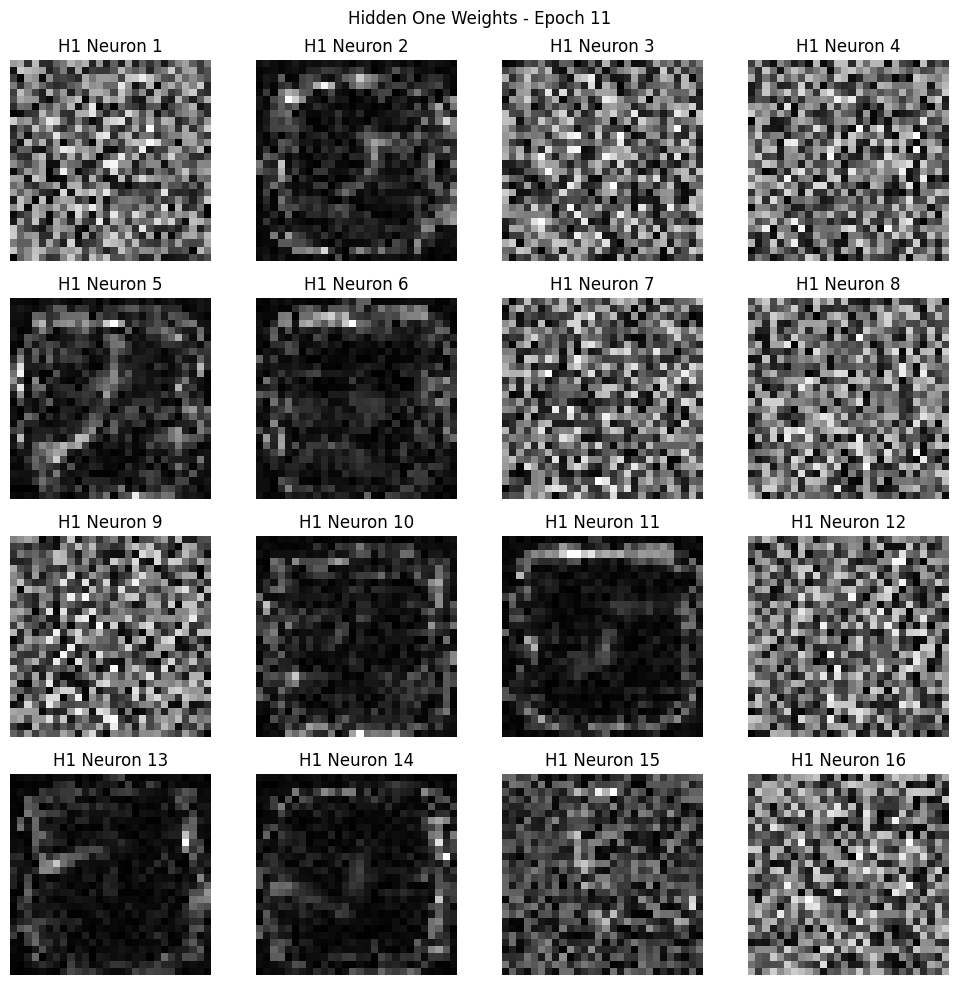

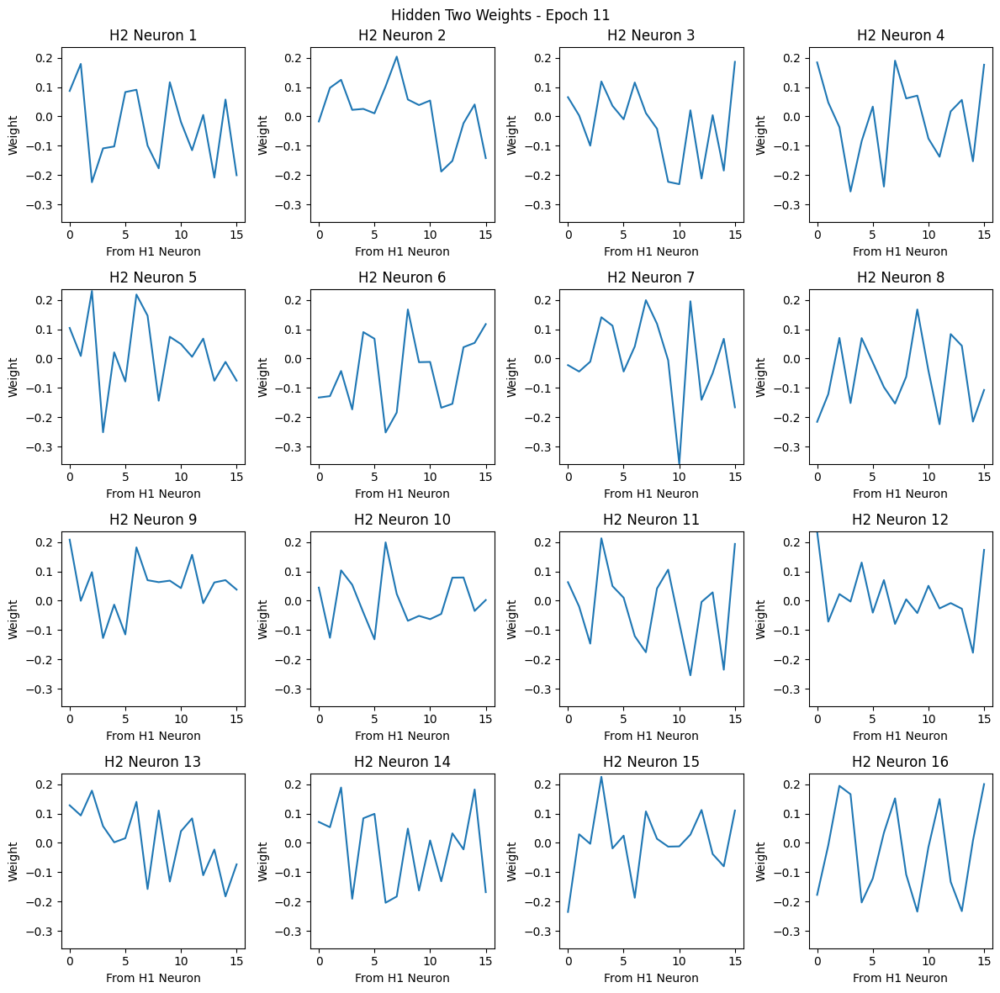

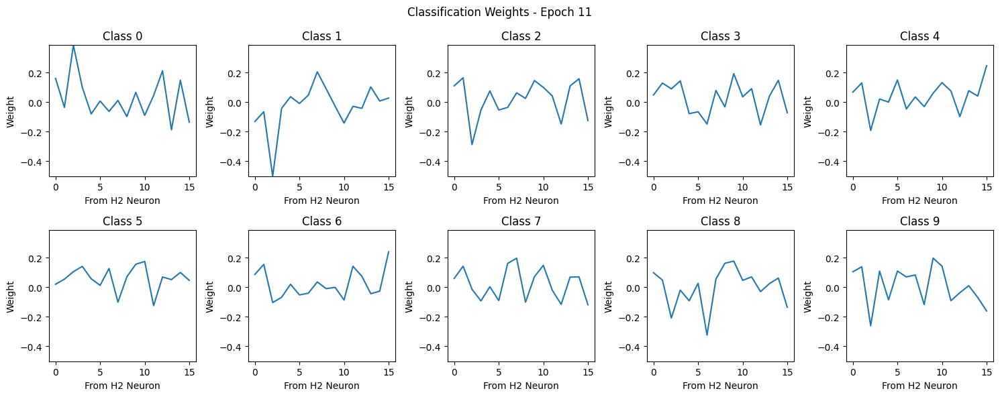

Epoch 12/20
  Train Loss: 0.2959
  SAE Train Loss (hidden one): 0.6767
  SAE Train Loss (hidden two): 0.0629
  Val Loss: 0.3340 | Val Acc: 90.59%
  Saved model with Val Acc: 90.59%


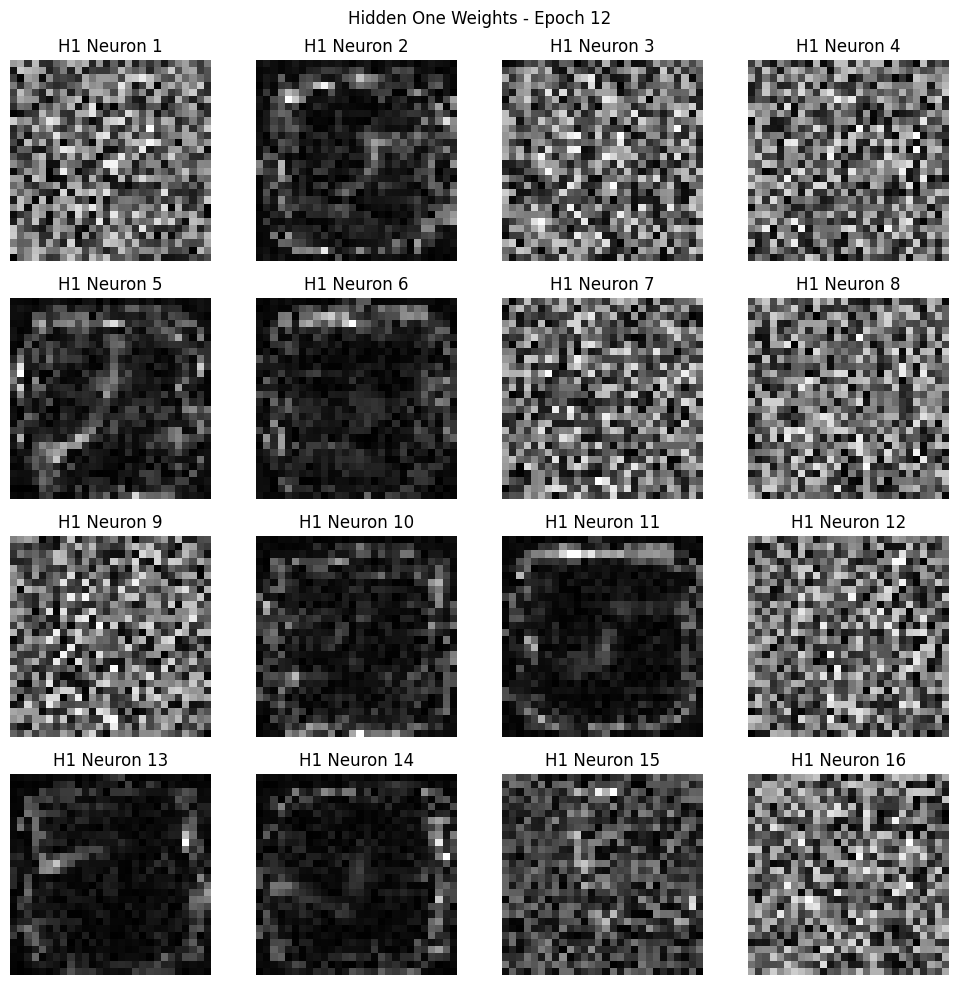

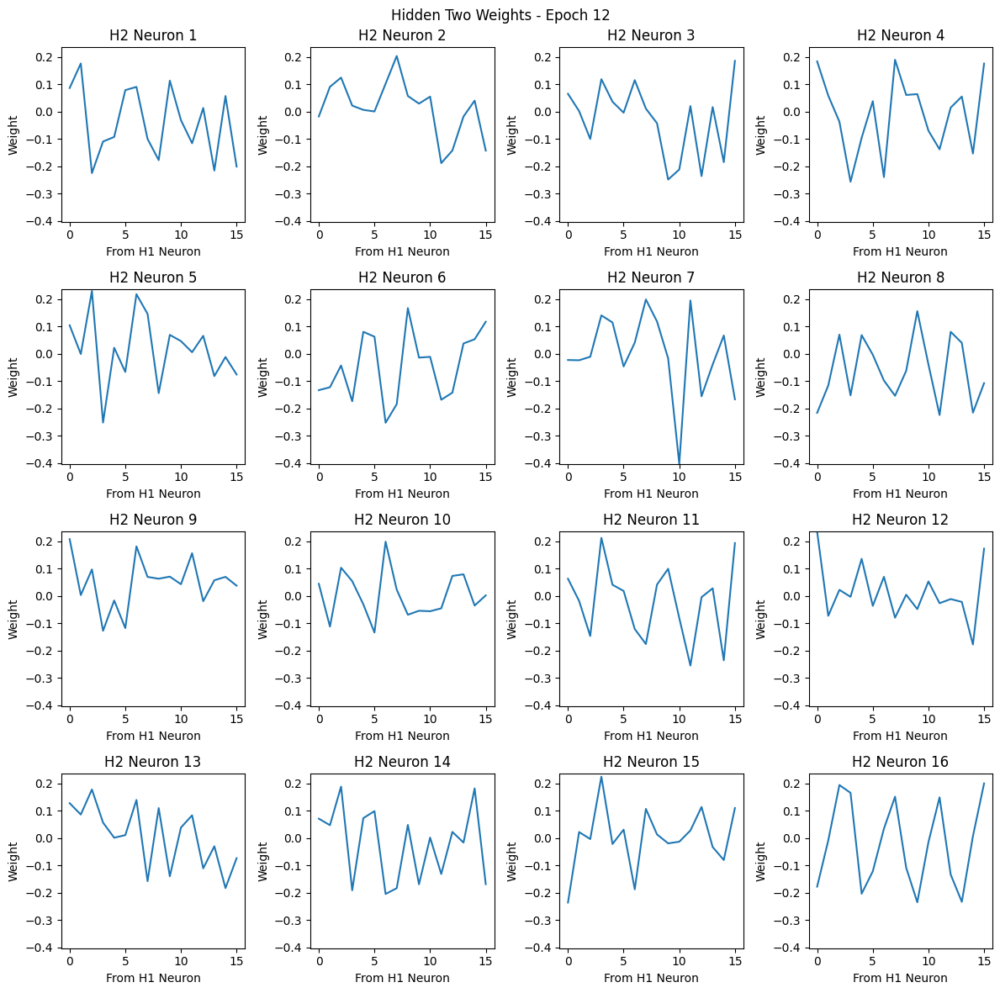

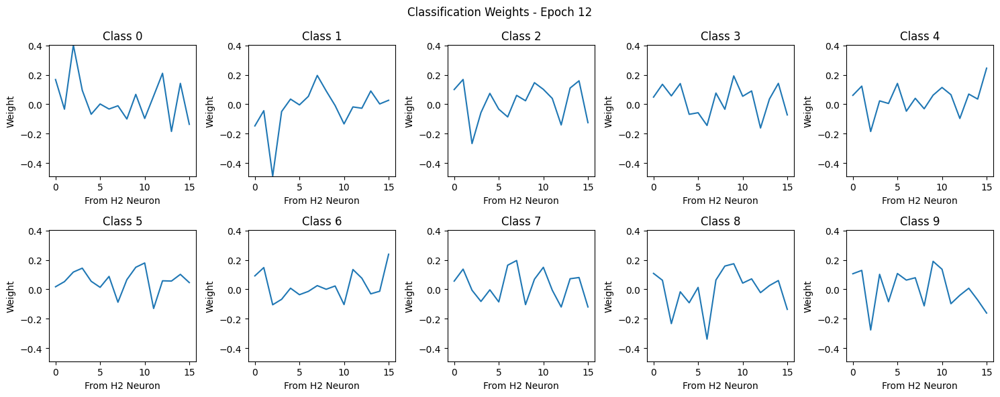

Epoch 13/20
  Train Loss: 0.2922
  SAE Train Loss (hidden one): 0.6343
  SAE Train Loss (hidden two): 0.0592
  Val Loss: 0.3310 | Val Acc: 90.67%
  Saved model with Val Acc: 90.67%


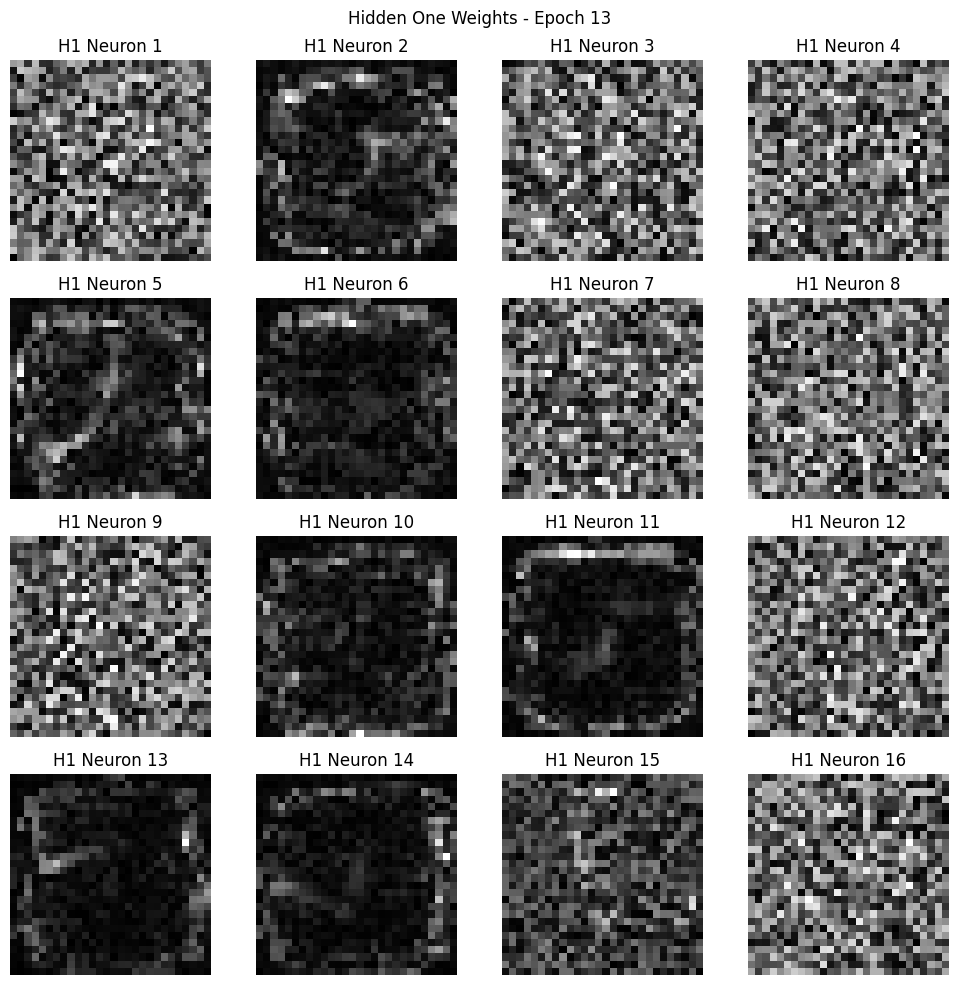

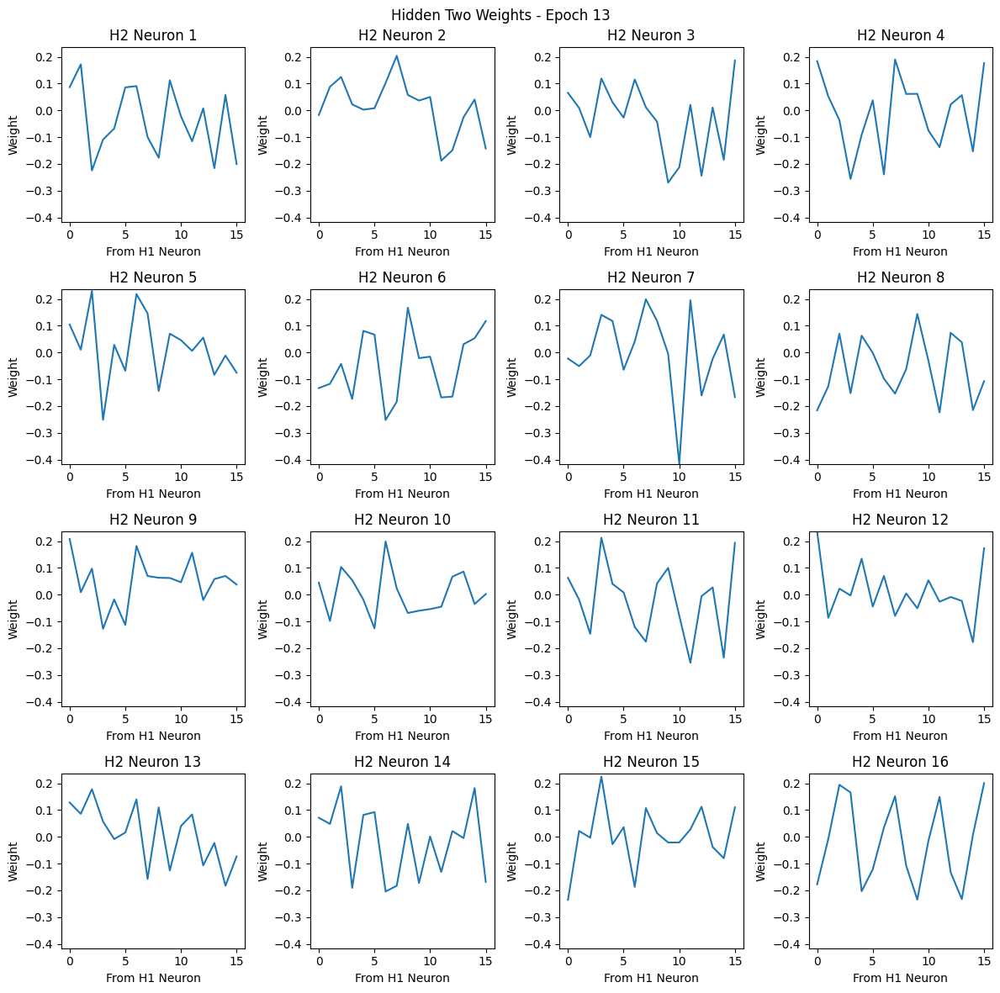

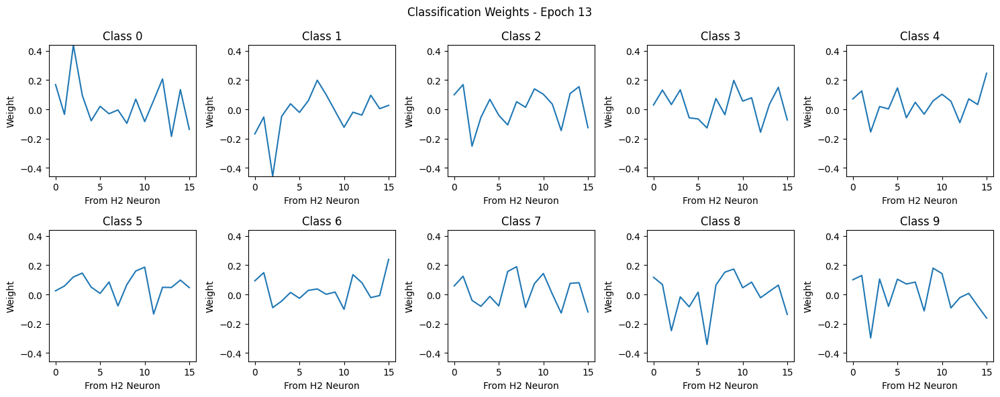

Epoch 14/20
  Train Loss: 0.2875
  SAE Train Loss (hidden one): 0.6153
  SAE Train Loss (hidden two): 0.0569
  Val Loss: 0.3456 | Val Acc: 89.83%


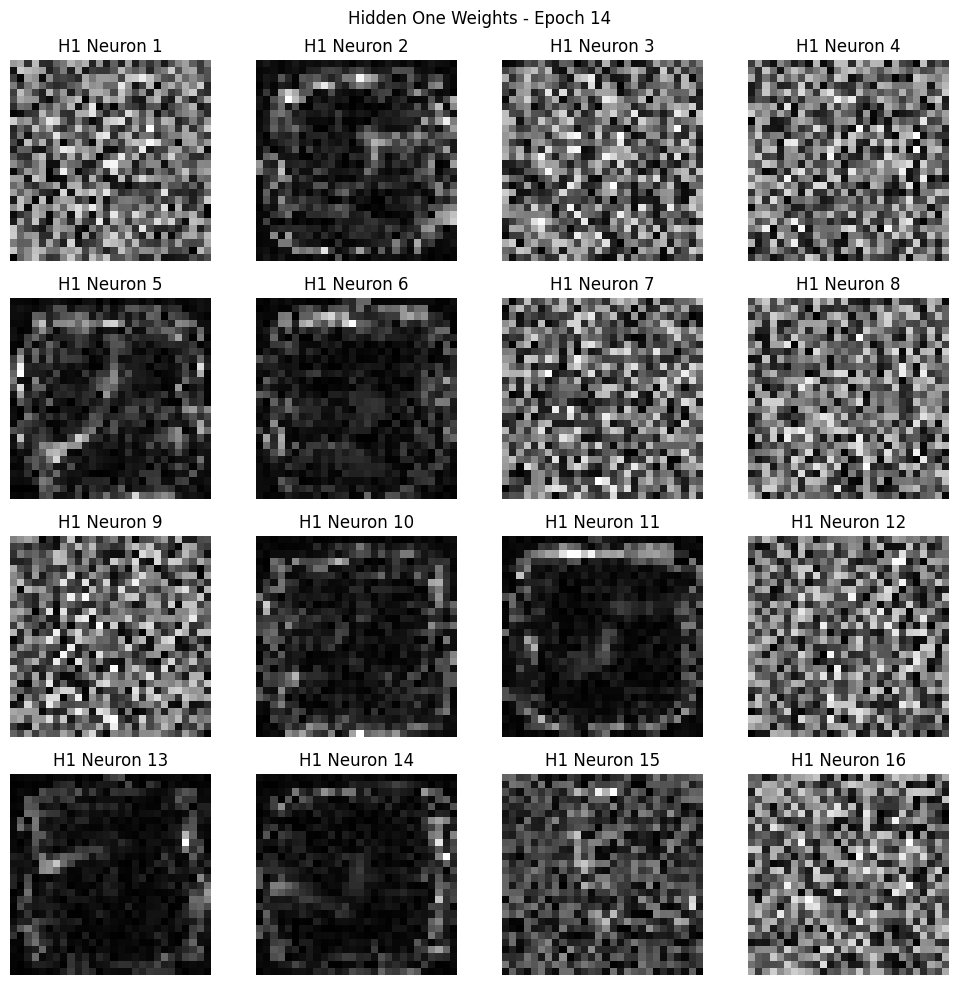

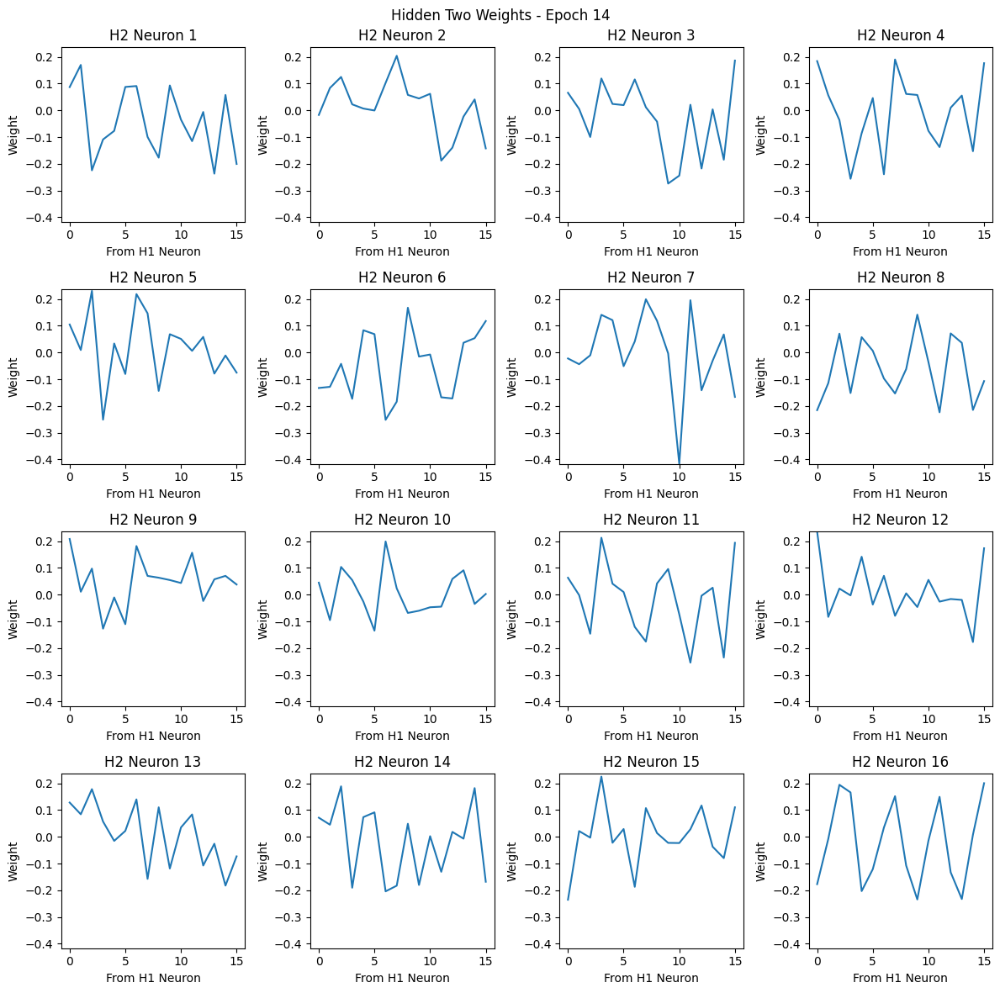

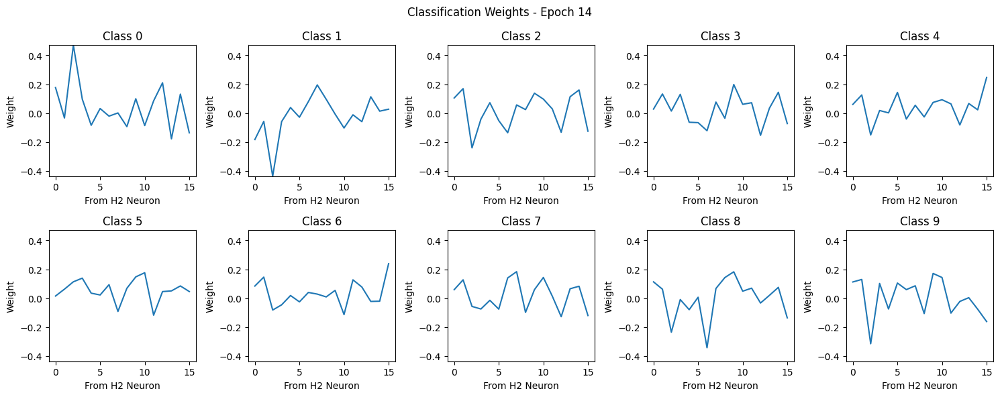

Epoch 15/20
  Train Loss: 0.2879
  SAE Train Loss (hidden one): 0.6247
  SAE Train Loss (hidden two): 0.0575
  Val Loss: 0.3609 | Val Acc: 89.51%


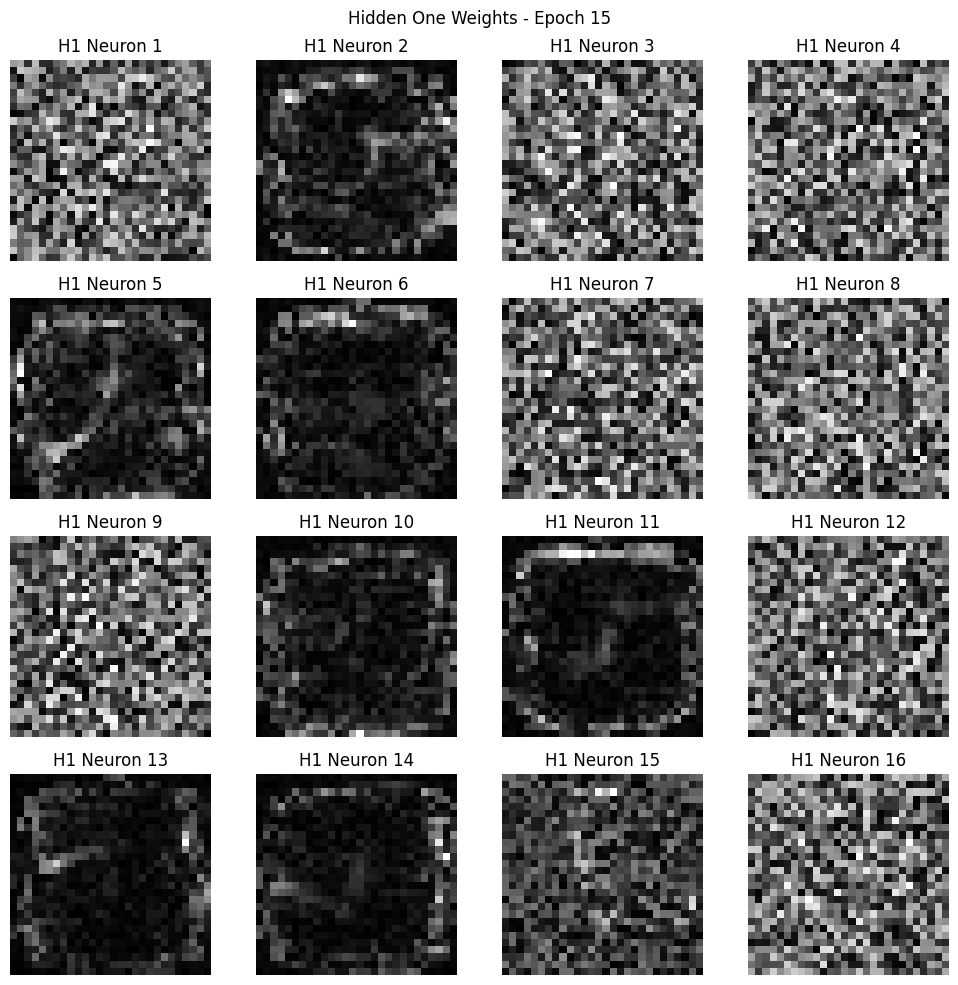

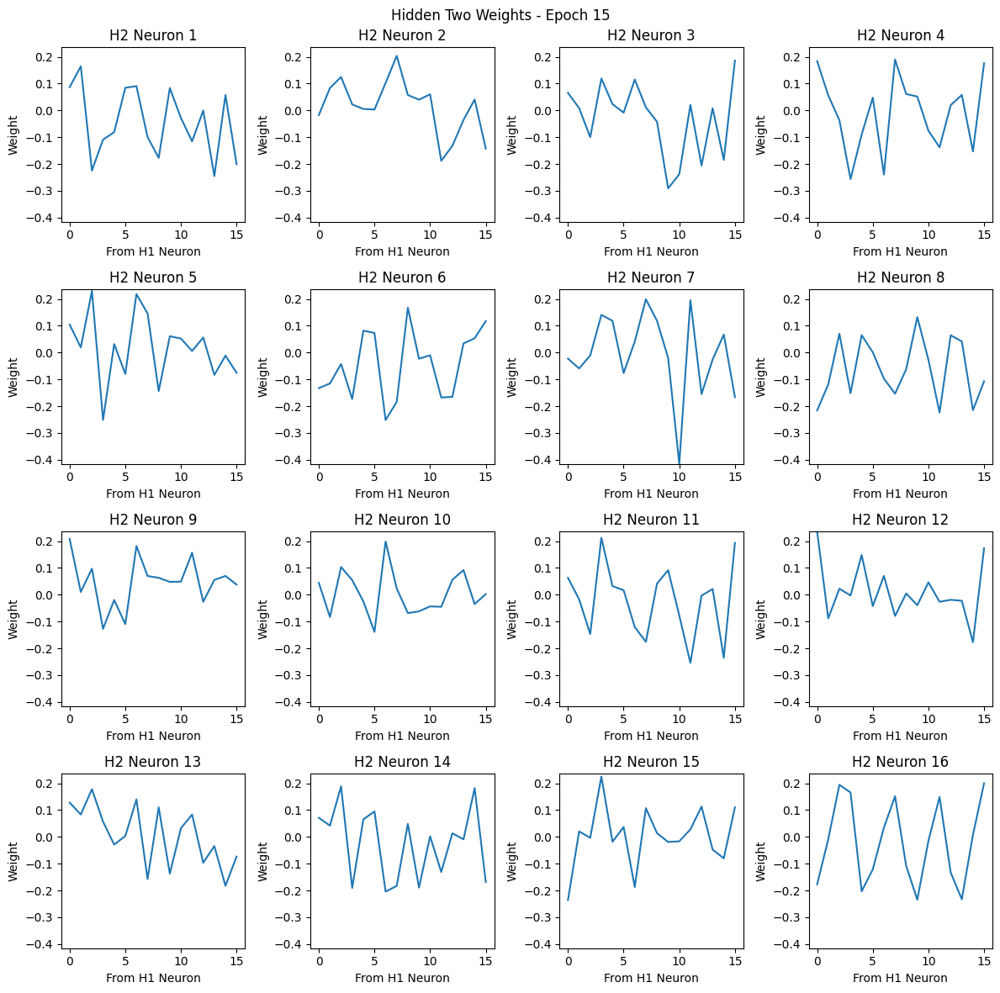

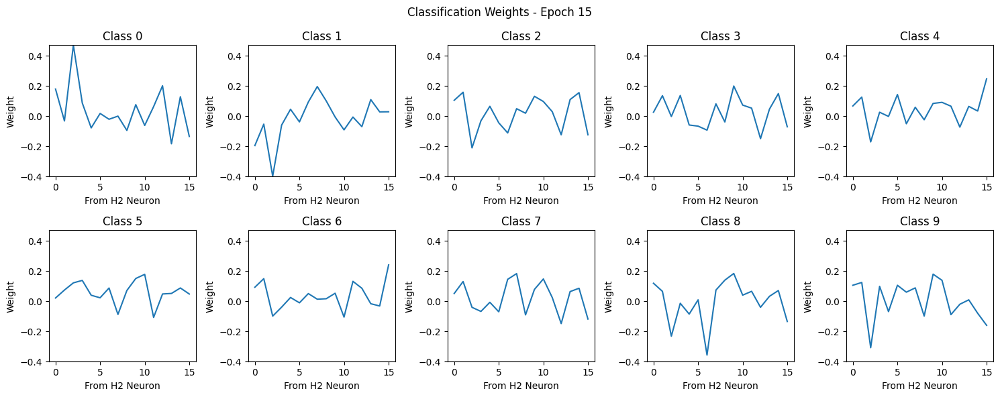

Epoch 16/20
  Train Loss: 0.2835
  SAE Train Loss (hidden one): 0.6209
  SAE Train Loss (hidden two): 0.0530
  Val Loss: 0.3243 | Val Acc: 90.88%
  Saved model with Val Acc: 90.88%


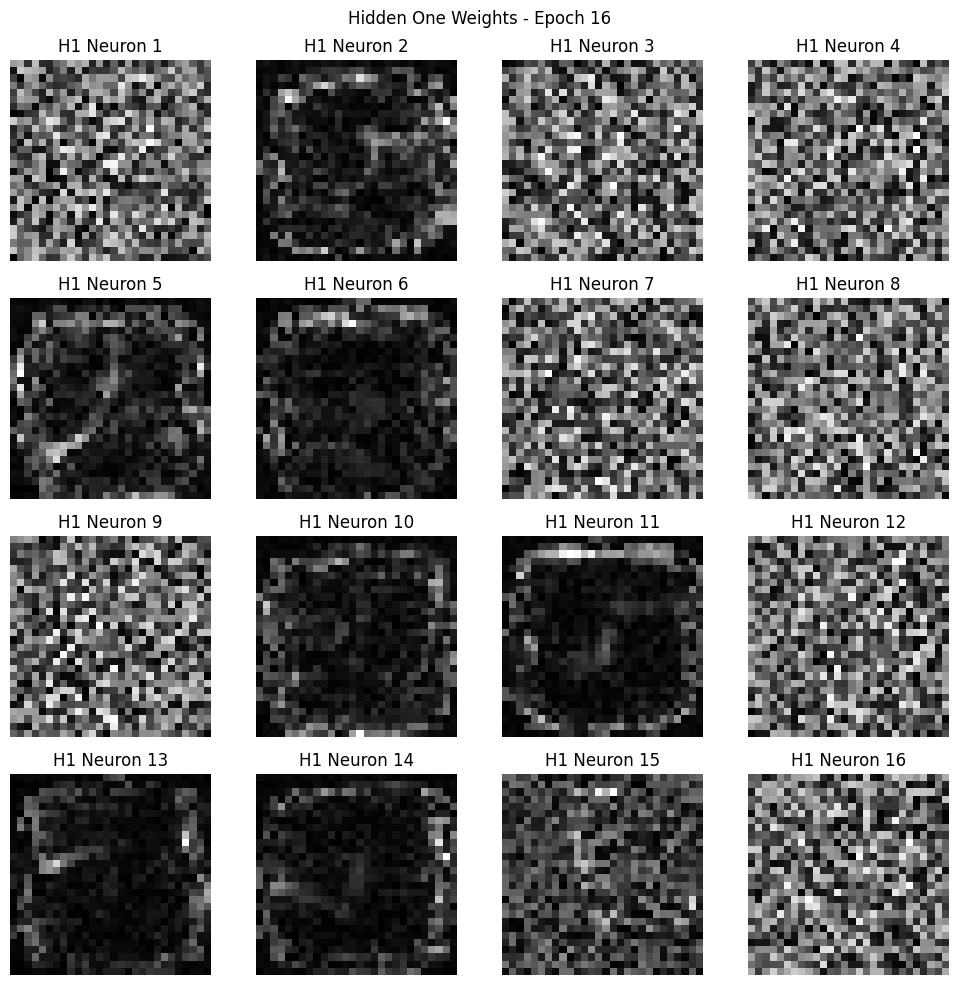

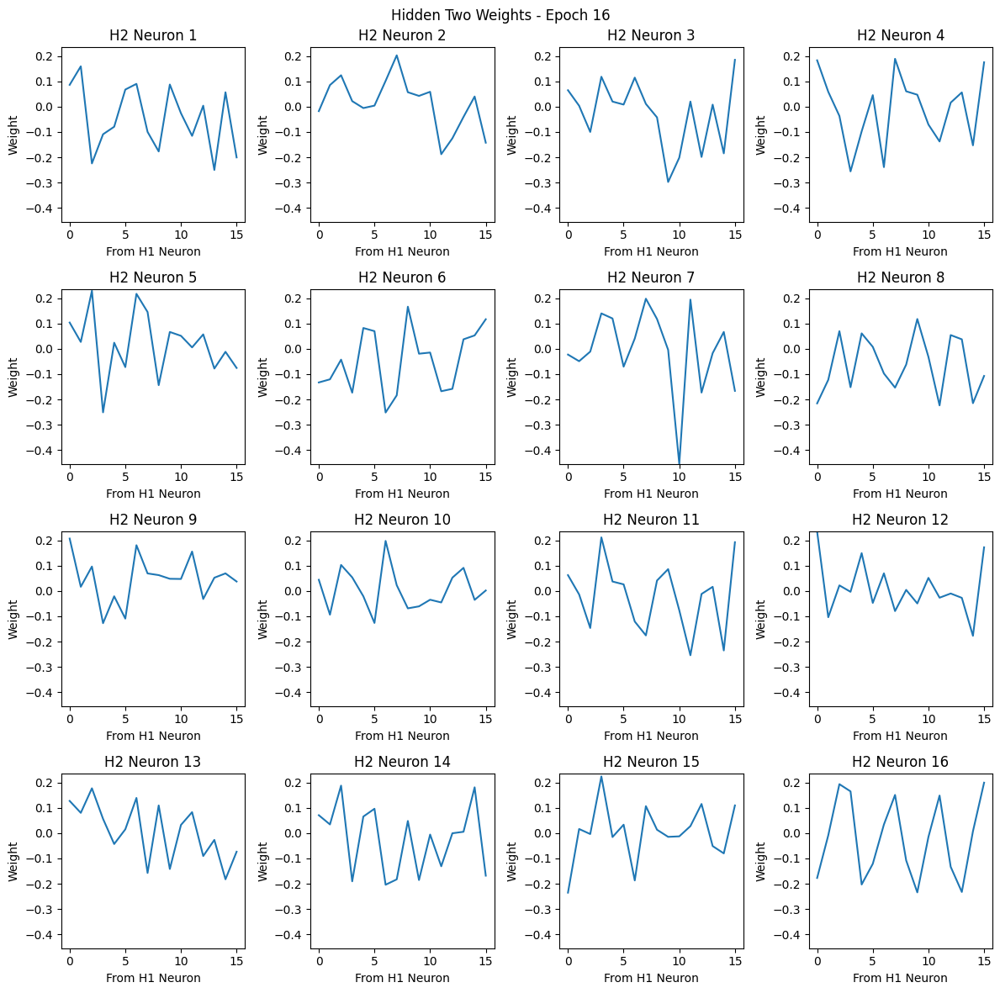

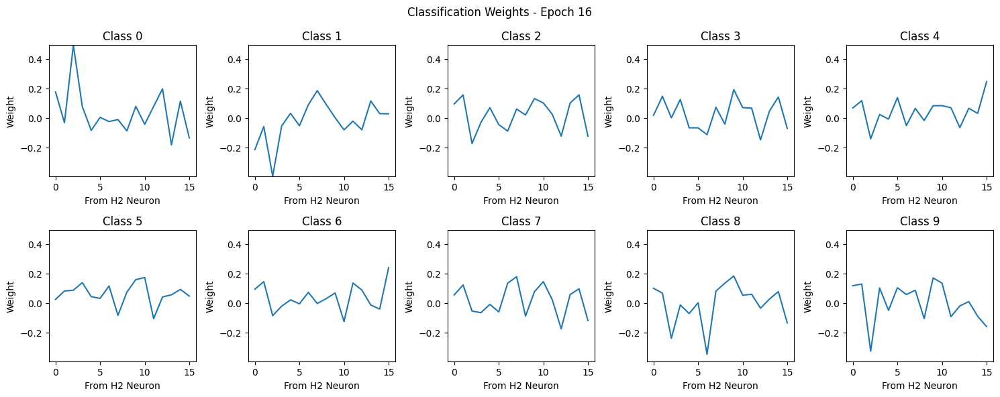

Epoch 17/20
  Train Loss: 0.2821
  SAE Train Loss (hidden one): 0.6050
  SAE Train Loss (hidden two): 0.0534
  Val Loss: 0.3349 | Val Acc: 90.67%


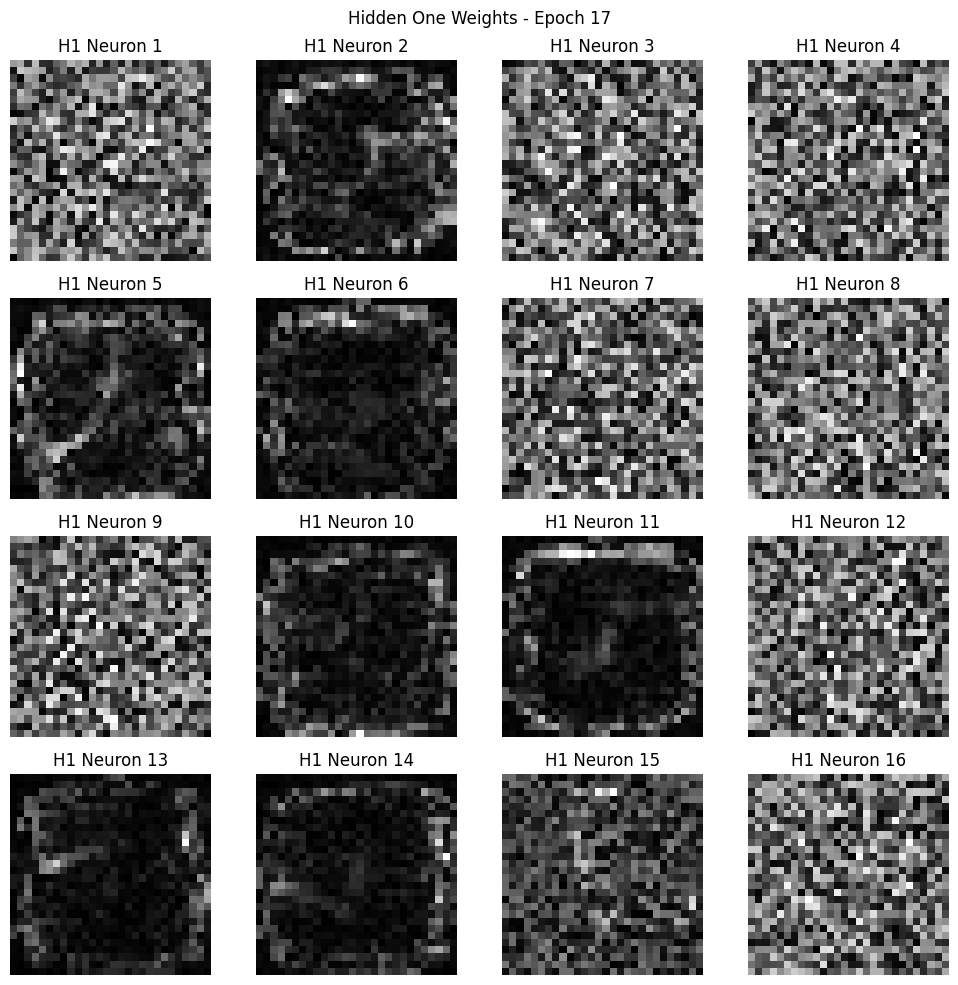

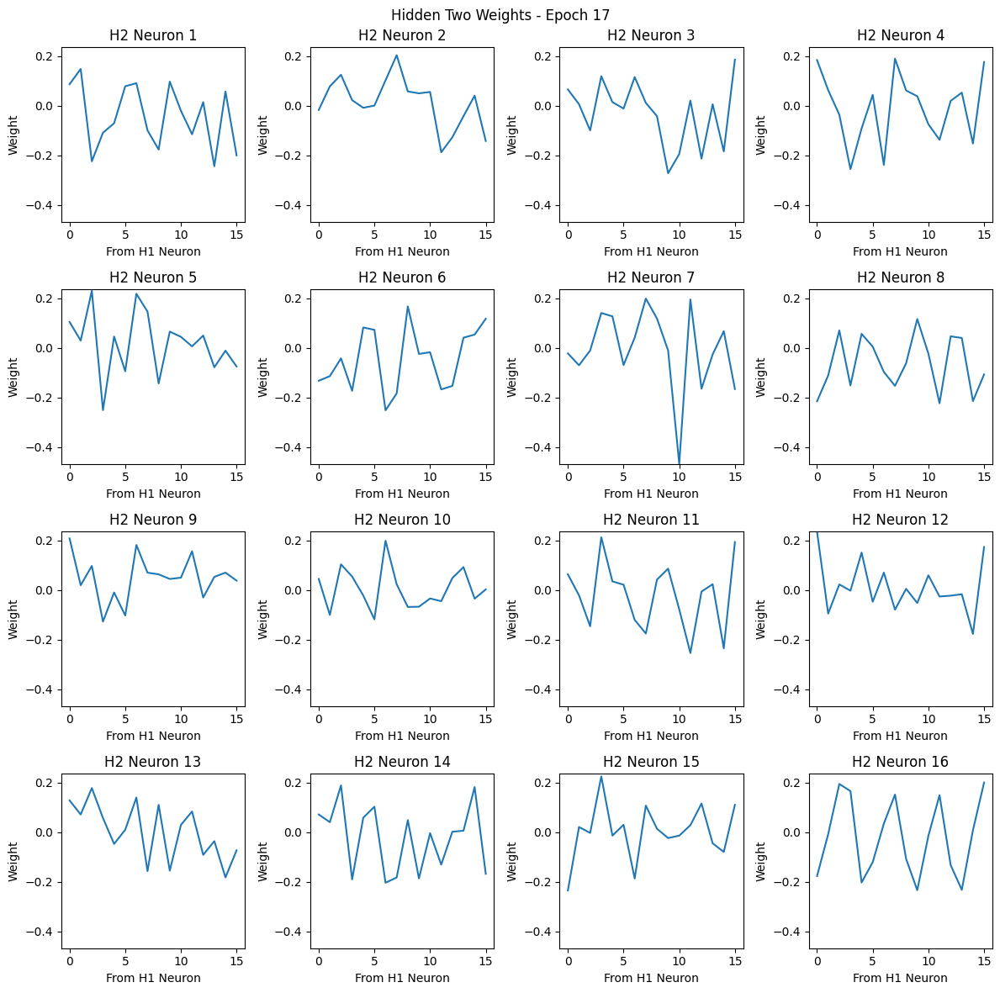

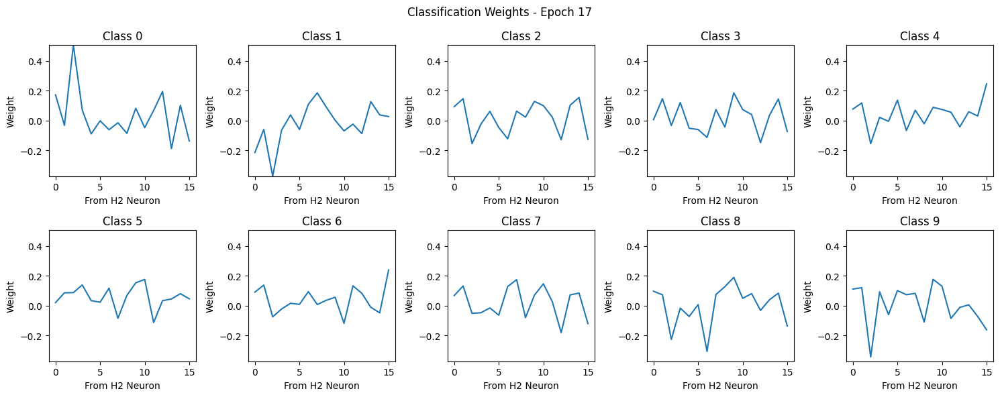

Epoch 18/20
  Train Loss: 0.2784
  SAE Train Loss (hidden one): 0.6636
  SAE Train Loss (hidden two): 0.0517
  Val Loss: 0.3256 | Val Acc: 90.95%
  Saved model with Val Acc: 90.95%


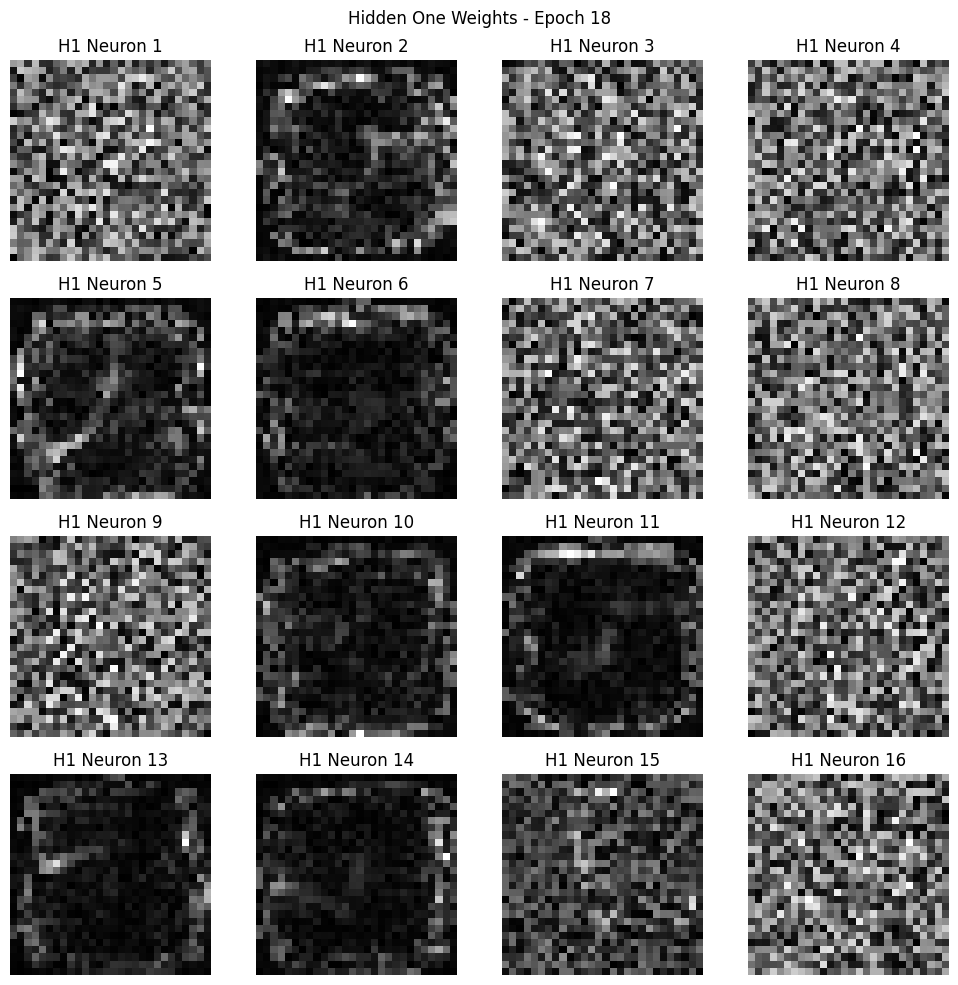

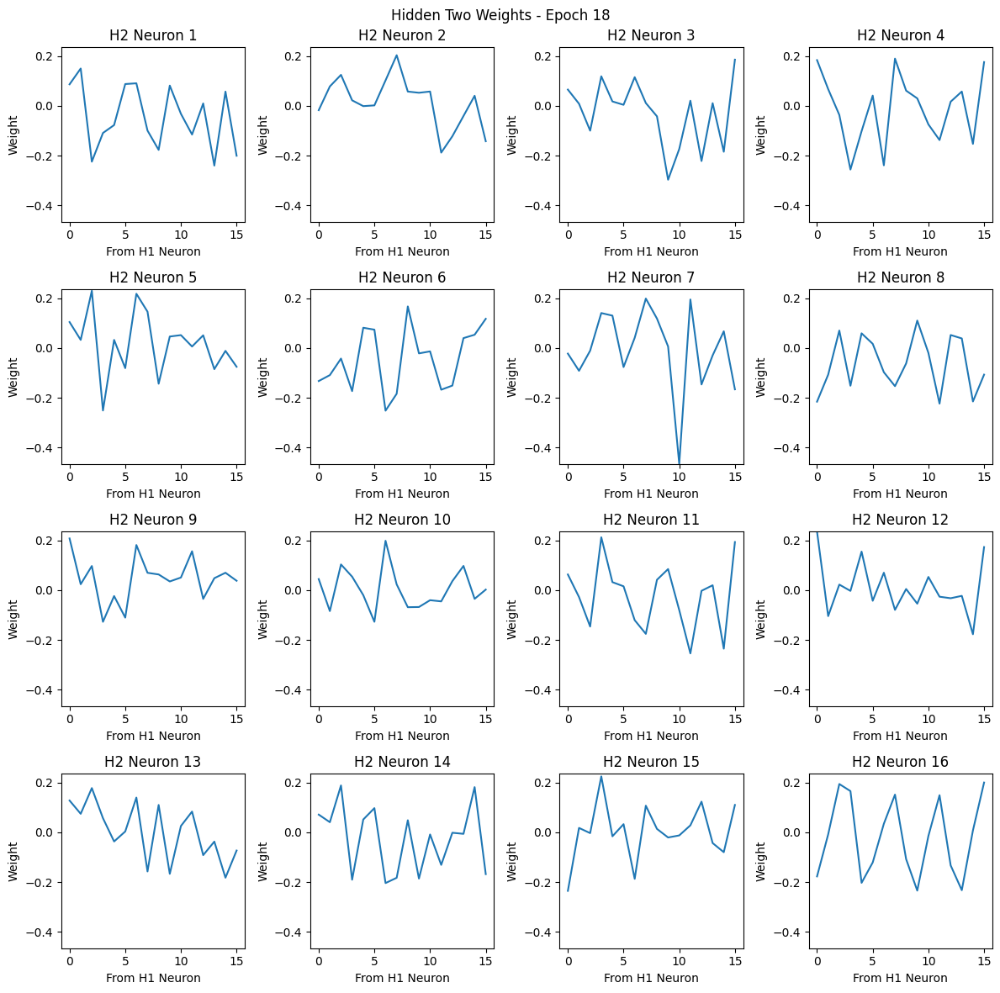

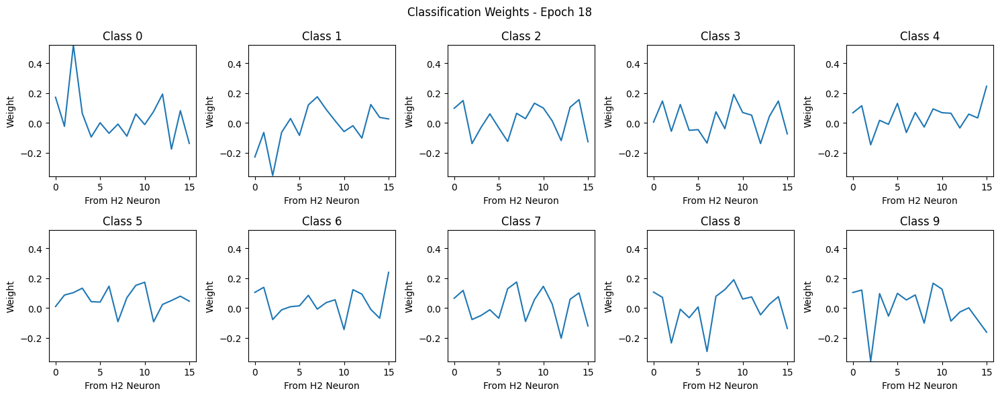

Epoch 19/20
  Train Loss: 0.2754
  SAE Train Loss (hidden one): 0.6143
  SAE Train Loss (hidden two): 0.0501
  Val Loss: 0.3458 | Val Acc: 89.98%


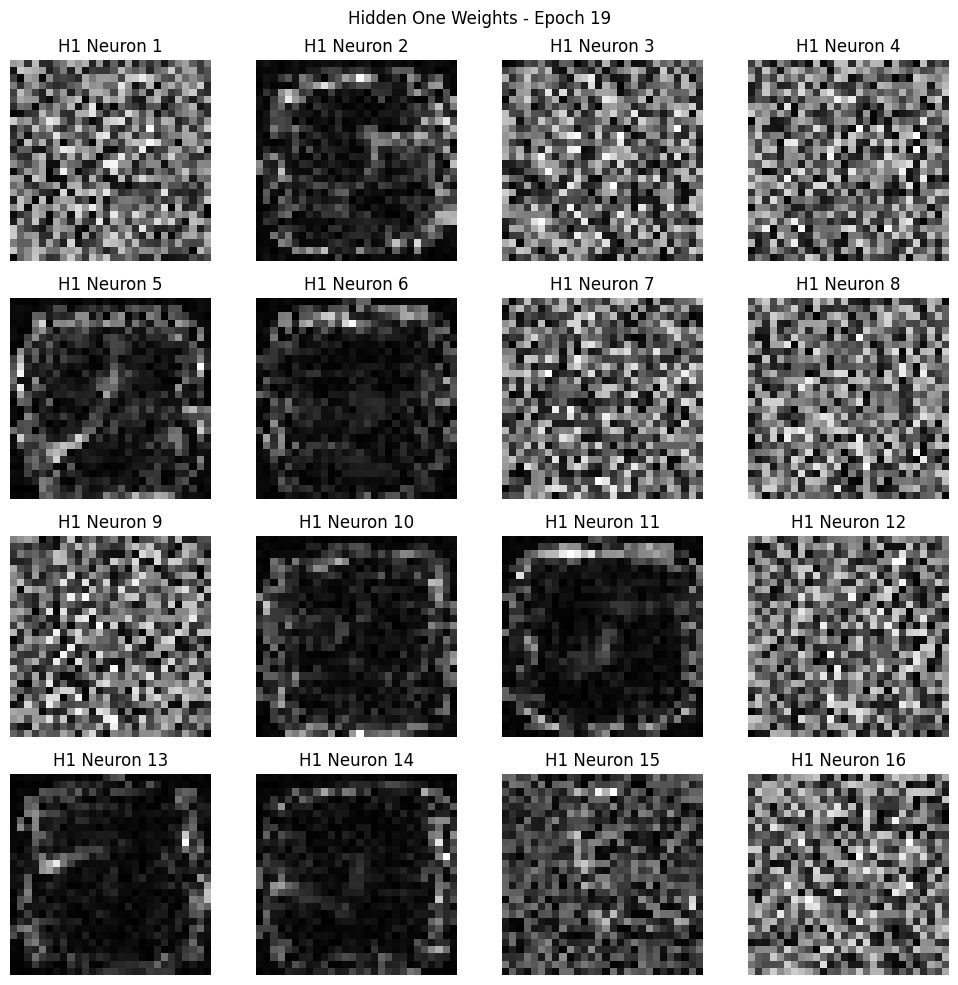

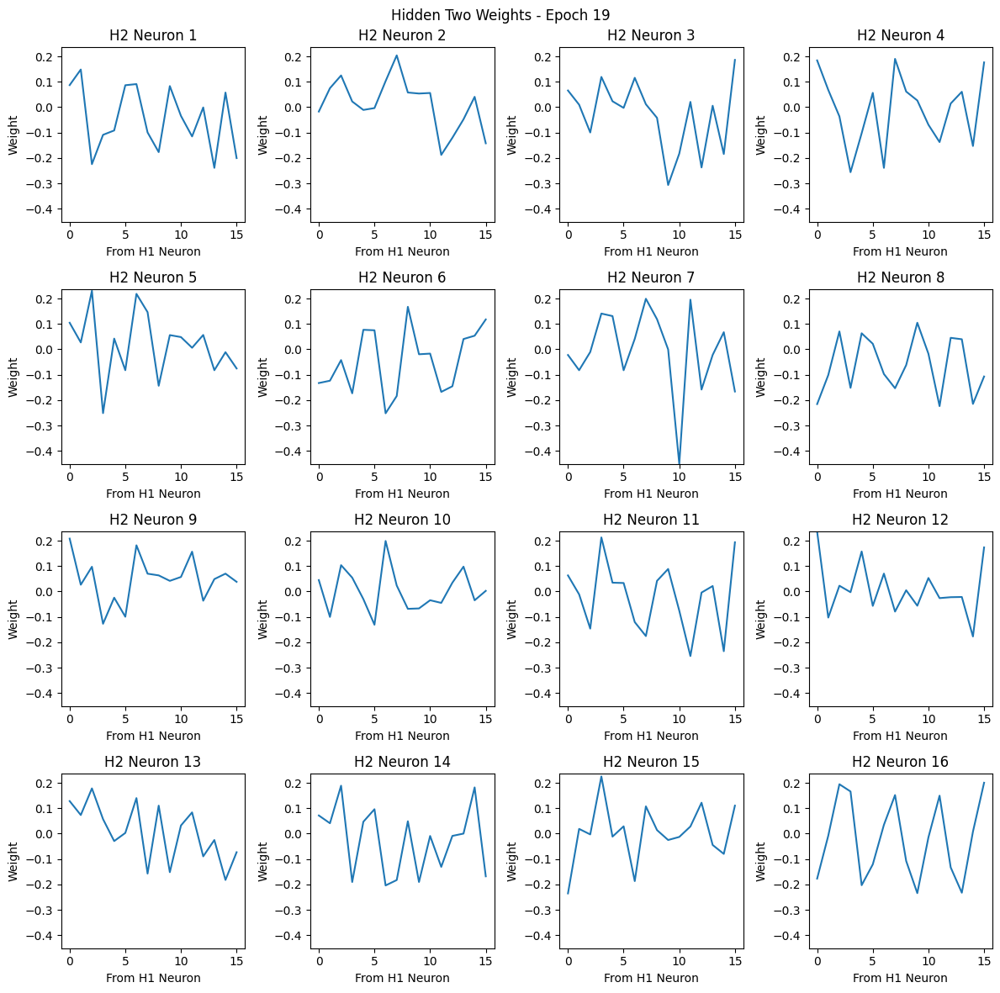

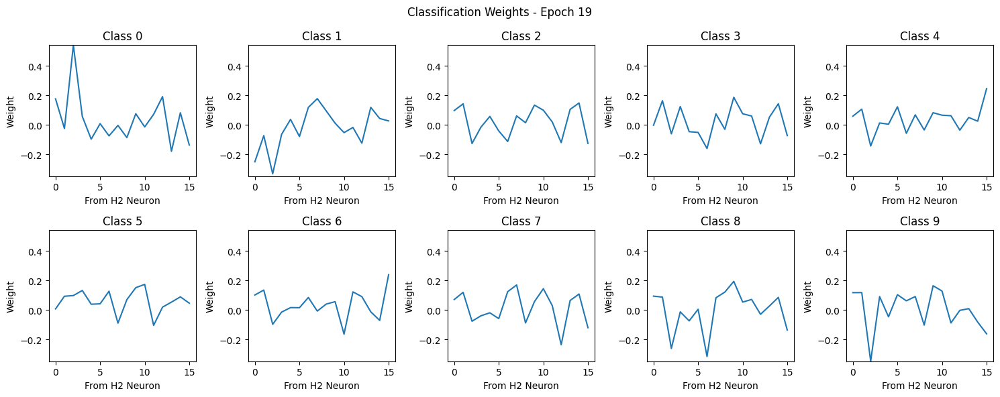

Epoch 20/20
  Train Loss: 0.2749
  SAE Train Loss (hidden one): 0.6182
  SAE Train Loss (hidden two): 0.0488
  Val Loss: 0.3339 | Val Acc: 90.36%


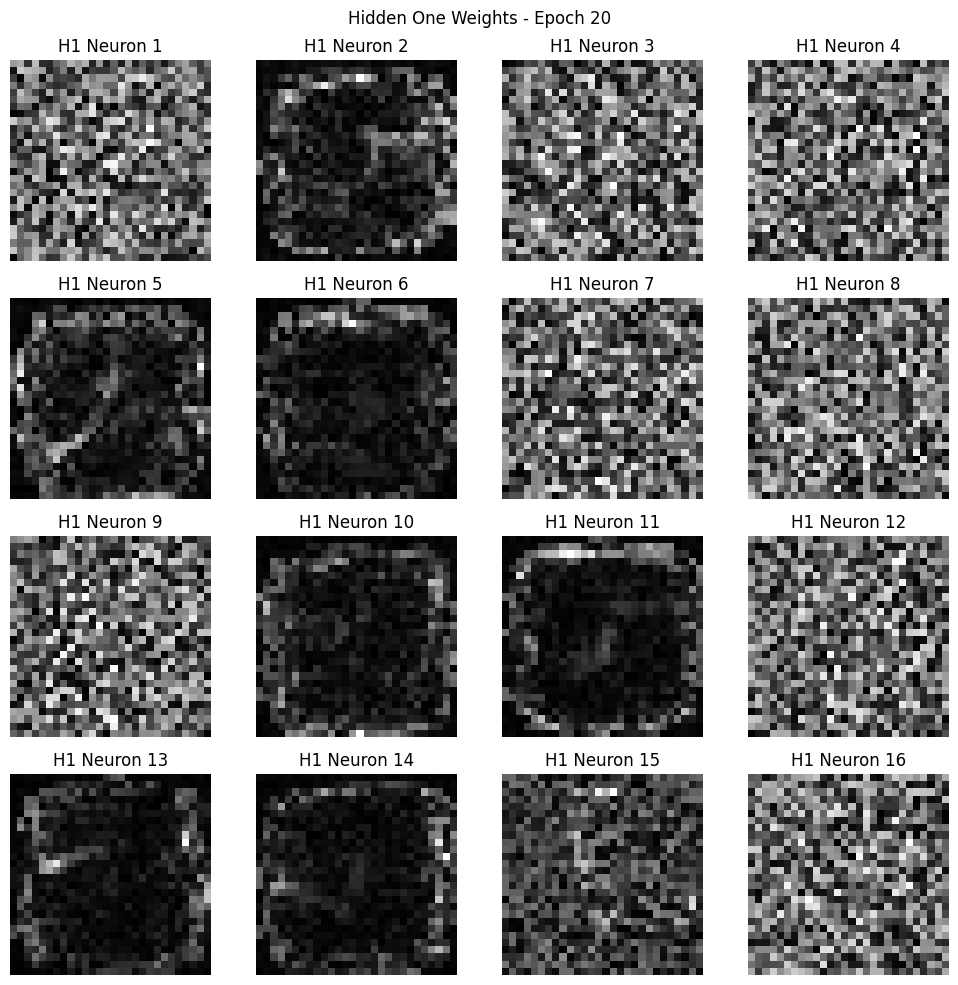

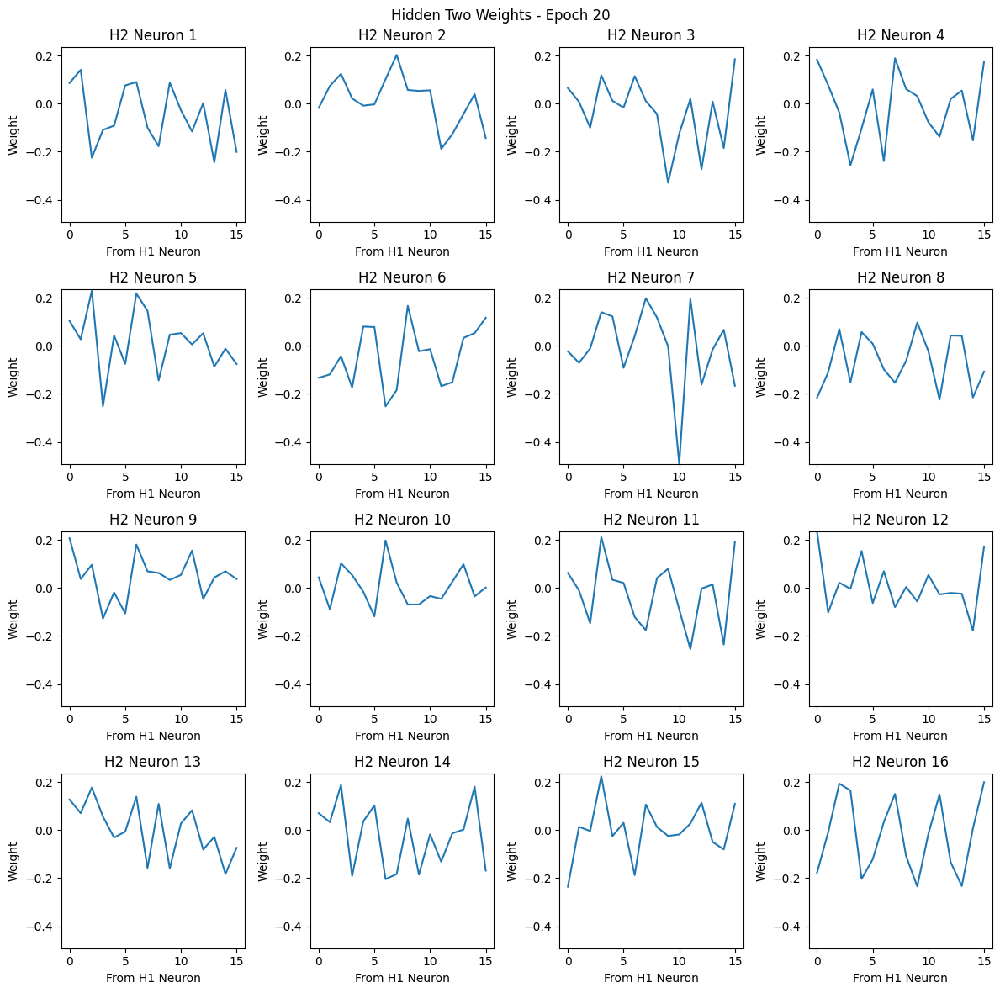

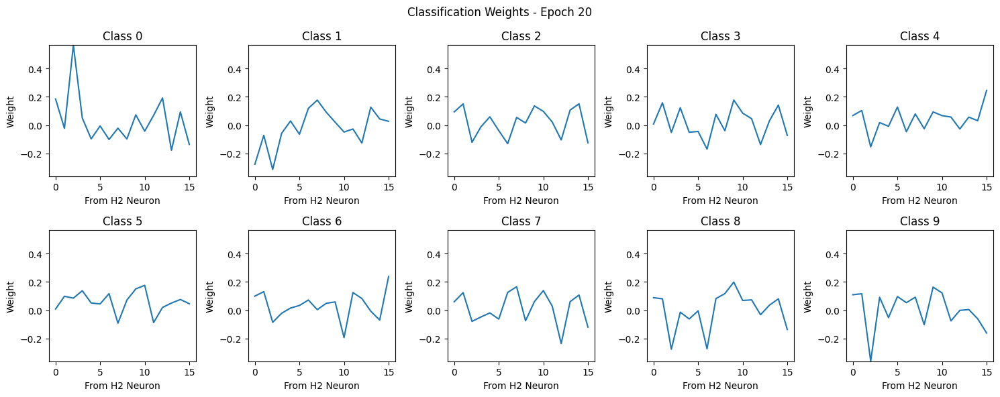

In [23]:
best_model = None
best_sae_one = None
best_sae_two = None
num_epochs = 20

best_val_acc = 0.0
best_val_loss = float('inf')

validation_losses = []
training_losses = []
SAE_hidden_one_losses = []
SAE_hidden_two_losses = []

# Initialize storage for training features and labels
feature_activations_one_train = torch.zeros(HIDDEN_SIZE, len(train_loader.dataset))
feature_activations_two_train = torch.zeros(HIDDEN_SIZE, len(train_loader.dataset))
labels_train = torch.zeros(len(train_loader.dataset), dtype=torch.long)

for epoch in range(num_epochs):
    # --- Training Phase ---
    model.train()  # set the model to training mode - this is currently a no-op
    sae_hidden_two.train()
    sae_hidden_one.train()
    
    train_loss = 0.0
    total_sae_loss_hidden_two = 0.0
    total_sae_loss_hidden_one = 0.0

    train_bar = tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs} [Train]", leave=False)
    for batch_idx, batch in enumerate(train_bar):
        # deconstruct batch items
        images, labels = batch
        images, labels = images.to(device), labels.to(device)
        
        # forward pass
        classification_out, hidden_act_one, hidden_act_two = model(images)

        # Classification loss and backprop
        optimizer.zero_grad()
        total_loss = classification_loss_fn(classification_out, labels)
        total_loss.backward()
        optimizer.step()
        train_loss += total_loss.item()
        train_bar.set_postfix(loss=total_loss.item())

        # to prevent backprop on both graphs:
        hidden_act_one_detached = hidden_act_one.detach()
        hidden_act_two_detached = hidden_act_two.detach()

        # SAE loss and backprop - hidden layer one
        optimizer_sae_hidden_one.zero_grad()
        reconstructed_one, encoded_one = sae_hidden_one(hidden_act_one_detached)
        sae_loss_hidden_one = sae_hidden_one.loss(hidden_act_one_detached,
                                                  reconstructed_one,
                                                  encoded_one,
                                                  l1_lambda=L1_PENALTY
                                                 )
        sae_loss_hidden_one.backward()
        optimizer_sae_hidden_one.step()
        total_sae_loss_hidden_one += sae_loss_hidden_one.item()
        
        # SAE loss and backprop - hidden layer two
        optimizer_sae_hidden_two.zero_grad()
        reconstructed_two, encoded_two = sae_hidden_two(hidden_act_two_detached)
        sae_loss_hidden_two = sae_hidden_two.loss(hidden_act_two_detached,
                                                  reconstructed_two,
                                                  encoded_two,
                                                  l1_lambda=L1_PENALTY
                                                 )
        sae_loss_hidden_two.backward()
        optimizer_sae_hidden_two.step()
        total_sae_loss_hidden_two += sae_loss_hidden_two.item()

        # Store training features and labels
        start_idx = batch_idx * train_loader.batch_size
        end_idx = start_idx + images.size(0)
        feature_activations_one_train[:, start_idx:end_idx] = encoded_one.T.cpu()
        feature_activations_two_train[:, start_idx:end_idx] = encoded_two.T.cpu()
        labels_train[start_idx:end_idx] = labels.cpu()

    # --- Validation Phase ---
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    
    val_bar = tqdm(val_loader, desc=f"Epoch {epoch + 1}/{num_epochs} [Val]", leave=False)
    with torch.no_grad():
        for batch in val_bar:
            # deconstruct
            images, labels = batch
            images, labels = images.to(device), labels.to(device)

            # forward pass
            classification_out, _, _ = model(images)

            # compute loss
            loss = classification_loss_fn(classification_out, labels)

            # calculate metrics
            val_loss += loss.item()
            _, predicted = torch.max(classification_out, 1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)

    # epoch stats
    avg_train_loss = train_loss / len(train_loader)
    avg_val_loss = val_loss / len(val_loader)
    avg_sae_train_loss_hidden_one = total_sae_loss_hidden_one / len(train_loader)
    avg_sae_train_loss_hidden_two = total_sae_loss_hidden_two / len(train_loader)
    val_accuracy = 100 * correct / total

    print(f"Epoch {epoch+1}/{num_epochs}")
    print(f"  Train Loss: {avg_train_loss:.4f}")
    print(f"  SAE Train Loss (hidden one): {avg_sae_train_loss_hidden_one:.4f}")
    print(f"  SAE Train Loss (hidden two): {avg_sae_train_loss_hidden_two:.4f}")
    print(f"  Val Loss: {avg_val_loss:.4f} | Val Acc: {val_accuracy:.2f}%")

    model_path = f'./models/{EXPERIMENT_TYPE}/{RUN_ID}/best_model_baseline_{epoch+1}.pth'
    os.makedirs(os.path.dirname(model_path), exist_ok=True)
    if val_accuracy > best_val_acc:
        best_val_acc = val_accuracy
        best_val_loss = avg_val_loss  # Update loss for reference
        torch.save(model.state_dict(), model_path)
        print(f"  Saved model with Val Acc: {val_accuracy:.2f}%")

        best_model = copy.deepcopy(model)
        best_sae_one = copy.deepcopy(sae_hidden_one)
        best_sae_two = copy.deepcopy(sae_hidden_two)
        
    # Optional: Save if accuracy is equal but loss is lower
    elif val_accuracy == best_val_acc and avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        torch.save(model.state_dict(), model_path)
        print(f"  Saved model with same Val Acc: {val_accuracy:.2f}% but lower Val Loss: {avg_val_loss:.4f}")

        best_model = copy.deepcopy(model)
        best_sae_one = copy.deepcopy(sae_hidden_one)
        best_sae_two = copy.deepcopy(sae_hidden_two)

    validation_losses.append(avg_val_loss)
    training_losses.append(avg_train_loss)
    SAE_hidden_one_losses.append(avg_sae_train_loss_hidden_one)
    SAE_hidden_two_losses.append(avg_sae_train_loss_hidden_two)

    plot_weights(model, epoch, EXPERIMENT_TYPE, RUN_ID)

In [24]:
Z_train_one = feature_activations_one_train.detach().T.numpy()
Z_train_two = feature_activations_two_train.detach().T.numpy()
y_train = labels_train.numpy()

# Training Exploration

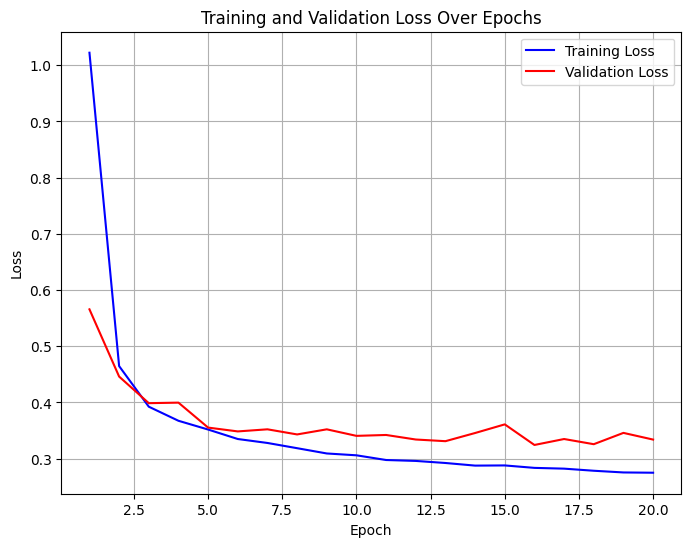

In [25]:
plot_losses(training_losses, validation_losses, label_one="Training", label_two="Validation")

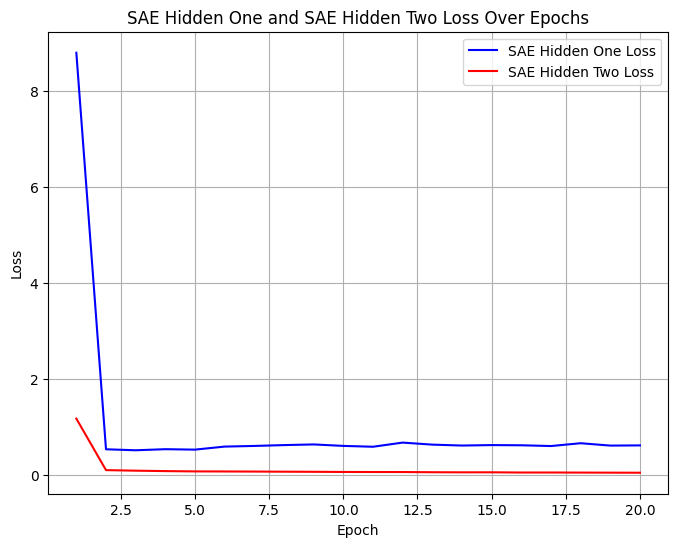

In [26]:
plot_losses(SAE_hidden_one_losses, SAE_hidden_two_losses, 
            label_one="SAE Hidden One", label_two="SAE Hidden Two")

SAEs **still** seem to stop learning really early... again... concerning. At least there is less noise in the training.

## Eval

Evaluating our classification model accuracy, in addition to the reconstruction and sparisty metrics of each SAE.

In [27]:
best_model.eval()  # again currently a no-op
best_sae_one.eval()
best_sae_two.eval()

test_correct = 0
test_total = 0

feature_activations_one_test = torch.zeros(HIDDEN_SIZE, len(test_images))
feature_activations_two_test = torch.zeros(HIDDEN_SIZE, len(test_images))
labels_test = torch.zeros(len(test_images), dtype=torch.long)

recon_errors_one = []
recon_errors_two = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc=f"Evaluation")
    for i, batch in enumerate(test_bar):
        images, labels = batch
        images, labels = images.to(device), labels.to(device)

        # forward pass
        classification_out, hidden_one_act, hidden_two_act = best_model(images)
        reconstructed_one, encoded_one = best_sae_one(hidden_one_act)
        reconstructed_two, encoded_two = best_sae_two(hidden_two_act)

        # SAE reconstruction
        recon_errors_one.append(torch.mean((hidden_one_act - reconstructed_one) ** 2).item())
        recon_errors_two.append(torch.mean((hidden_two_act - reconstructed_two) ** 2).item())

        start_idx = i * test_loader.batch_size
        end_idx = start_idx + images.size(0)
        feature_activations_one_test[:, start_idx:end_idx] = encoded_one.T.cpu()
        feature_activations_two_test[:, start_idx:end_idx] = encoded_two.T.cpu()
        labels_test[start_idx:end_idx] = labels.cpu()

        # stats
        _, predicted = torch.max(classification_out, 1)
        test_correct += (predicted == labels).sum().item()
        test_total += labels.size(0)

Z_test_one = feature_activations_one_test.T.numpy()
Z_test_two = feature_activations_two_test.T.numpy()
y_test = labels_test.numpy()

test_accuracy = 100 * test_correct / test_total
print(f"Final Test Accuracy: {test_accuracy:.2f}%")

# reconstruction accuracy of SAE at each layer
avg_recon_error_one = np.mean(recon_errors_one)
avg_recon_error_two = np.mean(recon_errors_two)
print(f"Average Reconstruction Error (Hidden One): {avg_recon_error_one:.4f}")
print(f"Average Reconstruction Error (Hidden Two): {avg_recon_error_two:.4f}")

# Compute sparsity (average non-zero features per image)
sparsity_one = torch.mean((feature_activations_one_test > 1e-5).float()).item() * 64
sparsity_two = torch.mean((feature_activations_two_test > 1e-5).float()).item() * 64
print(f"Average Non-Zero Features per Image (Hidden One): {sparsity_one:.2f}")
print(f"Average Non-Zero Features per Image (Hidden Two): {sparsity_two:.2f}")

Evaluation: 100%|██████████████████████████████████████████████████████████████████████| 79/79 [00:00<00:00, 287.17it/s]

Final Test Accuracy: 91.11%
Average Reconstruction Error (Hidden One): 0.1686
Average Reconstruction Error (Hidden Two): 0.0237
Average Non-Zero Features per Image (Hidden One): 32.81
Average Non-Zero Features per Image (Hidden Two): 33.70


In [28]:
Z_test_one = feature_activations_one_test.T.numpy()
Z_test_two = feature_activations_two_test.T.numpy()
y_test = labels_test.numpy()

In [29]:
from sklearn.linear_model import LogisticRegression

clf_one = LogisticRegression(penalty='l2', max_iter=1000, n_jobs=-1)
clf_one.fit(Z_train_one, y_train)
acc_one = clf_one.score(Z_test_one, y_test)
print(f"Linear Probe Accuracy (Hidden One): {acc_one:.2%}")

Linear Probe Accuracy (Hidden One): 91.40%


/home/alex/.local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [30]:
clf_two = LogisticRegression(penalty='l2', max_iter=1000, n_jobs=-1)
clf_two.fit(Z_train_two, y_train)
acc_two = clf_two.score(Z_test_two, y_test)
print(f"Linear Probe Accuracy (Hidden Two): {acc_two:.2%}")

Linear Probe Accuracy (Hidden Two): 90.68%


/home/alex/.local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


With a smaller hidden size and smaller penalty we can see that the first SAE is better than the classifier itself. The second SAE is also improved compared to a hidden size of 512 and sparsity penalty of 0.3. SAE might be more linearly separable, or, more likely, our classifer is suboptimal.

# SAE Feature Exploration

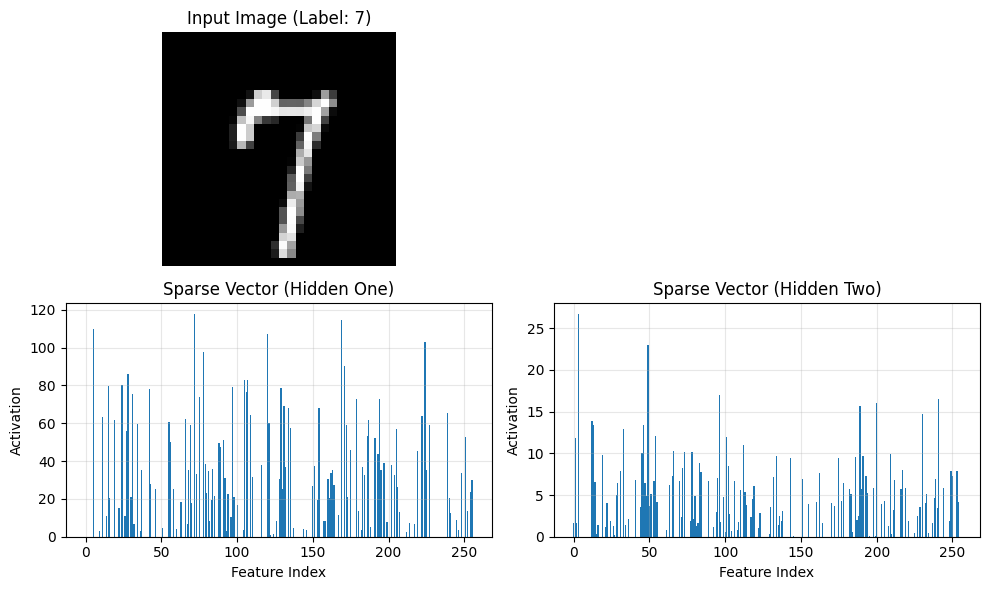

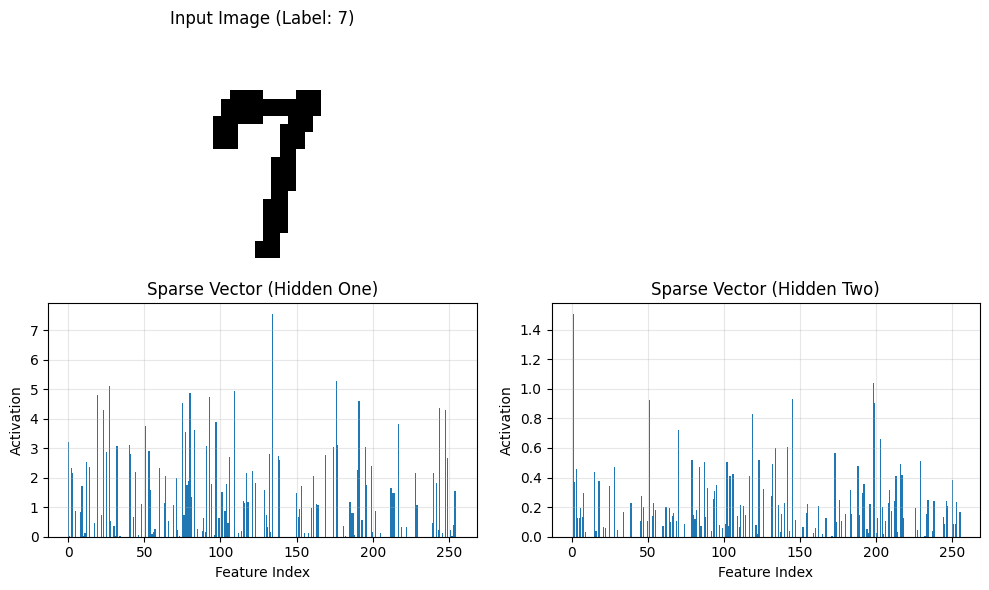

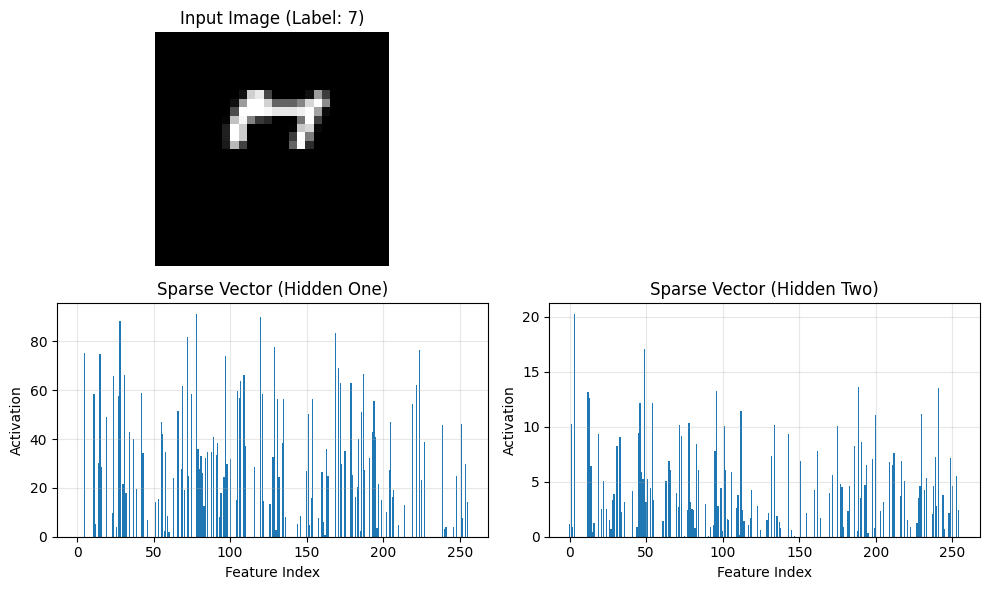

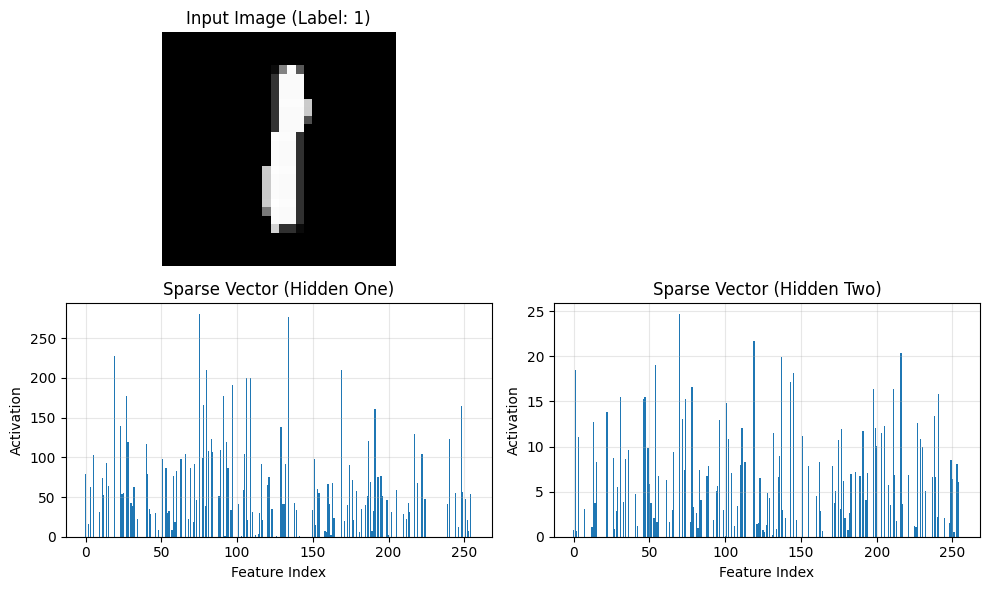

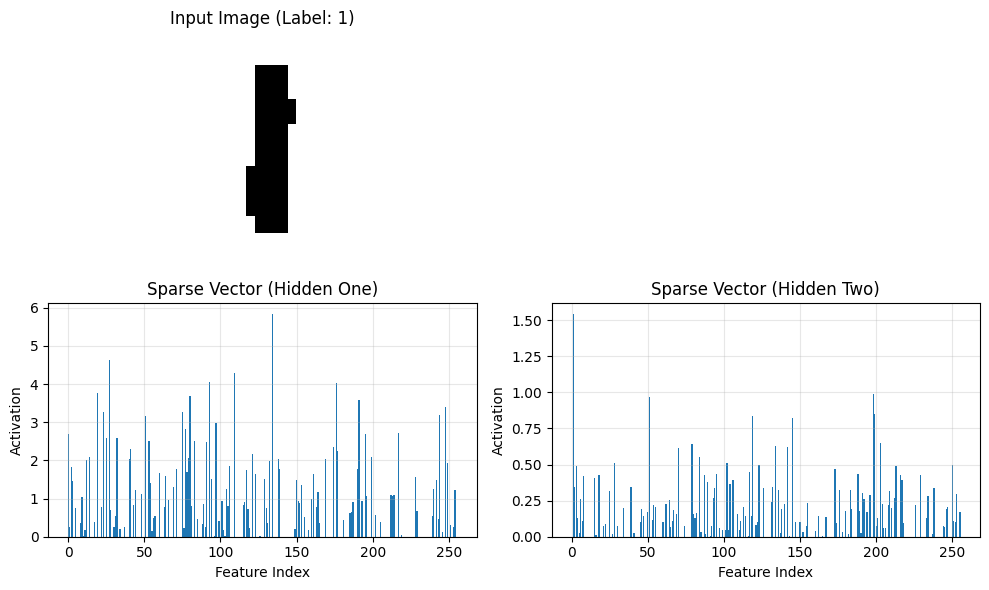

...

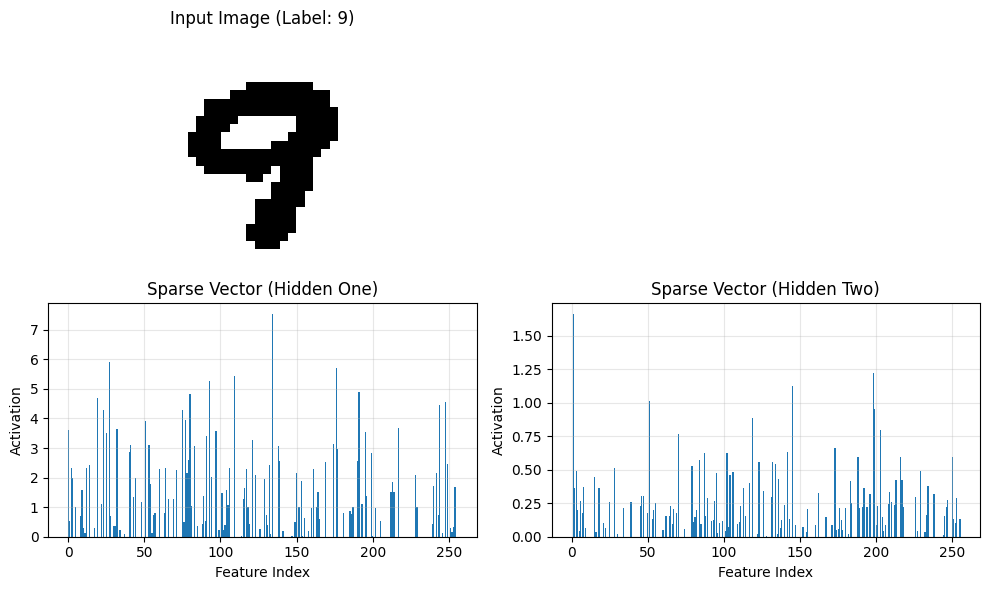

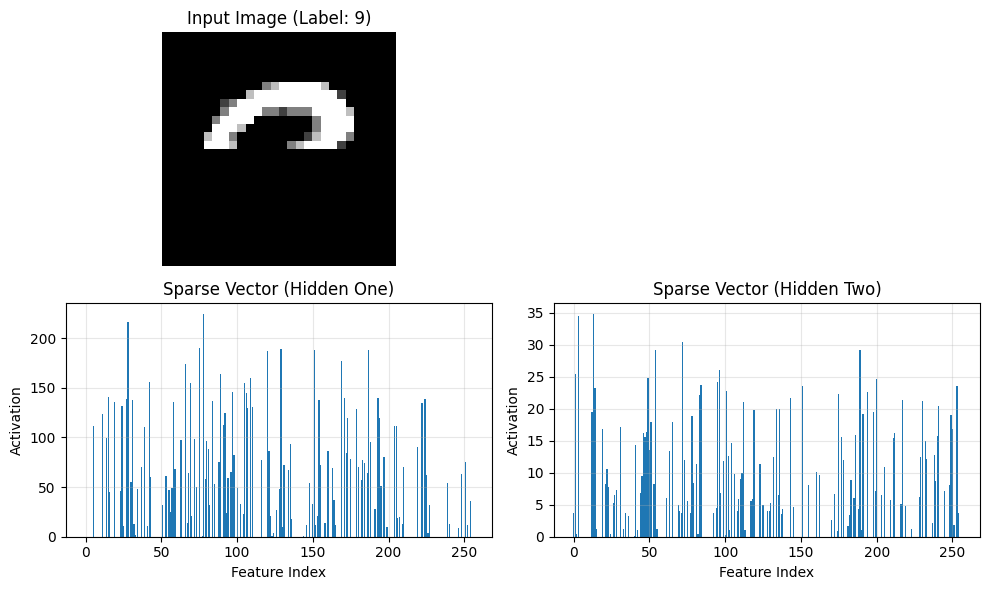

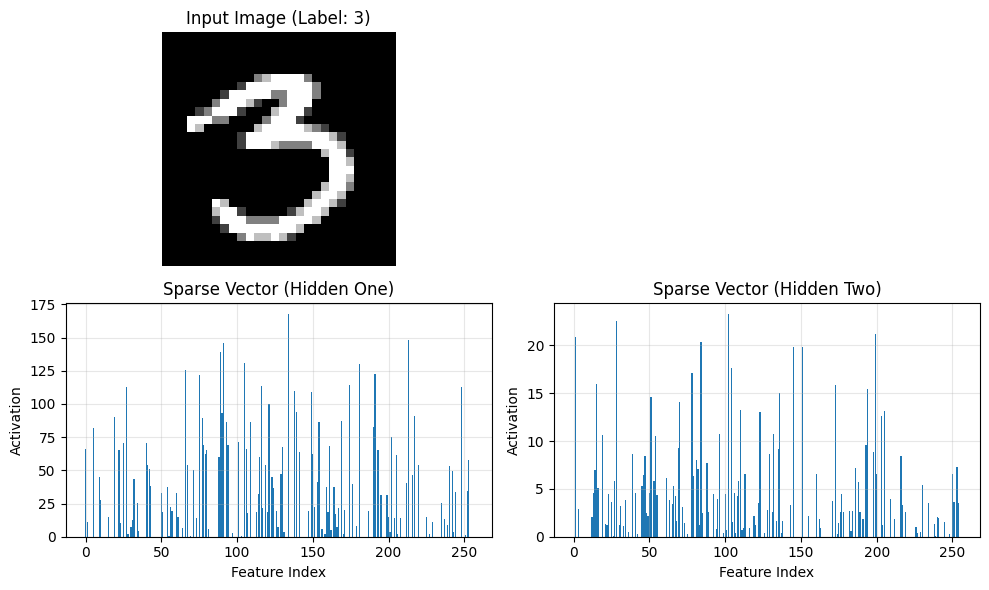

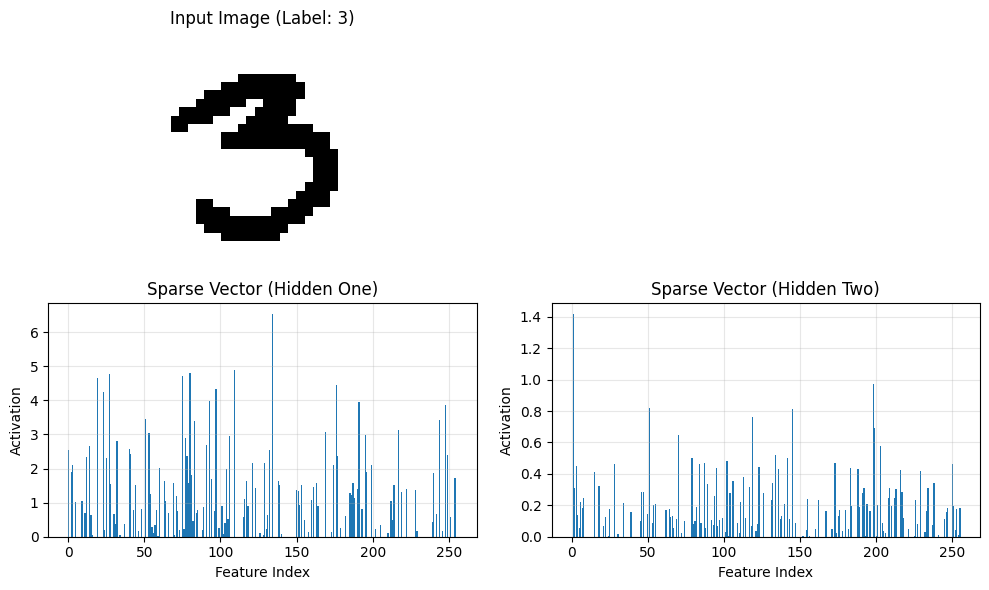

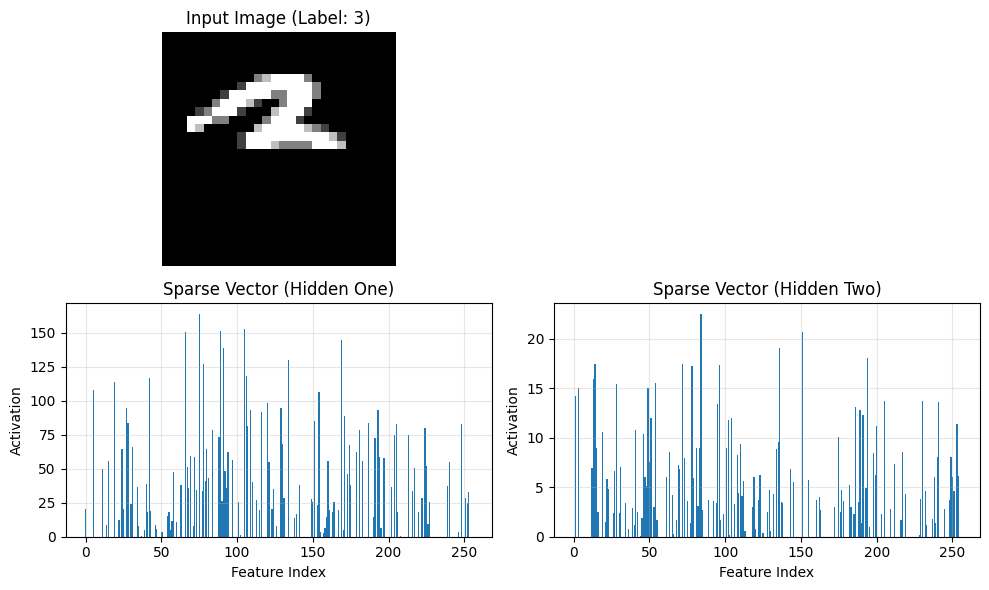

In [31]:
for idx in range(0, 5):
    img, label = train_dataset[idx]
    inverted_img = torch.where(img > 0, torch.zeros_like(img), torch.ones_like(img))

    # Create top-half image
    height, width = img.shape  # Assuming img shape is [C, H, W]
    mask = torch.ones_like(img)  # Initialize mask with ones
    mask[height//2:, :] = 0   # Set bottom half to zero
    top_half_img = img * mask
    
    with torch.no_grad():
        batch_image = img.to(device).unsqueeze(0)  # Shape: [1, C, H, W]
        _, hidden_one_act, hidden_two_act = best_model(batch_image)

        # process inverted image
        batch_inverted_image = inverted_img.to(device).unsqueeze(0)
        _, hidden_one_act_invert, hidden_two_act_invert = best_model(batch_inverted_image)

        # Process top-half image
        batch_top_half_image = top_half_img.to(device).unsqueeze(0)
        _, hidden_one_act_top, hidden_two_act_top = best_model(batch_top_half_image)
    
        # Hidden layer SAEs
        _, encoded_one = best_sae_one(hidden_one_act)
        _, encoded_two = best_sae_two(hidden_two_act)

        # hidden layer SAEs for inverted image
        _, encoded_one_invert = best_sae_one(hidden_one_act_invert)
        _, encoded_two_invert = best_sae_two(hidden_two_act_invert)

        # Hidden layer SAEs for top-half image
        _, encoded_one_top = best_sae_one(hidden_one_act_top)
        _, encoded_two_top = best_sae_two(hidden_two_act_top)
        
        # Squeeze to remove batch dimension and convert to 1D numpy arrays
        encoded_one = encoded_one.squeeze().cpu().numpy()  # Shape: [feature_size]
        encoded_two = encoded_two.squeeze().cpu().numpy()  # Shape: [feature_size]
    
        encoded_one_invert = encoded_one_invert.squeeze().cpu().numpy()
        encoded_two_invert = encoded_two_invert.squeeze().cpu().numpy()

        encoded_one_top = encoded_one_top.squeeze().cpu().numpy()
        encoded_two_top = encoded_two_top.squeeze().cpu().numpy()
    
        plot_sparse_vecs_by_image(img, label, encoded_one, encoded_two)
        plot_sparse_vecs_by_image(inverted_img, label, encoded_one_invert, encoded_two_invert)
        plot_sparse_vecs_by_image(top_half_img, label, encoded_one_top, encoded_two_top)

## Saliency Maps

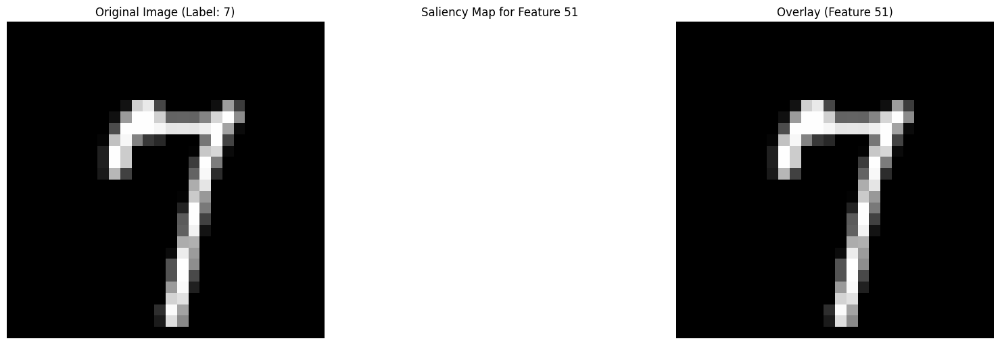

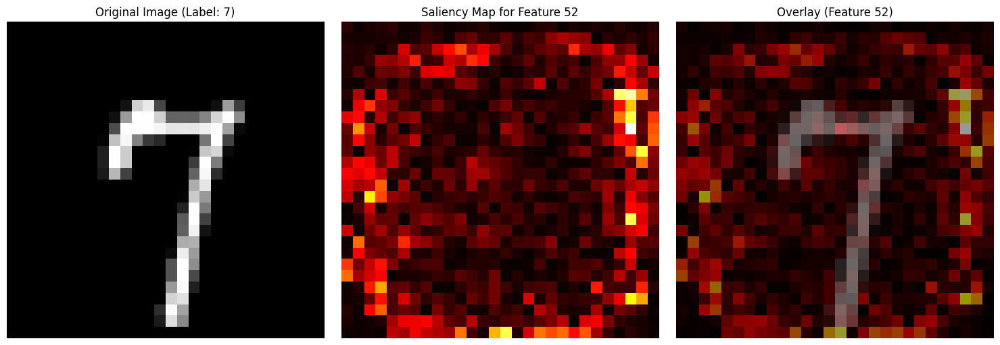

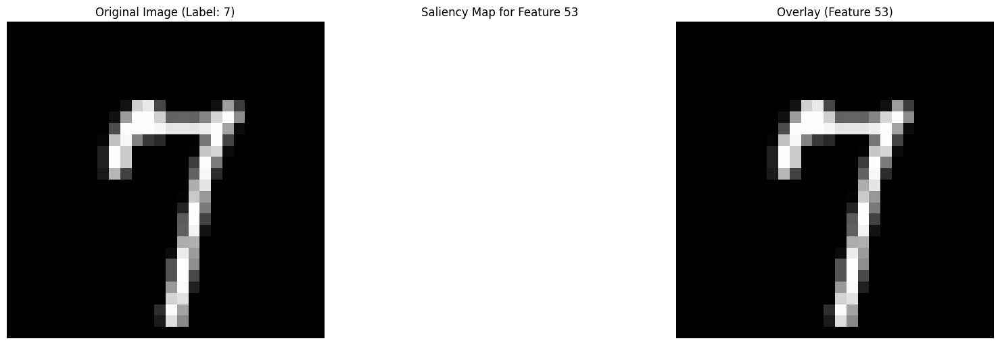

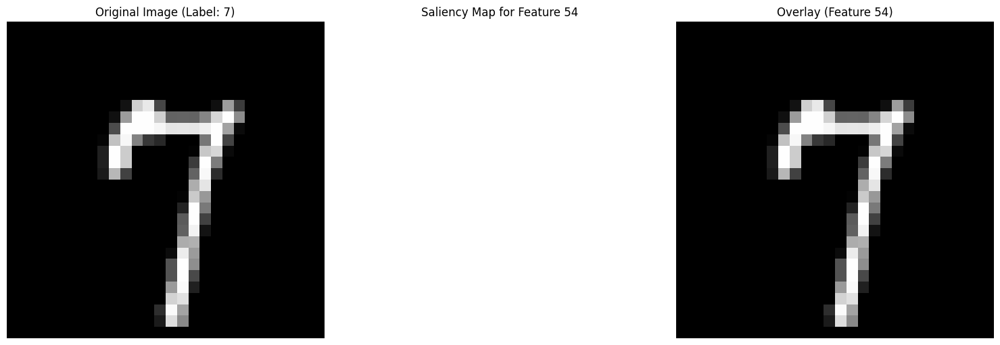

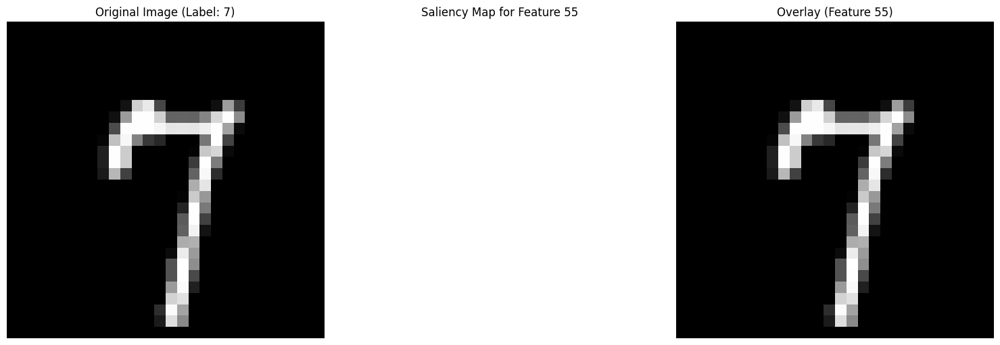

...

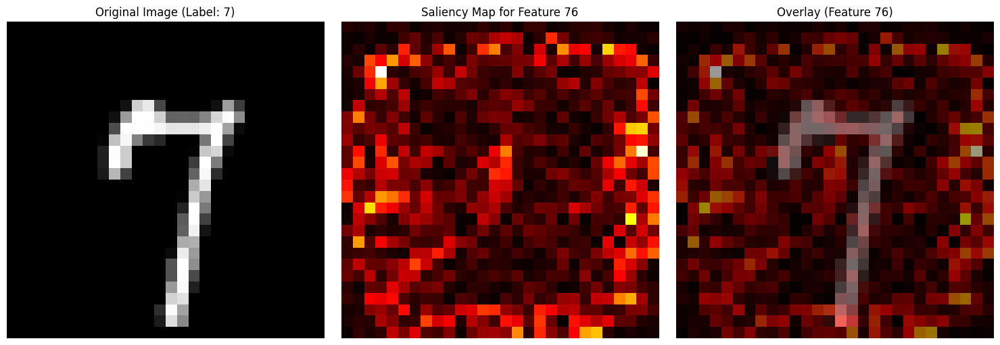

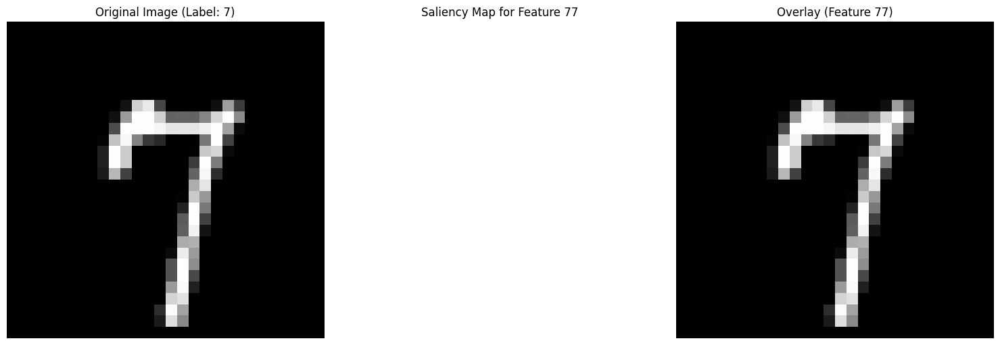

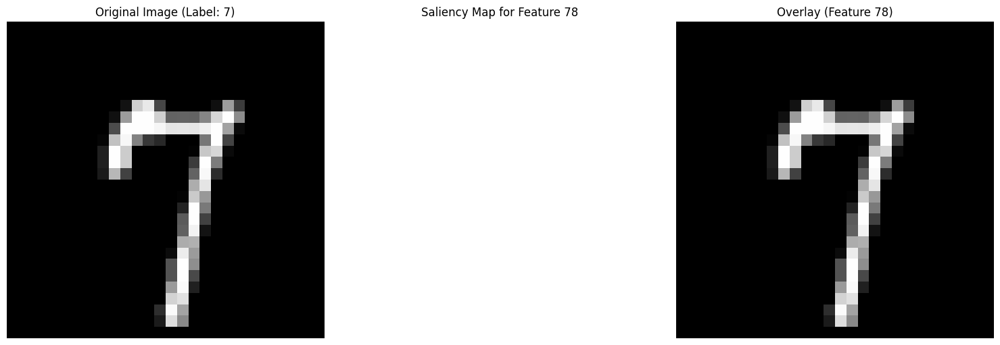

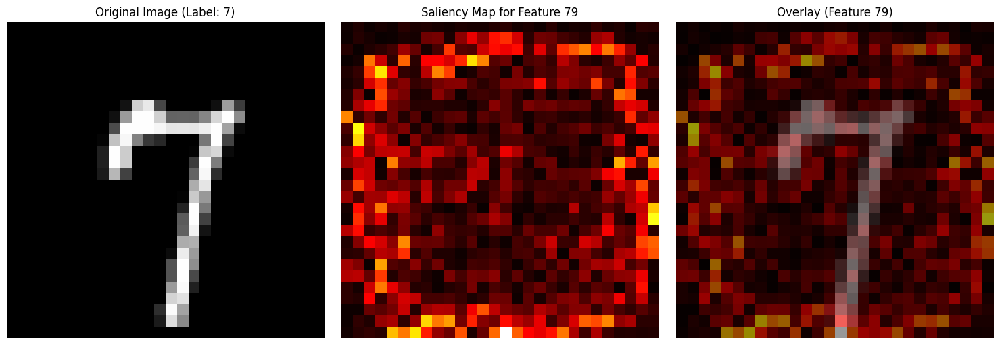

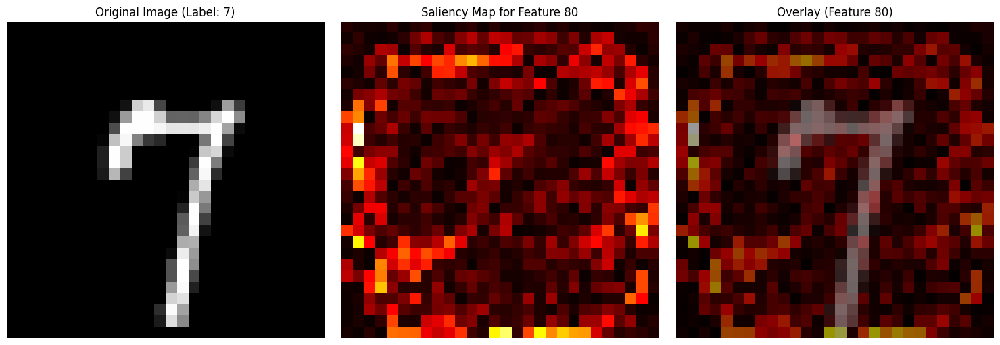

In [38]:
img_idx = 0
for feature_idx in range(50, 80):
    image, label = train_dataset[img_idx]
    
    plot_saliency_map(img_idx, feature_idx, best_model, best_sae_one, train_dataset, HIDDEN_SIZE, device, use_hidden_one=True)

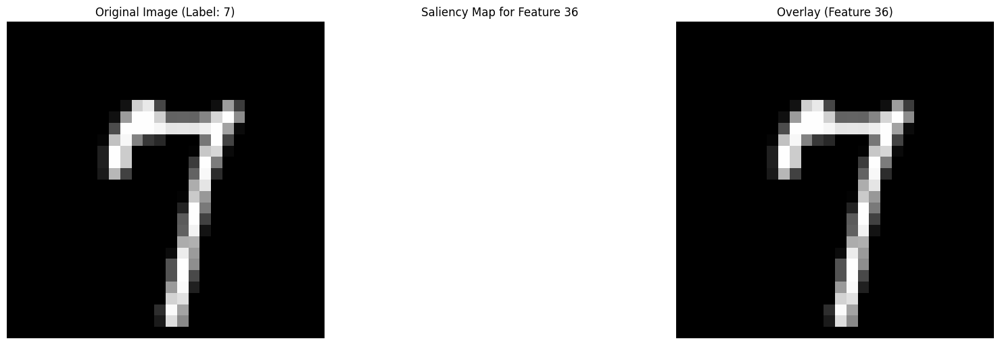

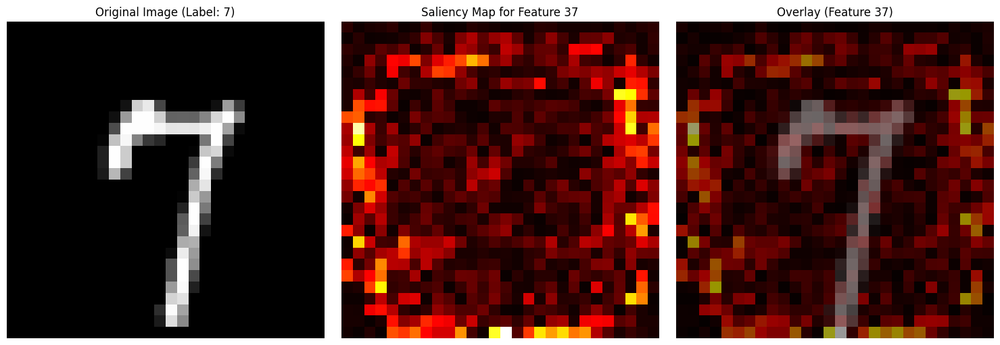

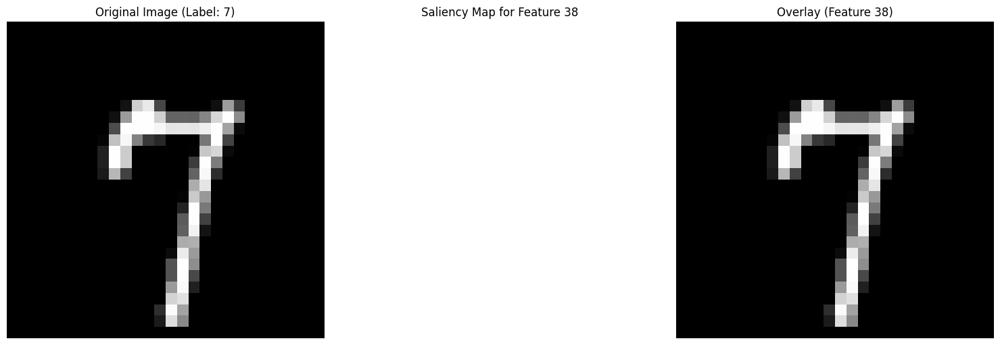

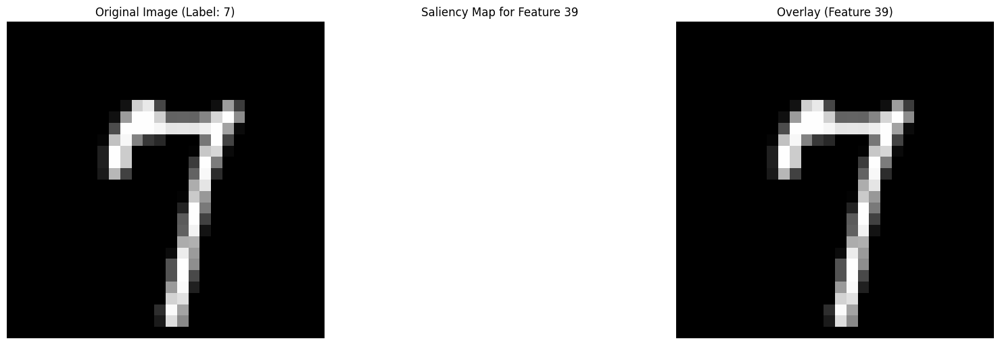

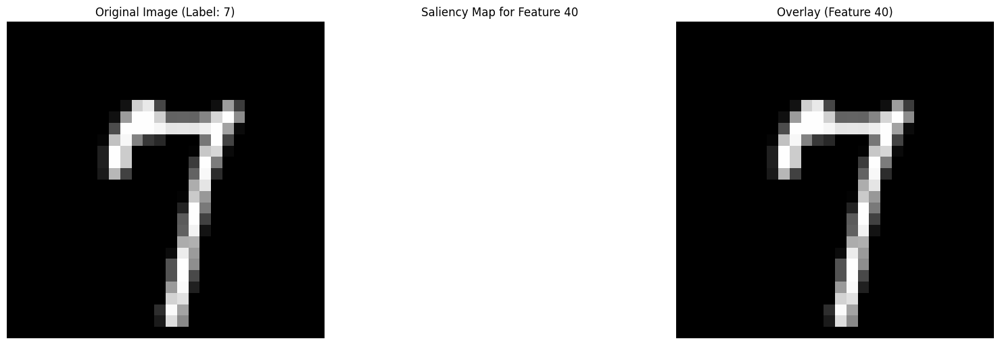

...

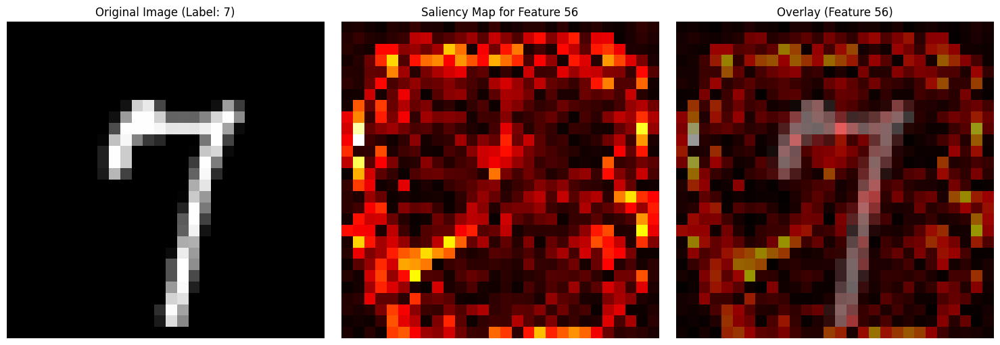

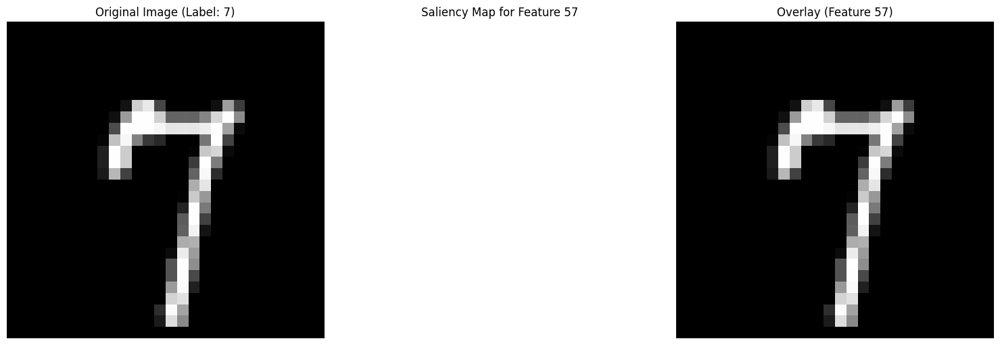

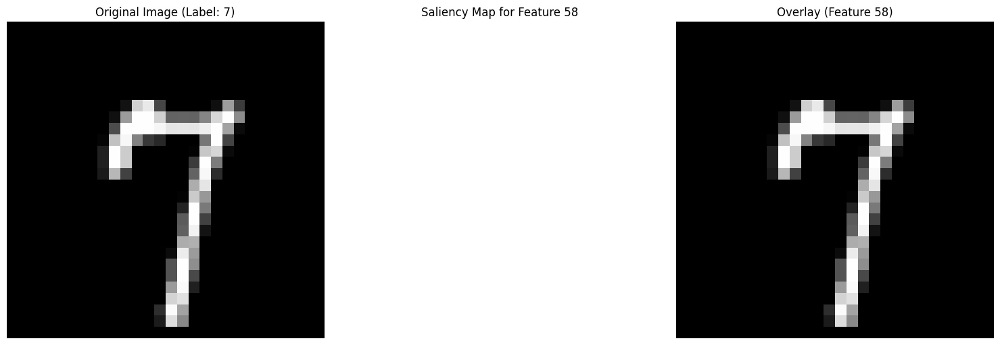

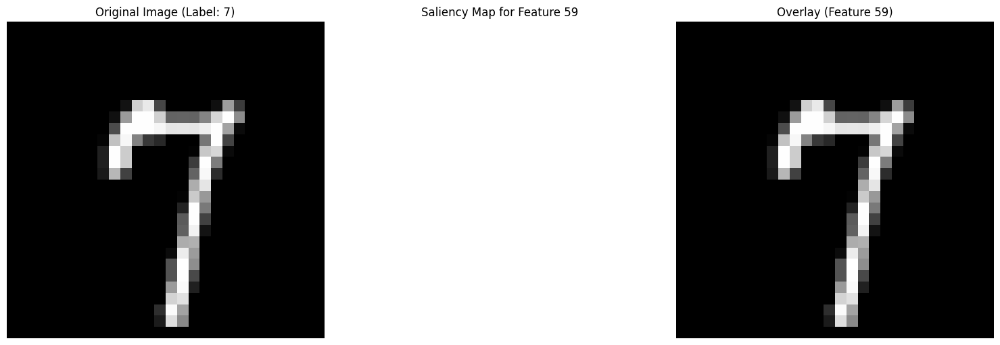

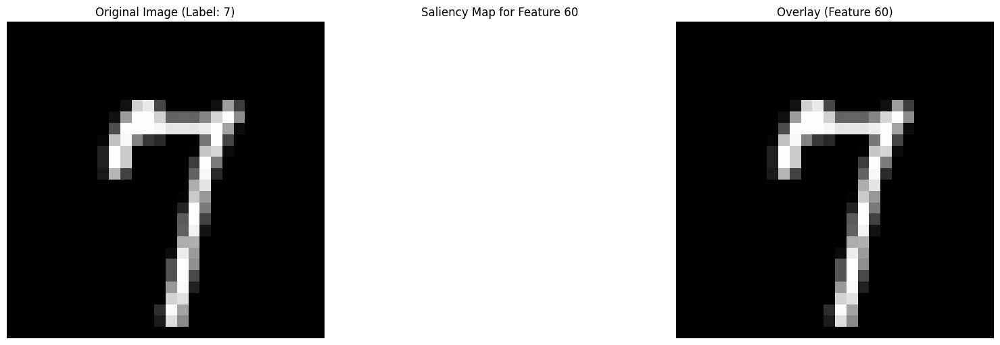

In [39]:
img_idx = 0

for feature_idx in range(35, 60):
    image, label = train_dataset[img_idx]

    plot_saliency_map(img_idx, feature_idx, best_model, best_sae_two, train_dataset, HIDDEN_SIZE, device, use_hidden_one=False)

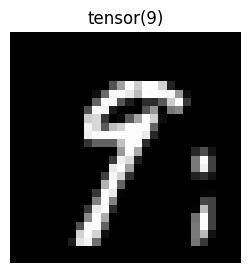

In [41]:
image, label = train_dataset[28657]
visualize_image(image, label)

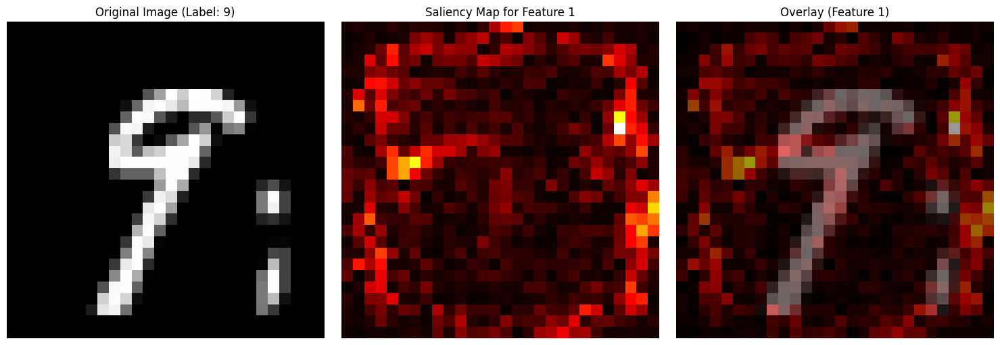

/mnt/SharedData/Projects/ml-fun/mnist-mech-interp/SAEs/graph_helpers.py:118: RuntimeWarning: invalid value encountered in divide
  saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min())


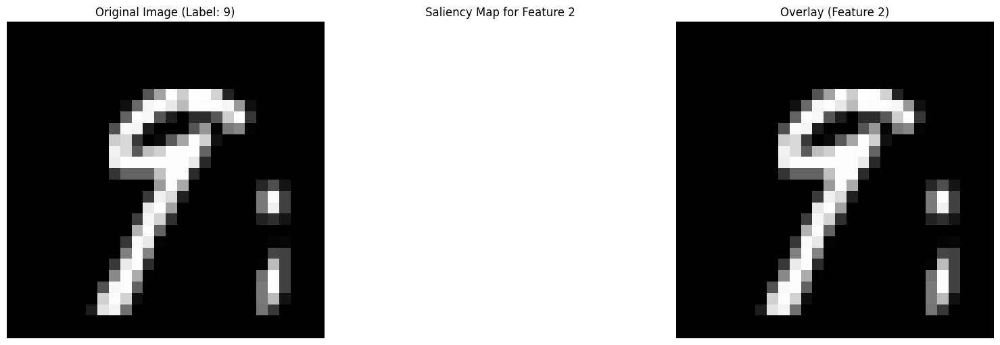

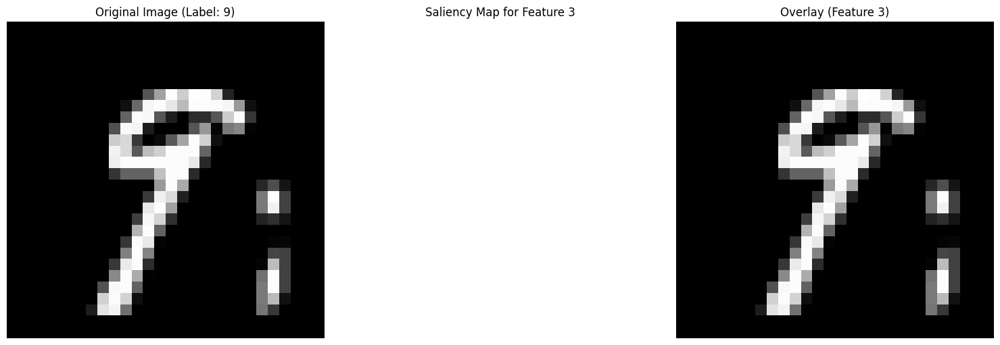

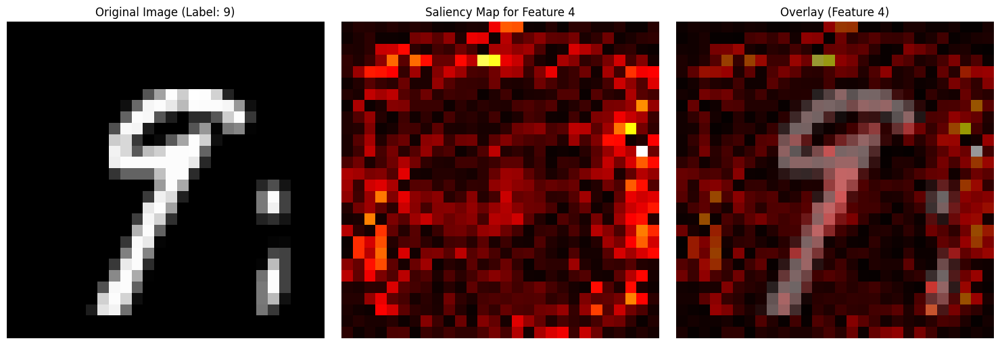

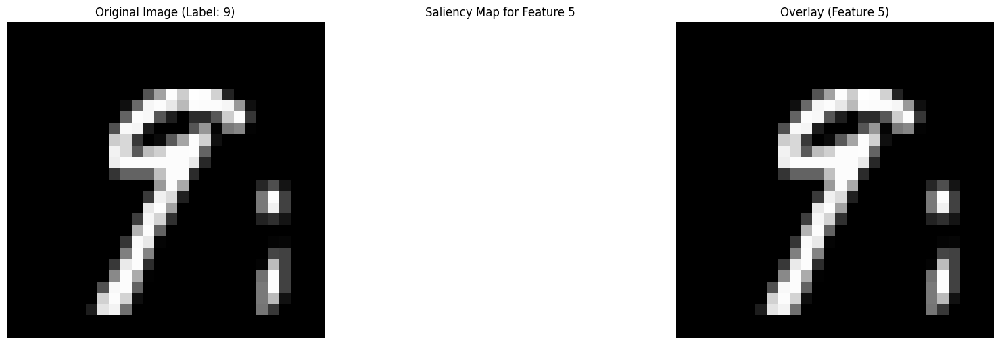

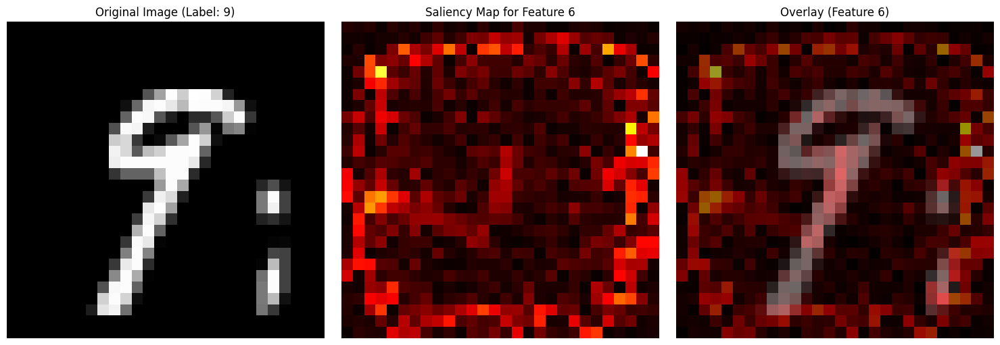

...

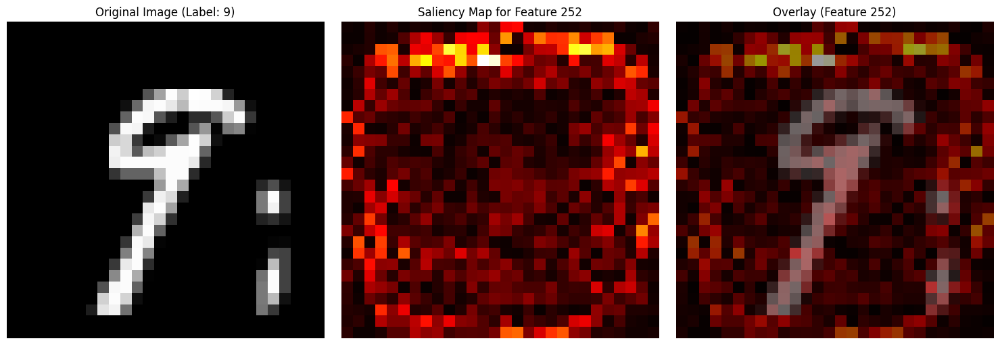

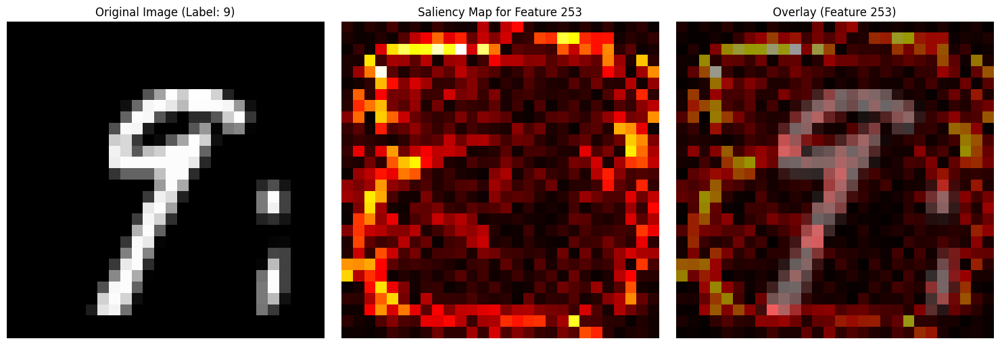

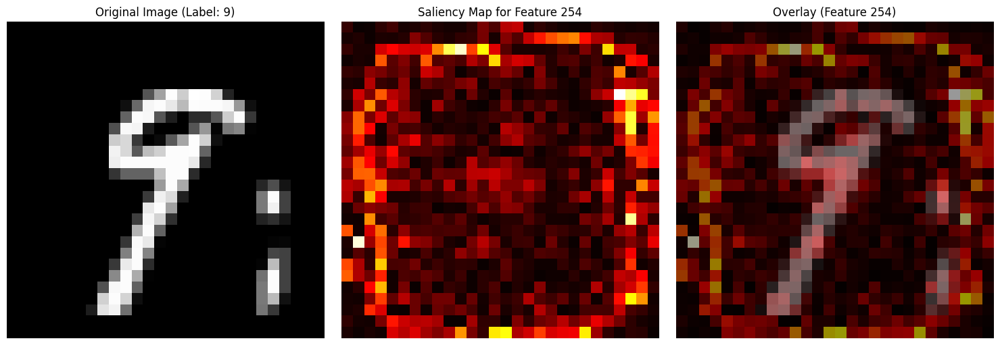

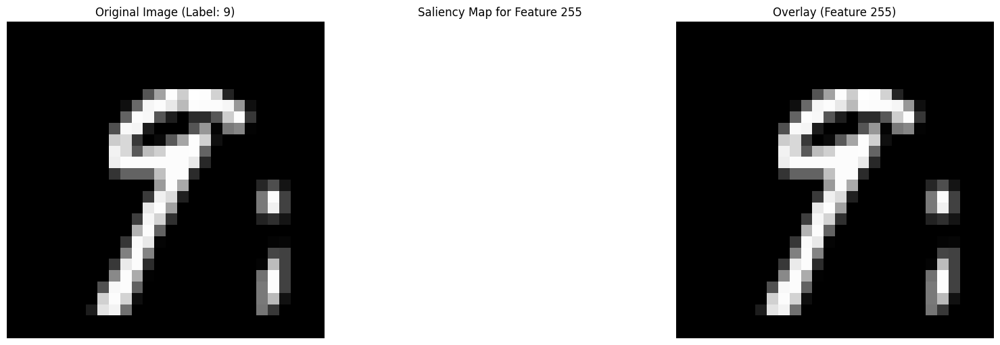

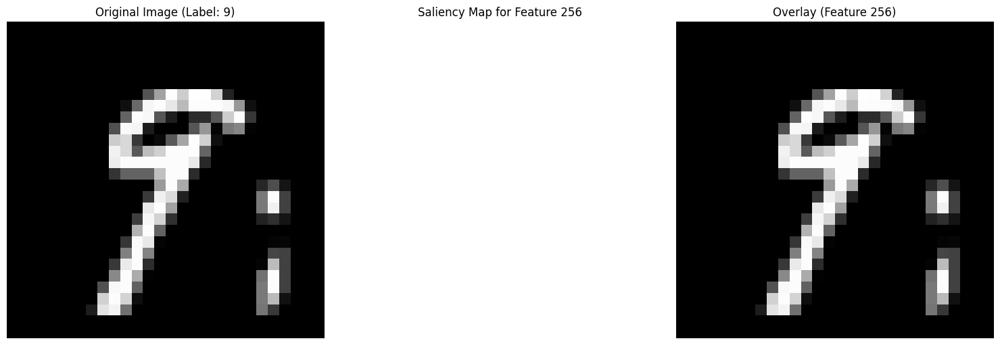

In [43]:
img_idx = 28657
for feature_idx in range(HIDDEN_SIZE):
    image, label = train_dataset[img_idx]
    
    plot_saliency_map(img_idx, feature_idx, best_model, best_sae_one, train_dataset, HIDDEN_SIZE, device, use_hidden_one=True)

In [35]:
inverted_img = torch.where(image > 0, torch.zeros_like(img), torch.ones_like(img)).numpy()
inverted_img = np.expand_dims(inverted_img, axis=0)
label = np.expand_dims(label.numpy(), axis=0)

train_dataset.images = np.concatenate([train_dataset.images, inverted_img], axis=0)
train_dataset.labels = np.concatenate([train_dataset.labels, label], axis=0)

/mnt/SharedData/Projects/ml-fun/mnist-mech-interp/SAEs/graph_helpers.py:118: RuntimeWarning: invalid value encountered in divide
  saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min())


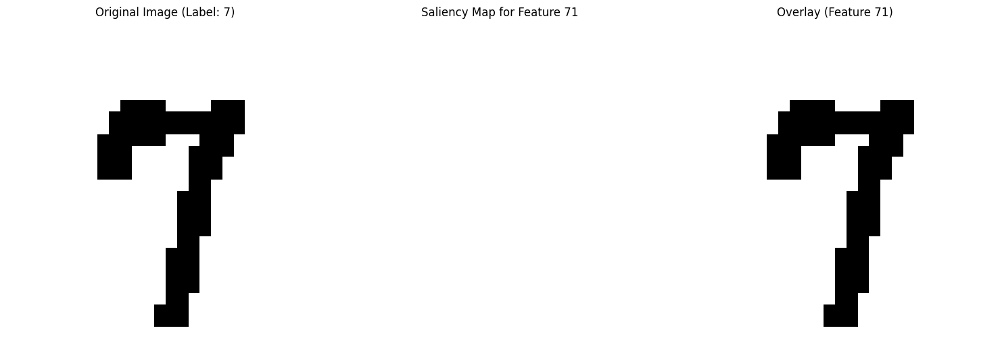

In [36]:
plot_saliency_map(-1, feature_idx, best_model, best_sae_one, train_dataset, HIDDEN_SIZE, device, use_hidden_one=True)